<a href="https://colab.research.google.com/github/dimitra-maoutsa/Geometric-path-augmentation-for-SDEs/blob/main/Geodesic_augmentation_LimitCycle_regression_generating_continous_paths.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install cython
#!pip install POT==0.7.0
#!pip install --upgrade numpy

In [ ]:
#!pip install geomloss[full]
#import torch
#from geomloss import SamplesLoss

#use_cuda = torch.cuda.is_available()
#dtype = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
import os

Mounted at /content/gdrive


In [ ]:
import sys
sys.path.append('/content/gdrive/InferenceDiffusion/')

In [ ]:
!pip install POT==0.8.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 656 kB 17.1 MB/s 


(2, 200)


<Figure size 1296x612 with 0 Axes>

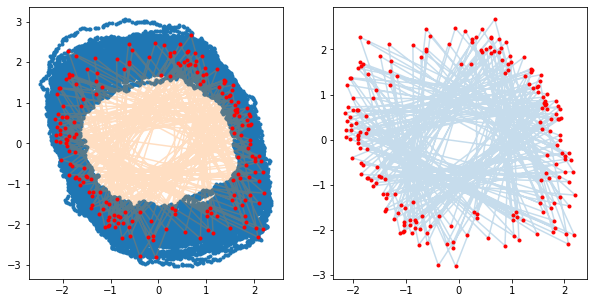

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist,squareform
"""
###Limit cycle function and analytic gradient for passing for comparison calculations
def f(x):#LC
  x0 = -x[1] + x[0]*(1-x[0]**2 -x[1]**2)
  x1 = x[0] + x[1]*(1-x[0]**2 -x[1]**2)
  return np.array([x0,x1])
"""
"""
###decoupled
def f(x, t=0):#
  x0 = -np.sin( x[0])
  x1 = np.cos( x[1])
  return np.array([x0,x1])
"""

from mpl_toolkits import mplot3d



def f(x,t=0,mu=1):#Van der Pol oscillator
    x0 = mu*(x[0] - (1/3)*x[0]**3-x[1])
    x1 = (1/mu)*x[0]
    return np.array([x0,x1])

"""
rho = 28
sigm = 10
beta = 8/3.
def f(x,t=0):
  return  np.array([sigm* (x[1]-x[0]) , x[0]*(rho-x[2])-x[1],x[0]*x[1] - (beta)* x[2]]) # Lorentz 63 rh0=28 :chaotic, rho=0.5 : fixed point

x0 = np.array([-0,-0,5])
"""

h = 0.01 #sim_prec
dt = h
t_start = 0.
T = 500#0
x0 = np.array([1.81, -1.41])

dim = 2
timegrid = np.arange(0,T,h)

F = np.zeros((dim,timegrid.size))
g = 0.25
D = g**2
for ti,t in enumerate(timegrid):
    if ti==0:
        F[:,0] = x0
    else:
        F[:,ti] = F[:,ti-1]+ h* f(F[:,ti-1])+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,))


obs_dens = 250#0#0
timegrid_obs = timegrid[::obs_dens]
plt.figure(figsize=(18,8.5)),
#ax1 = plt.subplot(1,2,1, projection='3d')

#ax1.plot3D(F[0],F[1],F[2],'-')
#ax1.plot3D(F[0,::obs_dens],F[1,::obs_dens],F[2,::obs_dens],'-',alpha=0.25)
#ax1.plot3D(F[0,::obs_dens],F[1,::obs_dens],F[2,::obs_dens],'r.')
#print(F[:,-1])

#ax2 = plt.subplot(1,2,2, projection='3d')

#plt.plot(F[0],F[1],'.')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
#ax2.plot3D(F[0,::obs_dens],F[1,::obs_dens],F[2,::obs_dens],'r.')

#plt.figure()
#plt.plot(F[0])

plt.figure(figsize=(10,5)),
plt.subplot(1,2,1)
plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
#print(F[:,-1])

plt.subplot(1,2,2)
#plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')

Ob = F[:,::obs_dens]
obs_dt=obs_dens*h
### used for broken bridges
distances = squareform(pdist(Ob.T))
print(Ob.shape)


In [ ]:
"""
import numpy as np
import matplotlib.pyplot as plt
import joblib

def f(x,mu=1):#Van der Pol oscillator
    x0 = mu*(x[0] - (1/3)*x[0]**3-x[1])
    x1 = (1/mu)*x[0]
    return np.array([x0,x1])


h = 0.001 #sim_prec
t_start = 0.
T =5000#00
x0 = np.array([1.81, -1.41])
#x0 = np.array([-0., 0])

timegrid = np.arange(0,T,h)

F = np.zeros((2,timegrid.size))
g = 0.1
#F = joblib.load('data_big')
obs_dens = 2000
#plt.figure(figsize=(10,10)),
#plt.plot(F[0],F[1],'.')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
print(F[:,-1])

Ob = F[:,::obs_dens]
obs_dt=obs_dens*h
print(Ob.shape)
#del F
"""

"\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport joblib\n\ndef f(x,mu=1):#Van der Pol oscillator\n    x0 = mu*(x[0] - (1/3)*x[0]**3-x[1])\n    x1 = (1/mu)*x[0]\n    return np.array([x0,x1])\n\n\nh = 0.001 #sim_prec\nt_start = 0.\nT =5000#00\nx0 = np.array([1.81, -1.41])\n#x0 = np.array([-0., 0])\n\ntimegrid = np.arange(0,T,h)\n\nF = np.zeros((2,timegrid.size))\ng = 0.1\n#F = joblib.load('data_big')\nobs_dens = 2000        \n#plt.figure(figsize=(10,10)),\n#plt.plot(F[0],F[1],'.')\n#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-')\n#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')\nprint(F[:,-1])\n\nOb = F[:,::obs_dens]\nobs_dt=obs_dens*h\nprint(Ob.shape)\n#del F\n"

In [ ]:
T

500

In [ ]:
#del F

In [ ]:
#import joblib
#joblib.dump(F,filename='data_big2')
import sys
print(sys.version)

3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]


In [ ]:
#@title Full observation gp
!pip install -q gpflow
import gpflow as gpf

### x shape should be N x ndim
x = F[:,:-1].T

y = (np.diff(F)/dt ).T

noise0 = g**2/dt
print(noise0)
nsparse=200
Zi = np.random.uniform(low=[np.min(x[0]),np.min(x[1])],
                       high=[np.max(x[0]),np.max(x[1])],
                       size=(nsparse,dim) )
#Zi = np.random.uniform(low=[np.min(x[0]),np.min(x[1]),np.min(x[2])],
#                       high=[np.max(x[0]),np.max(x[1]),np.max(x[2])],
#                       size=(nsparse,dim) )
k0 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf0 = gpf.models.sgpr.SGPR(data=(x, y), kernel=k0,noise_variance=noise0, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf.likelihood.variance.assign(noise)

gpf.utilities.print_summary(mf0)
gpf.utilities.set_trainable(k0.variance, True)
gpf.utilities.set_trainable(mf0.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf0.training_loss, mf0.trainable_variables, options=dict(maxiter=200))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf0)

#

     |████████████████████████████████| 383 kB 4.2 MB/s 
     |████████████████████████████████| 104 kB 54.8 MB/s 
6.25
╒══════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤══════════╤═════════╤══════════════════════════════════════╕
│ name                     │ class     │ transform        │ prior   │ trainable   │ shape    │ dtype   │ value                                │
╞══════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪══════════╪═════════╪══════════════════════════════════════╡
│ SGPR.kernel.variance     │ Parameter │ Softplus         │         │ True        │ ()       │ float64 │ 0.10000000000000002                  │
├──────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼──────────┼─────────┼──────────────────────────────────────┤
│ SGPR.kernel.lengthscales │ Parameter │ Softplus         │         │ True        │ (2,)     │ float64 │ [0.1 0.1]                            │
├───────────────

KeyboardInterrupt: ignored

In [ ]:
##@title compute the vector field from fully observed path
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
if dim ==3:
    n=10
    xt = np.mgrid[-25:25:complex(0,n),-20:30:complex(0,n),-0:45:complex(0,n)]
    ##xt = (copy.deepcopy(xt0)).reshape(-1,2)

    mu = np.zeros(xt.shape)
    mu3 = np.zeros(xt.shape)
    ztrue = np.zeros(xt.shape)
    var = np.zeros(xt.shape)
    var3 = np.zeros(xt.shape)
    posterior = mf0.posterior()
    for i in range(n):
      for j in range(n):
          for ki in range(n):
              mu[:,i,j,ki], var[:,i,j,ki] = posterior.predict_f(np.atleast_2d(xt[:,i,j,ki]))


              ztrue[:,i,j,ki] = f(xt[:,i,j,ki])
elif dim==2:
    n=20
    xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
    ##xt = (copy.deepcopy(xt0)).reshape(-1,2)

    mu = np.zeros(xt.shape)
    mu3 = np.zeros(xt.shape)
    ztrue = np.zeros(xt.shape)
    var = np.zeros(xt.shape)
    var3 = np.zeros(xt.shape)
    posterior = mf0.posterior()
    for i in range(n):
      for j in range(n):
        mu[:,i,j], var[:,i,j] = posterior.predict_f(np.atleast_2d(xt[:,i,j]))


        ztrue[:,i,j] = f(xt[:,i,j])


colormap = cm.inferno
#



In [ ]:
Full = np.zeros((dim,timegrid.size))
##trich cache posterior for faster smapling
posterior = mf0.posterior()
def f_full(xo,t=0):
  return (posterior.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T
for ti,t in enumerate(timegrid[:]):
    #print(ti)
    if ti==0:
        Full[:,0] = Ob[:,10]
    else:

        Full[:,ti] = Full[:,ti-1]+ h* f_full(Full[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,))

In [ ]:
#@title compute Wasserstein between full and true density sampled at obs_dens frequency
import ot
a, b = np.ones((Full[:,::obs_dens].shape[1],)) / Full[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)

    res[seed] = ot.sliced_wasserstein_distance(Full[:,::obs_dens].T, Ob.T, a, b, n_projections, seed=seed)

res_mean = np.mean(res, axis=0)
res_std = np.std(res, axis=0)

NameError: ignored

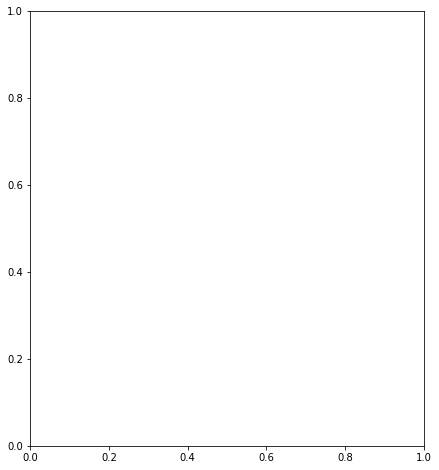

In [ ]:
#@title plot continous time estimations


"""

plt.figure(2)
plt.plot([0,1], [res_mean,res_mean], label="SWD")
plt.plot([0,1], [res_mean - 2 * res_std,res_mean - 2 * res_std], 'k--')
plt.plot([0,1], [res_mean + 2 * res_std,res_mean + 2 * res_std], 'k--')
###plt.fill_between([0,1], [res_mean - 2 * res_std, res_mean + 2 * res_std], alpha=0.5)

plt.legend()
plt.xscale('log')

plt.xlabel("")
plt.ylabel("Distance")
plt.title('Sliced Wasserstein Distance with 95% confidence inverval')

plt.show()
"""

if dim==3:
    plt.figure(figsize=(24,8))
    ax1=plt.subplot(1,3,1,projection='3d')
    ax1.quiver(xt[0],xt[1],xt[2], ztrue[0],ztrue[1], ztrue[2], color='blue', length=0.1, normalize=True)
    ax1.quiver(xt[0],xt[1], xt[2], mu[0],mu[1], mu[2], color='r', alpha=0.65, length=0.1, normalize=True)
    plt.title('esimated initial force field')
    ax2 = plt.subplot(1,3,2,projection='3d')
    ax2.plot3D(F[0],F[1],F[2],'.')
    ax2.plot3D(F[0,::obs_dens],F[1,::obs_dens],F[2,::obs_dens],'-',alpha=0.25)
    ax2.plot3D(F[0,::obs_dens],F[1,::obs_dens],F[2,::obs_dens],'r.')
    plt.title('True invariant density')
    ax3 = plt.subplot(1,3,3,projection='3d')
    ax3.plot3D(Full[0],Full[1],Full[2],'.')
    #plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
    ax3.plot3D(Full[0,::obs_dens],Full[1,::obs_dens],Full[2,::obs_dens],'-',alpha=0.25)
    ax3.plot3D(Full[0,::obs_dens],Full[1,::obs_dens],Full[2,::obs_dens],'r.')
    plt.title('Estimated invariant density from full observations');
elif dim==2:
    plt.figure(figsize=(24,8))
    plt.subplot(1,3,1)
    q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='blue')
    q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='r', alpha=0.65)
    plt.title('esimated initial force field')
    plt.subplot(1,3,2)
    plt.plot(F[0],F[1],'.')
    plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
    plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
    plt.title('True invariant density')
    plt.subplot(1,3,3)
    plt.plot(Full[0],Full[1],'.')
    #plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
    plt.plot(Full[0,::obs_dens],Full[1,::obs_dens],'-',alpha=0.25)
    plt.plot(Full[0,::obs_dens],Full[1,::obs_dens],'r.')
    plt.title('Estimated invariant density from full observations');



In [ ]:
def compute_error(true_x, true_y, est_x, est_y):
  #numb = true_x.size
  error = np.mean(np.sqrt((true_x - est_x)**2 + (true_y-est_y)**2))
  rel_error = np.nanmean(np.sqrt( ((true_x - est_x)/(true_x))**2 + ((true_y-est_y)/true_y)**2))
  return error, rel_error

In [ ]:
error_full, rel_error_full = compute_error(ztrue[0],ztrue[1],  mu[0],mu[1])
print('The error from full path is:', error_full)
print('The relative error from the full path is:', rel_error_full)

The error from full path is: 1.9716851499601729
The relative error from the full path is: 5.717921761182975


First coarse estimation for the drift with Gaussian likelihood

In [ ]:

!pip install -q gpflow
import gpflow as gpf

### x shape should be N x ndim
x = Ob[:,:-1].T

y = (np.diff(Ob)/obs_dt ).T

noise = g**2/obs_dt
print(noise)
nsparse=300
Zi = np.random.uniform(low=[np.min(x[0]),np.min(x[1])], high=[np.max(x[0]),np.max(x[1])], size=(nsparse,2) )
k = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf = gpf.models.sgpr.SGPR(data=(x, y), kernel=k,noise_variance=noise, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf.likelihood.variance.assign(noise)

gpf.utilities.print_summary(mf)
gpf.utilities.set_trainable(k.variance, True)
gpf.utilities.set_trainable(mf.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf.training_loss, mf.trainable_variables, options=dict(maxiter=500))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf)

#

0.025
╒══════════════════════════╤═══════════╤══════════════════╤═════════╤═════════════╤══════════╤═════════╤═════════════════════════════════════╕
│ name                     │ class     │ transform        │ prior   │ trainable   │ shape    │ dtype   │ value                               │
╞══════════════════════════╪═══════════╪══════════════════╪═════════╪═════════════╪══════════╪═════════╪═════════════════════════════════════╡
│ SGPR.kernel.variance     │ Parameter │ Softplus         │         │ True        │ ()       │ float64 │ 0.10000000000000002                 │
├──────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼──────────┼─────────┼─────────────────────────────────────┤
│ SGPR.kernel.lengthscales │ Parameter │ Softplus         │         │ True        │ (2,)     │ float64 │ [0.1 0.1]                           │
├──────────────────────────┼───────────┼──────────────────┼─────────┼─────────────┼──────────┼─────────┼────────────────────────────────

In [ ]:
dim = 2
bnds = np.zeros((dim, 2))
for ii in range(dim):
    bnds[ii] = [np.min(Ob[ii]),   np.max(Ob[ii])]

In [ ]:
#save_dir = 'gdrive/MyDrive/DiffusionInference/Sparse_inference_bridge_augmentation_LC_noise_%.1f_regression_obs_dens_%d/'%(g, obs_dens)
#if os.path.exists(save_dir) == False:
#  os.mkdir(save_dir)

In [ ]:
#@title compute the estimated vector field with fest
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
n=20
xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
##xt = (copy.deepcopy(xt0)).reshape(-1,2)

mu = np.zeros(xt.shape)
mu3 = np.zeros(xt.shape)
ztrue = np.zeros(xt.shape)
var = np.zeros(xt.shape)
var3 = np.zeros(xt.shape)
## this is supposed to speed up evaluations
post = mf.posterior()
for i in range(n):
  for j in range(n):
    mu[:,i,j], var[:,i,j] = post.predict_f(np.atleast_2d(xt[:,i,j]))


    ztrue[:,i,j] = f(xt[:,i,j])

colormap = cm.inferno
#



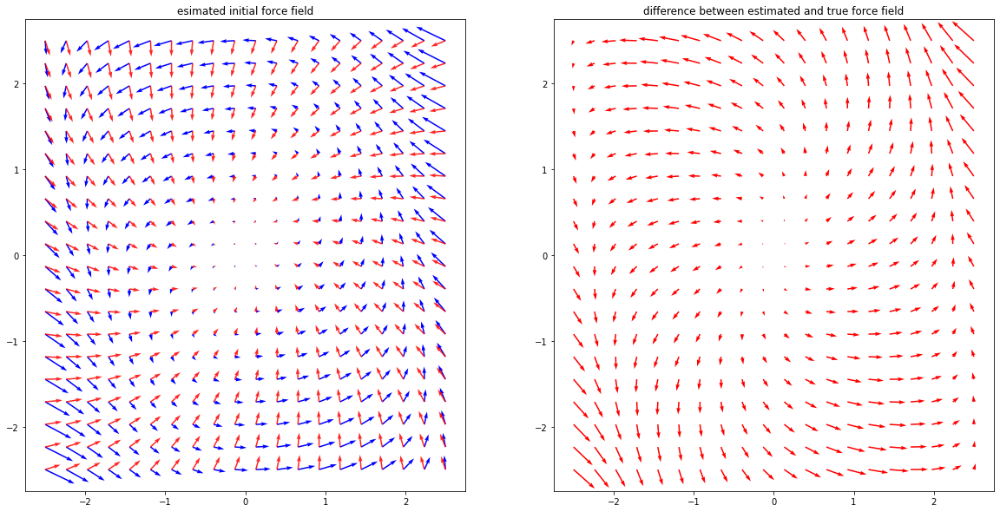

In [ ]:
#zt0 = f(xt0)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='blue')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='r', alpha=0.85)
plt.title('esimated initial force field')



plt.subplot(1,2,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0]-mu[0],ztrue[1]-mu[1], color='r')
#plt.quiver(xt[0],xt[1], mu3[0],mu3[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('difference between estimated and true force field')
#print(mu)
#print(ztrue)
plt.savefig('Initial_fields_g_1_dtobs_%d_Ob_50000.png'%obs_dens)

In [ ]:
error_initial, rel_error_initial = compute_error(ztrue[0],ztrue[1],  mu[0],mu[1])
print('The initial error from the first estimation is:', error_initial)
print('The initial relative error from the first estimation is:', rel_error_initial)

The initial error from the first estimation is: 1.9716851499601729
The initial relative error from the first estimation is: 5.717921761182975


In [ ]:
#from BRIDGE_Multi_D import BRIDGE_ND
M = 50
posterior = mf.posterior()
def f_est(xo,t=0):
  return (posterior.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T


In [ ]:
Fest = np.zeros((2,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        Fest[:,0] = x0
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fest[:,ti] = Fest[:,ti-1]+ h* f_est(Fest[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))



In [ ]:
#@title compute Wasserstein between estimated and true observed density
import ot
a, b = np.ones((Fest[:,::obs_dens].shape[1],)) / Fest[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res2 = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)

    res2[seed] = ot.sliced_wasserstein_distance(Fest[:,::obs_dens].T, Ob.T, a, b, n_projections, seed=seed)

res_mean2 = np.mean(res2, axis=0)
res_std2 = np.std(res2, axis=0)

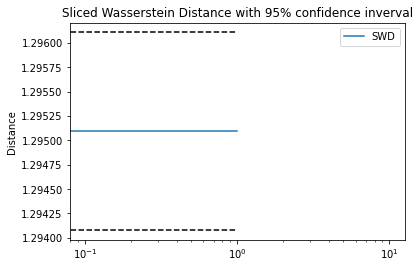

Text(0.5, 1.0, 'Estimated invariant density')

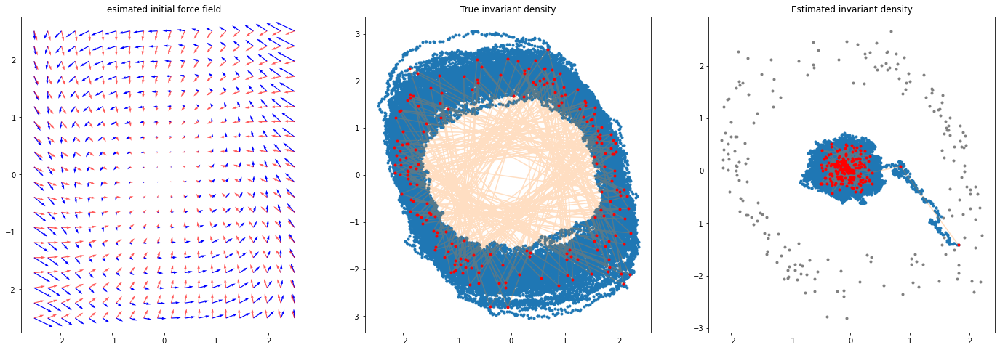

In [ ]:


plt.figure(2)
plt.plot([0,1], [res_mean2,res_mean2], label="SWD")
plt.plot([0,1], [res_mean2 - 2 * res_std2,res_mean2 - 2 * res_std2], 'k--')
plt.plot([0,1], [res_mean2 + 2 * res_std2,res_mean2 + 2 * res_std2], 'k--')
#plt.fill_between([0,1], [res_mean - 2 * res_std, res_mean + 2 * res_std], alpha=0.5)

plt.legend()
plt.xscale('log')

plt.xlabel("")
plt.ylabel("Distance")
plt.title('Sliced Wasserstein Distance with 95% confidence inverval')

plt.show()


plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='blue')
q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='r', alpha=0.65)
plt.title('esimated initial force field')

plt.subplot(1,3,2)
plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
plt.title('True invariant density')
plt.subplot(1,3,3)
plt.plot(Fest[0],Fest[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'r.')
plt.title('Estimated invariant density')

In [ ]:
"""
def new_f(xo, t=0):
    ### to be calle dwith np.atleast_2d(xo).T if 1d, when xo is (dim,1)
    #dim, lo = xo.shape
    #if lo==1:
        #return mf.predict_f_samples(xo.T, lo).numpy().T.squeeze()
    #else:
    return mf.predict_f_samples(xo.T).numpy().T


#def new_fest(xo,t=0):
  #return new_f(xo)
#print(new_fest(np.atleast_2d(x0).T))
"""

In [ ]:
"""
reps = 10
Fnew = np.zeros((dim,reps,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        for di in range(dim):
            Fnew[:,:,0] = x0[di]
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fnew[:,:,ti] = Fnew[:,:,ti-1]+ h* new_f(Fnew[:,:,ti-1])+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps))

"""

In [ ]:
#found_better = False
#while found_better == False:
#    new_f = mf.predict_f_samples

In [ ]:
#print(np.atleast_2d(Z[:,0,0]).shape)
#print(((mf.predict_y(np.atleast_2d(Z[:,:,3].T))[0] ).numpy().T))

In [ ]:
#@title score all dims

def score_function_multid_seperate_all_dims(X,Z,func_out=False, C=0.001,kern ='RBF',l=1,which=1):
    """
    returns function psi(z)
    Input: X: N observations
           Z: sparse points
           func_out : Boolean, True returns function if False return grad-log-p on data points
           l: lengthscale of rbf kernel
           C: weighting constant
           which: return 1: grad log p(x)

    Output: psi: array with density along the given dimension N or N_s x 1

    """

    if kern=='RBF':
        #l = 1 # lengthscale of RBF kernel
        #@numba.njit(parallel=True,fastmath=True)
        def Knumba(x,y,l,res,multil=False): #version of kernel in the numba form when the call already includes the output matrix
            if multil:
                #print('here')
                #res = np.ones((x.shape[0],y.shape[0]))
                for ii in range(len(l)):
                    tempi = np.zeros((x[:,ii].size, y[:,ii].size ), dtype=np.float64)
                    ##puts into tempi the cdist result
                    #print(x[:,ii:ii+1].shape)
                    my_cdist(x[:,ii:ii+1], y[:,ii:ii+1],tempi,'sqeuclidean')

                    res = np.multiply(res,np.exp(-tempi/(2*l[ii]*l[ii])))
                    ##res = np.multiply(res,np.exp(-cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),'sqeuclidean')/(2*l[ii]*l[ii])))
                #return res
            else:
                tempi = np.zeros((x.shape[0], y.shape[0] ), dtype=np.float64)
                #return np.exp(-cdist(x, y,'sqeuclidean')/(2*l*l))
                my_cdist(x, y,tempi,'sqeuclidean') #this sets into the array tempi the cdist result
                res = np.exp(-tempi/(2*l*l))
            return 0

        def K(x,y,l,multil=False):
            if multil:
                #print('here')
                res = np.ones((x.shape[0],y.shape[0]))
                for ii in range(len(l)):
                    tempi = np.zeros((x[:,ii].size, y[:,ii].size ))
                    ##puts into tempi the cdist result
                    my_cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),tempi,'sqeuclidean')
                    res = np.multiply(res,np.exp(-tempi/(2*l[ii]*l[ii])))
                    ##res = np.multiply(res,np.exp(-cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),'sqeuclidean')/(2*l[ii]*l[ii])))
                return res
            else:
                tempi = np.zeros((x.shape[0], y.shape[0] ))
                #return np.exp(-cdist(x, y,'sqeuclidean')/(2*l*l))
                my_cdist(x, y,tempi,'sqeuclidean') #this sets into the array tempi the cdist result
                return np.exp(-tempi/(2*l*l))
            #return np.exp(-(x-y.T)**2/(2*l*l))
            #return np.exp(np.linalg.norm(x-y.T, 2)**2)/(2*l*l)
        #@njit
        def grdx_K_all(x,y,l,multil=False): #gradient with respect to the 1st argument - only which_dim
            N,dim = x.shape
            M,_ = y.shape
            diffs = x[:,None]-y
            redifs = np.zeros((1*N,M,dim))
            for ii in range(dim):

                if multil:
                    redifs[:,:,ii] = np.multiply(diffs[:,:,ii],K(x,y,l,True))/(l[ii]*l[ii])
                else:
                    redifs[:,:,ii] = np.multiply(diffs[:,:,ii],K(x,y,l))/(l*l)
            return redifs
            #return -(1./(l*l))*(x-y.T)*K(x,y)

        def grdx_K(x,y,l,which_dim=1,multil=False): #gradient with respect to the 1st argument - only which_dim
            N,dim = x.shape
            M,_ = y.shape
            diffs = x[:,None]-y
            redifs = np.zeros((1*N,M))
            ii = which_dim -1
            #print('diffs:',diffs)
            if multil:
                redifs = np.multiply(diffs[:,:,ii],K(x,y,l,True))/(l[ii]*l[ii])
                #print(redifs.shape)
            else:
                redifs = np.multiply(diffs[:,:,ii],K(x,y,l))/(l*l)
            return redifs


            #############################################################################
    elif kern=='periodic': ###############################################################################################
      ###periodic kernel
        ## K(x,y) = exp(  -2 * sin^2( pi*| x-y  |/ (2*pi)  )   /l^2)

        ## Kx(x,y) = (K(x,y)* (x - y) cos(abs(x - y)/2) sin(abs(x - y)/2))/(l^2 abs(x - y))
        ## -(2 K(x,y) π (x - y) sin((2 π abs(x - y))/per))/(l^2 s abs(x - y))
      per = 2*np.pi ##period of the kernel
      #l = 0.5
      def K(x,y,l,multil=False):

        if multil:
          #print('here')
          res = np.ones((x.shape[0],y.shape[0]))
          for ii in range(len(l)):
              tempi = np.zeros((x[:,ii].size, y[:,ii].size ))
              ##puts into tempi the cdist result
              #my_cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),tempi, 'l1')
              #res = np.multiply(res, np.exp(- 2* (np.sin(tempi/ 2 )**2) /(l[ii]*l[ii])) )
              res = np.multiply(res, np.exp(- 2* (np.sin(cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),'minkowski', p=1)/ 2 )**2) /(l[ii]*l[ii])) )
          return -res
        else:
            tempi = np.zeros((x.shape[0], y.shape[0] ))
            ##puts into tempi the cdist result
            #my_cdist(x, y, tempi,'l1')
            #res = np.exp(-2* ( np.sin( tempi / 2 )**2 ) /(l*l) )
            res = np.exp(-2* ( np.sin( cdist(x, y,'minkowski', p=1) / 2 )**2 ) /(l*l) )
            return res

      def grdx_K(x,y,l,which_dim=1,multil=False): #gradient with respect to the 1st argument - only which_dim
          N,dim = x.shape
          diffs = x[:,None]-y
          #print('diffs:',diffs)
          redifs = np.zeros((1*N,N))
          ii = which_dim -1
          #print(ii)
          if multil:
              redifs = np.divide( np.multiply( np.multiply( np.multiply( -2*K(x,y,l,True),diffs[:,:,ii] ),np.sin( np.abs(diffs[:,:,ii]) / 2) ) ,np.cos( np.abs(diffs[:,:,ii])  / 2) ) , (l[ii]*l[ii]* np.abs(diffs[:,:,ii]))  )
          else:
              redifs = np.divide( np.multiply( np.multiply( np.multiply( -2*diffs[:,:,ii],np.sin( np.abs(diffs[:,:,ii]) / 2) ) ,K(x,y,l) ),np.cos( np.abs(diffs[:,:,ii]) / 2) ) ,(l*l* np.abs(diffs[:,:,ii])) )
          return -redifs

    dim = X.shape[1]

    if isinstance(l, (list, tuple, np.ndarray)):
       multil = True
       ### for different lengthscales for each dimension
       #K_xz =  np.ones((X.shape[0],Z.shape[0]), dtype=np.float64)
       #Knumba(X,Z,l,K_xz,multil=True)
       K_xz = K(X,Z,l,multil=True)
       #Ks =  np.ones((Z.shape[0],Z.shape[0]), dtype=np.float64)
       #Knumba(Z,Z,l,Ks,multil=True)
       Ks = K(Z,Z,l,multil=True)

       #print(Z.shape)
       Ksinv = np.linalg.inv(Ks+ 1e-3 * np.eye(Z.shape[0]))
       A = K_xz.T @ K_xz

       gradx_K = -grdx_K_all(X,Z,l,multil=True) #-
       gradxK = np.zeros((X.shape[0],Z.shape[0],dim))
       for ii in range(dim):
           gradxK[:,:,ii] = -grdx_K(X,Z,l,multil=True,which_dim=ii+1)
       # if not(Test_p == 'None'):
       #     K_sz = K(Test_p,Z,l,multil=True)
       np.testing.assert_allclose(gradxK, gradx_K)
    else:
        multil = False

        K_xz = K(X,Z,l,multil=False)

        Ks = K(Z,Z,l,multil=False)

        Ksinv = np.linalg.inv(Ks+ 1e-3 * np.eye(Z.shape[0]))
        A = K_xz.T @ K_xz

        gradx_K = -grdx_K_all(X,Z,l,multil=False)   #shape: (N,M,dim)
    sumgradx_K = np.sum(gradx_K ,axis=0) ##last axis will have the gradient for each dimension ### shape (M, dim)
    #print( sumgradx_K.shape )
    if func_out==False: #if output wanted is evaluation at data points

        # res1 = np.zeros((N, dim))
        # ### evaluatiion at data points
        # for di in range(dim):
        #     res1[:,di] = -K_xz @ np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0]))@ Ksinv@sumgradx_K[:,di]


        res1 = -K_xz @ np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0]))@ Ksinv@sumgradx_K


        #res1 = np.einsum('ik,kj->ij', -K_xz @ np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0]))@ Ksinv, sumgradx_K)


    else:
        #### for function output
        if multil:
            #res = np.ones((x.shape[0],y.shape[0]))
            #for ii in range(len(l)):
            if kern=='RBF':
                K_sz = lambda x: reduce(np.multiply, [ np.exp(-cdist(x[:,iii].reshape(-1,1), Z[:,iii].reshape(-1,1),'sqeuclidean')/(2*l[iii]*l[iii])) for iii in range(x.shape[1]) ])


            elif kern=='periodic':
                K_sz = lambda x: np.multiply(np.exp(-2*(np.sin( cdist(x[:,0].reshape(-1,1), Z[:,0].reshape(-1,1), 'minkowski', p=2)/(l[0]*l[0])))),np.exp(-2*(np.sin( cdist(x[:,1].reshape(-1,1), Z[:,1].reshape(-1,1),'sqeuclidean')/(l[1]*l[1])))))


            #return K_sz
        else:
            if kern=='RBF':
                K_sz = lambda x: np.exp(-cdist(x, Z,'sqeuclidean')/(2*l*l))
            elif kern=='periodic':
                K_sz = lambda x: np.exp(-2* ( np.sin( cdist(x, Z,'minkowski', p=1) / 2 )**2 ) /(l*l) )
            #return K_sz

        res1 = lambda x: K_sz(x) @ ( -np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0])) ) @ Ksinv@sumgradx_K
        # res1 = np.zeros((N, dim))
        # for di in range(dim):
        #     res1 = lambda x: K_sz(x) @ ( -np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0])) ) @ Ksinv@sumgradx_K[:,di]


        #np.testing.assert_allclose(res2, res1)

    return res1   ### shape out N x dim

In [ ]:
import numba

In [ ]:
#@title cdist
def my_cdist(r,y, output,dist='euclidean'):
    """
    Fast computation of pairwise distances between data points in r and y matrices.
    Stores the distances in the output array.
    Available distances: 'euclidean' and 'seucledian'
    Parameters
    ----------
    r : NxM array
        First set of N points of dimension M.
    y : N2xM array
        Second set of N2 points of dimension M.
    output : NxN2 array
        Placeholder for storing the output of the computed distances.
    dist : type of distance, optional
        Select 'euclidian' or 'sqeuclidian' for Euclidian or squared Euclidian
        distances. The default is 'euclidean'.

    Returns
    -------
    None. (The result is stored in place in the input array output).

    """
    N, M = r.shape
    N2, M2 = y.shape
    #assert( M == M2, 'The two inpus have different second dimention! Input should be N1xM and N2xM')
    if dist == 'euclidean':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp += (r[i, k] - y[j, k])**2
                output[i,j] = math.sqrt(tmp)
    elif dist == 'sqeuclidean':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp += (r[i, k] - y[j, k])**2
                output[i,j] = tmp
    elif dist == 'l1':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp += (r[i, k] - y[j, k])**2
                output[i,j] = math.sqrt(tmp)
    return 0


In [ ]:
#@title gradlog
import numpy as np
from sklearn.metrics.pairwise import pairwise_kernels
from numpy.linalg import pinv
from functools import reduce
from scipy.stats import gamma,norm,dweibull,tukeylambda,skewnorm
from matplotlib import pyplot as plt
from sklearn import preprocessing
from scipy.spatial.distance import cdist
import time
### calculate score function from empirical distribution
### uses RBF kernel
### follows description of [Batz, Ruttor, Opper, 2016]

#Ktestsp = pdist2(xtrain',xsparse');
#Ktestsp= Ktestsp.^2/L^2;
#Ktestsp = exp(-Ktestsp);

from scipy.spatial.distance import cdist
def score_function_multid_seperate(X,Z,func_out=False, C=0.001,kern ='RBF',l=1,which=1,which_dim=1):

    """
    returns function psi(z)
    Input: X: N observations
           Z: sparse points
           func_out : Boolean, True returns function if False return grad-log-p on data points
           l: lengthscale of rbf kernel
           C: weighting constant
           which: return 1: grad log p(x)
           which_dim: which gradient of log density we want to compute (starts from 1 for the 0-th dimension)
    Output: psi: array with density along the given dimension N or N_s x 1

    """
    if kern=='RBF':
        #l = 1 # lengthscale of RBF kernel

        def K(x,y,l,multil=False):
            if multil:
                res = np.ones((x.shape[0],y.shape[0]))
                for ii in range(len(l)):
                    res = np.multiply(res,np.exp(-cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),'sqeuclidean')/(2*l[ii]*l[ii])))
                return res
            else:
                return np.exp(-cdist(x, y,'sqeuclidean')/(2*l*l))
            #return np.exp(-(x-y.T)**2/(2*l*l))
            #return np.exp(np.linalg.norm(x-y.T, 2)**2)/(2*l*l)

        def grdx_K(x,y,l,which_dim=1,multil=False): #gradient with respect to the 1st argument - only which_dim
            N,dim = x.shape
            diffs = x[:,None]-y
            #print(diffs.shape)
            redifs = np.zeros((1*N,N))
            ii = which_dim -1
            #print(ii)
            if multil:
                redifs = np.multiply(diffs[:,:,ii],K(x,y,l,True))/(l[ii]*l[ii])
            else:
                redifs = np.multiply(diffs[:,:,ii],K(x,y,l))/(l*l)
            return redifs
            #return -(1./(l*l))*(x-y.T)*K(x,y)

        def grdy_K(x,y): # gradient with respect to the second argument
            N,dim = x.shape
            diffs = x[:,None]-y
            redifs = np.zeros((N,N))
            ii = which_dim -1
            redifs = np.multiply(diffs[:,:,ii],K(x,y,l))/(l*l)
            return -redifs
            #return (1./(l*l))*(x-y.T)*K(x,y)

        def ggrdxy_K(x,y):
            N,dim = Z.shape
            diffs = x[:,None]-y
            redifs = np.zeros((N,N))
            for ii in range(which_dim-1,which_dim):
                for jj in range(which_dim-1,which_dim):
                    redifs[ii, jj ] = np.multiply(np.multiply(diffs[:,:,ii],diffs[:,:,jj])+(l*l)*(ii==jj),K(x,y))/(l**4)
            return -redifs
            #return np.multiply((K(x,y)),(np.power(x[:,None]-y,2)-l**2))/l**4

    if isinstance(l, (list, tuple, np.ndarray)):
       ### for different lengthscales for each dimension
       K_xz = K(X,Z,l,multil=True)
       Ks = K(Z,Z,l,multil=True)
       multil = True
       #print(Z.shape)
       Ksinv = np.linalg.inv(Ks+ 1e-3 * np.eye(Z.shape[0]))
       A = K_xz.T @ K_xz
       gradx_K = -grdx_K(X,Z,l,which_dim=which_dim,multil=True)
       # if not(Test_p == 'None'):
       #     K_sz = K(Test_p,Z,l,multil=True)

    else:
        multil = False
        K_xz = K(X,Z,l,multil=False)
        Ks = K(Z,Z,l,multil=False)

        Ksinv = np.linalg.inv(Ks+ 1e-3 * np.eye(Z.shape[0]))
        A = K_xz.T @ K_xz
        gradx_K = -grdx_K(X,Z,l,which_dim=which_dim,multil=False)
    sumgradx_K = np.sum(gradx_K ,axis=0)
    if func_out==False: #if output wanted is evaluation at data points
        ### evaluatiion at data points
        res1 = -K_xz @ np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0]))@ Ksinv@sumgradx_K
    else:
        #### for function output
        if multil:
            #res = np.ones((x.shape[0],y.shape[0]))
            #for ii in range(len(l)):
            K_sz = lambda x: np.multiply(np.exp(-cdist(x[:,0].reshape(-1,1), Z[:,0].reshape(-1,1),'sqeuclidean')/(2*l[0]*l[0])),np.exp(-cdist(x[:,1].reshape(-1,1), Z[:,1].reshape(-1,1),'sqeuclidean')/(2*l[1]*l[1])))
            #return K_sz
        else:
            K_sz = lambda x: np.exp(-cdist(x, Z,'sqeuclidean')/(2*l*l))
            #return K_sz

        res1 = lambda x: K_sz(x) @ ( -np.linalg.inv( C*np.eye(Z.shape[0], Z.shape[0]) + Ksinv @ A + 1e-3 * np.eye(Z.shape[0])) ) @ Ksinv@sumgradx_K



    return res1



In [ ]:
#@title pyemd reweighting
from pyemd import emd_with_flow
import numpy as np

from scipy.spatial.distance import pdist, squareform

def reweight_optimal_transport_multidim(samples, weights):

    """
    Computes deterministic transport map for particle reweighting.
    Particle state is multidimensional.

    Parameters
    ------------
        samples: array-like,
            Samples from distribution M x dim , with dim>=2.
        weights: array-like,
            weights for each sample M.

    Returns
    --------
        T: array like,
            transport map.

    Reweighting particles according to ensemble transform particle filter
    (ETPF) algorithm proposed by `Reich 2013`.
    Instead of particle resampling, ETPF employes Optimal Transport to
    compute a deterministic particle shift which minimises the
    expected distances between the particles before and after the transformation.
    :math: `CO = X^T \\cdot X`
    :math: `CO = diag(CO)*ones(1,M) -2*CO + ones(M,1)*diag(CO)'`
    :math: `[dist,T] = emd(ww,ones(M,1)/M,CO,-1,3)`
    :math: `T = T \\cdot M`

    """

    num_samples = samples.shape[0] ## this should be the number of points

    covar = squareform(pdist(samples, 'euclidean'))
    b = np.ones((num_samples, 1)) / num_samples  # uniform distribution on samples

    _, T = emd_with_flow(weights.reshape(-1, ), b.reshape(-1, ), covar, -1)

    T = np.array(T)*num_samples


    return T    #%%


In [ ]:
#@title bridge apli

from matplotlib import pyplot as plt
from copy import deepcopy
import seaborn as sns
from scipy.stats import skew,kurtosis
import numpy as np
import numba
#from score_function_multid_seperate import score_function_multid_seperate
### ploting parameters
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
plt.rcParams["axes.edgecolor"] = "1.0"
plt.rcParams["axes.linewidth"]  = 2


class BRIDGE_ND:
    def __init__(self,t1,t2,y1,y2,f,g,N,N_sparse,dens_est='nonparametric',reject=True,plotting=True,grad_log_pss=0):
        """
        Britge initialising function
        t1: starting time point
        t2: end time point
        y1: initial observation/position
        y2: end observation/position
        f: drift function handler
        g: diffusion coefficient or function handler
        N: number of particles/trajectories
        N_sparse: inducing point number
        dens_est: density estimation function
                  > 'nonparametric' : non parametric density estimation
                  > 'hermit1' : parametic density estimation empoying hermite polynomials (physiscist's)
                  > 'hermit2' : parametic density estimation empoying hermite polynomials (probabilists's)
                  > 'poly' : parametic density estimation empoying simple polynomials
                  > 'rbf' : parametric density estimation employing radial basis functions

        reject: boolean parameter indicating whether non valid bridge trajectories will be rejected
        plotting: boolean parameter indicating whether bridge statistics will be plotted
        grad_log_pss: analytic gradient if available
        """
        self.dim = y1.size # dimensionality of the problem
        self.t1 = t1
        self.t2 = t2
        self.y1 = y1
        self.y2 = y2
        self.kern = 'RBF'
        self.grad_log_pss = grad_log_pss

        # DRIFT /DIFFUSION
        self.f = f
        self.g = g #scalar or array

        ### PARTICLES DISCRETISATION
        self.N = N
        self.N_sparse = N_sparse

        self.dt = 0.001#((t2-t1)/k)
        print(self.dt)

        self.finer = 1#200 #discetasation ratio between numerical BW solution and particle bridge solution
        self.timegrid = np.arange(t1,t2+self.dt/2,self.dt)
        self.timegrid_fine = np.arange(self.t1, self.t2+self.dt*(1./self.finer)/2, self.dt*(1./self.finer) )
        self.k = self.timegrid.size

        self.Z = np.zeros((self.dim,self.N,self.k+1)) #storage for forward trajectories
        self.Zst = np.zeros((self.dim,N,self.k+1)) #storage for forward trajectories
        self.B = np.zeros((self.dim,N,self.k+1)) #storage for backward trajectories
        self.ln_roD = []
        self.BPWE = np.zeros((self.dim,self.N,self.timegrid.size))
        self.BPWEmean = np.zeros((self.dim,self.k*self.finer+1))
        self.BPWEstd = np.zeros((self.dim,self.k*self.finer+1))
        self.BPWEskew = np.zeros((self.dim,self.k*self.finer+1))
        self.BPWEkurt = np.zeros((self.dim,self.k*self.finer+1))




        #self.forward_sampling()
        self.forward_sampling_Otto()
        #self.density_estimation()
        self.backward_simulation()
        #self.backward_simulation_Otto()
        ###self.reject_trajectories() #TO DO
        #self.calculate_true_statistics()
        #if plotting:
        #    self.plot_statistics()

    def forward_sampling(self):
        print('Sampling forward...')
        for ti,tt in enumerate(self.timegrid):
#            for ii in range(self.dim):
#                self.Z[ii,:,0] = self.y1[ii] #create_gauss_particles(mu=y1,sigma=0.5,N=N)
            if ti == 0:
                self.Z[0,:,0] = self.y1[0]
                self.Z[1,:,0] = self.y1[1]

            else:
                for i in range(self.N):
                    #self.Z[:,i,:] = sdeint.itoint(self.f, self.g, self.Z[i,0], self.timegrid)[:,0]
                    self.Z[:,i,ti] = self.Z[:,i,ti-1] + self.dt* self.f(self.Z[:,i,ti-1]) + (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,))

        print('Forward sampling done!')
        return 0


    def f_seperate(self,x):#plain GP prior
        #N_sparse = 80
        dimi, N = x.shape

        bnds = np.zeros((dimi,2))
        for ii in range(dimi):
            bnds[ii] = [np.min(x[ii,:]),np.max(x[ii,:])]

        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )

        gpsi = np.zeros((dimi, N))
        lnthsc = 2*np.std(x,axis=1)
        #print(lnthsc)
        for ii in range(dimi):

            gpsi[ii,:]= score_function_multid_seperate(x.T,Sxx.T,func_out= False,C=0.001,which=1,l=lnthsc,which_dim=ii+1) #C=0.1 !!!!!


        return (self.f(x)-0.5* self.g**2* gpsi)


    def forward_sampling_Otto(self):
        print('Sampling forward with deterministic particles...')
        for ti,tt in enumerate(self.timegrid):
            #print(ti)

            if ti == 0:
                for di in range(self.dim):
                    self.Z[di,:,0] = self.y1[di]
                    self.Zst[di,:,0] = self.y1[di]


            elif ti==1: #propagate one step with stochastic to avoid the delta function

                  self.Z[:,:,ti] = self.Z[:,:,ti-1] + self.dt*self.f(self.Z[:,:,ti-1])+(self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N))
                  self.Zst[:,:,ti] = self.Zst[:,:,ti-1] + self.dt*self.f(self.Zst[:,:,ti-1])+(self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N))
            else:
                #print(self.Z[:,:,0])
                self.Z[:,:,ti] = self.Z[:,:,ti-1] + self.dt* self.f_seperate(self.Z[:,:,ti-1])
                self.Zst[:,:,ti] = self.Zst[:,:,ti-1] + self.dt*self.f(self.Zst[:,:,ti-1])+(self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N))


    def density_estimation(self, ti,rev_ti):
        grad_ln_ro = np.zeros((self.dim,self.N))
        lnthsc = 2*np.std(self.Z[:,:,rev_ti],axis=1)

        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):

            bnds[ii] = [min(np.min(self.Z[ii,:,rev_ti]),np.min(self.B[ii,:,rev_ti])),max(np.max(self.Z[ii,:,rev_ti]),np.max(self.B[ii,:,rev_ti]))]
        #sparse points
        try:
          Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )
        except OverflowError:
          plt.figure(figsize=(20,20)),
          plt.plot(self.B[0,:,rev_ti+1:],self.B[1,:,rev_ti+1:],alpha=0.3,c='grey')
          plt.plot(self.y1[0],self.y1[1],'g.',markersize=16)
          plt.plot(self.y2[0],self.y2[1],'g.',markersize=16)
          plt.xlim(-3,3)
          plt.ylim(-3,3)

          plt.figure(figsize=(20,20)),
          plt.plot(self.Z[0],self.Z[1],alpha=0.3,c='grey')
          plt.plot(self.y1[0],self.y1[1],'g.',markersize=16)
          plt.plot(self.y2[0],self.y2[1],'g.',markersize=16)
          plt.xlim(-3,3)
          plt.ylim(-3,3)

        for di in range(self.dim):

            grad_ln_ro[di,:] = score_function_multid_seperate(self.Z[:,:,rev_ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc,which_dim=di+1)(self.B[:,:,rev_ti].T)

        return grad_ln_ro # this should be function

    def backward_simulation_Otto(self):

        for ti,tt in enumerate(self.timegrid[:-1]):
            W = np.ones((N,1))/N
            if ti==0:
                for di in range(self.dim):
                    self.B[di,:,-1] = self.Z[di,:,-1]#self.y2[di]
            else:
                #tti = np.where(self.timegrid==tt)[0][0]
                Ti = self.timegrid.size
                rev_ti = Ti- ti
                #print(rev_ti)
                grad_ln_ro = self.density_estimation(ti,rev_ti) #density estimation of forward particles

                if ti==1:
                  #print(rev_ti,rev_ti-1)
                  self.B[:,:,rev_ti-1] = (self.B[:,:,rev_ti] - self.f(self.B[:,:,rev_ti], self.timegrid[rev_ti])*self.dt + self.dt*self.g**2*grad_ln_ro \
                                         + (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N)) )
                else:
                  grad_ln_b = self.bw_density_estimation(ti,rev_ti)
                  self.B[:,:,rev_ti-1] = (self.B[:,:,rev_ti] -\
                                        ( self.f(self.B[:,:,rev_ti], self.timegrid[rev_ti])+ self.g**2*grad_ln_ro -0.5*self.g**2 * grad_ln_b )*self.dt)



        #for di in range(self.dim):
            #self.B[di,:,0] = self.y1[di]

        return 0


    def bw_density_estimation(self, ti, rev_ti):
        grad_ln_b = np.zeros((self.dim,self.N))
        lnthsc = 2*np.std(self.B[:,:,rev_ti],axis=1)
        #print(ti)
        #N_sparse = 100
        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):
            bnds[ii] = [max(np.min(self.Z[ii,:,rev_ti]),np.min(self.B[ii,:,rev_ti])),min(np.max(self.Z[ii,:,rev_ti]),np.max(self.B[ii,:,rev_ti]))]
        #sparse points
        #for ii in range(self.dim):
        #    bnds[ii] = [np.min(self.B[ii,:,rev_ti]),np.max(self.B[ii,:,rev_ti])]
        #sparse points
        #print(bnds)
        sum_bnds = np.sum(bnds)

        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )

        for di in range(self.dim):
             grad_ln_b[di,:] = score_function_multid_seperate(self.B[:,:,rev_ti].T,Sxx.T,func_out= False,C=0.001,which=1,l=lnthsc,which_dim=di+1, kern=self.kern)#(self.B[:,:,-ti].T)
        #grad_ln_b = score_function_multid_seperate_all_dims(self.B[:,:,rev_ti].T,Sxx.T,func_out= False,C=0.001,which=1,l=lnthsc, kern=self.kern).T#(self.B[:,:,-ti].T)

        return grad_ln_b # this should be function




    def backward_simulation(self):
        print('Sampling backward with stochastic particles...')
        for ti,tt in enumerate(self.timegrid[:-1]):
            #print(ti)
            if ti==0:
                for di in range(self.dim):
                    self.B[di,:,-1] = self.y2[di]

            else:
                rev_ti = self.k -ti-1#np.where(self.timegrid==tt)[0][0]
                #print(rev_ti)

                grad_ln_ro = self.density_estimation(ti,rev_ti+1) #this estimates grad log rho on Bs


                if ti==1:#False:#callable(self.grad_log_pss):
                  #for i in range(self.N):
                  self.B[:,:,rev_ti] = self.B[:,:,rev_ti+1] - self.f(self.B[:,:,rev_ti+1])*self.dt + \
                  self.dt*self.g**2*grad_ln_ro+ \
                  (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N))
                  #0.5*self.dt*self.g**2*self.grad_log_pss( self.B[:,i,rev_ti+1] ,self.g ) ###this is the gradient of the stationary p


                else:
                  grad_log_q = self.bw_density_estimation( rev_ti+1, rev_ti+1)
                  #for i in range(self.N):
                  self.B[:,:,rev_ti] = self.B[:,:,rev_ti+1] - self.f(self.B[:,:,rev_ti+1])*self.dt - \
                  0.5*self.dt*self.g**2*grad_log_q + self.dt*self.g**2*grad_ln_ro


        #for di in range(self.dim):
            #self.B[di,:,0] = self.y1[di]

        return 0






In [ ]:

#@title bridge reweight
import ot
class BRIDGE_ND_reweight:
    def __init__(self,t1,t2,y1,y2,f,g,N,M,reweight=False, U=None,dens_est='nonparametric',
                 reject=True,plotting=True,kern='RBF',f_true=None,
                 brown_bridge=False,  uncertend=0):
        """
        Bridge initialising function
        t1: starting time point
        t2: end time point
        y1: initial observation/position
        y2: end observation/position
        f: drift function handler
        g: diffusion coefficient or function handler
        N: number of particles/trajectories

        M: number of sparse points for grad log density estimation
        reweight: boolean - determines if reweighting will follow
        U: function, reweighting function to be employed during reweighting: dim_y1 \to 1
        dens_est: density estimation function
                  > 'nonparametric' : non parametric density estimation
                  > 'hermit1' : parametic density estimation empoying hermite polynomials (physiscist's)
                  > 'hermit2' : parametic density estimation empoying hermite polynomials (probabilists's)
                  > 'poly' : parametic density estimation empoying simple polynomials
                  > 'rbf' : parametric density estimation employing radial basis functions
        kern: type of kernel: 'RBF' or 'periodic'
        reject: boolean parameter indicating whether non valid bridge trajectories will be rejected
        plotting: boolean parameter indicating whether bridge statistics will be plotted
        f_true: in case of Brownian bridge reweighting this is the true forward drift for simulating the forward dynaics
        brown_bridge: boolean,determines if the reweighting concearns contstraint or reweighting with respect to brownian bridge
        uncertend: determines condition for terminal point: 0: delta function,
                                                            >0: std of a normal density centered around y2
                                                            -1: uses last step of forward pass as initial condition
                                                            -2: uses the covariance of Z[:,:,-1] but around y2
        """
        self.dim = y1.size # dimensionality of the problem
        self.t1 = t1
        self.t2 = t2
        self.y1 = y1
        self.y2 = y2


        ##density estimation stuff
        self.kern = kern
        # DRIFT /DIFFUSION
        self.f = lambda x,t: f(x, t=0)
        self.g = g #scalar or array

        ### PARTICLES DISCRETISATION
        self.N = N

        self.N_sparse = M

        self.dt = 0.01 #((t2-t1)/k)
        ### reject
        self.reject = reject
        ## pointer to set to False when returned bridge is incorrect
        self.valid = True


        self.finer = 1#200 #discetasation ratio between numerical BW solution and particle bridge solution
        self.timegrid = np.arange(self.t1,self.t2+self.dt/2,self.dt)
        self.k = self.timegrid.size
        ### reweighting
        self.brown_bridge = brown_bridge
        self.reweight = reweight
        if self.reweight:
          self.U = U
          if self.brown_bridge:
              self.Ztr = np.zeros((self.dim,self.N,self.k)) #storage for forward trajectories with true drift
              self.f_true = f_true
        ##determines std of a gaussian density around the terminal point
        ## if it is -1 it takes the std of the final step of the forward density
        self.uncertend = uncertend
        #self.timegrid_fine = np.arange(self.t1, self.t2+self.dt*(1./self.finer)/2, self.dt*(1./self.finer) )

        # print(self.k == self.timegrid.size)
        # print(self.timegrid)

        self.Z = np.zeros((self.dim,self.N,self.k)) #storage for forward trajectories
        self.B = np.zeros((self.dim,self.N,self.k)) #storage for backward trajectories
        self.ln_roD = []
        self.BPWE = np.zeros((self.dim,self.N,self.timegrid.size))
        self.BPWEmean = np.zeros((self.dim,self.k*self.finer))
        self.BPWEstd = np.zeros((self.dim,self.k*self.finer))
        self.BPWEskew = np.zeros((self.dim,self.k*self.finer))
        self.BPWEkurt = np.zeros((self.dim,self.k*self.finer))

        self.gbB = np.zeros((self.dim,self.N,self.k))


        #self.forward_sampling()
        self.forward_sampling_Otto()
        if self.reweight and self.brown_bridge:
            self.forward_sampling_Otto_true()


        #self.density_estimation()
        self.backward_simulation()
        self.reject_trajectories()
        #self.calculate_true_statistics()
        #if plotting:
        #    self.plot_statistics()

    def forward_sampling(self):
        print('Sampling forward...')
        W = np.ones((self.N,1))/self.N
        for ti,tt in enumerate(self.timegrid):

            if ti == 0:
                self.Z[0,:,0] = self.y1[0]
                self.Z[1,:,0] = self.y1[1]
            else:
                for i in range(self.N):
                    #self.Z[:,i,:] = sdeint.itoint(self.f, self.g, self.Z[i,0], self.timegrid)[:,0]
                    self.Z[:,i,ti] = ( self.Z[:,i,ti-1] + self.dt* self.f(self.Z[:,i,ti-1], tt) + \
                                      (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,)) )

                ###WEIGHT
                if self.reweight == True:
                  if ti>0:
                      W[:,0] = np.exp(self.U(self.Z[:,:,ti]))
                      W = W/np.sum(W)

                      ###REWEIGHT
                      Tstar = reweight_optimal_transport_multidim(self.Z[:,:,ti].T,W)
                      #P = Tstar *N
                      # print(Tstar.shape)
                      # print(X.shape)
                      self.Z[:,:,ti] = (  (self.Z[:,:,ti])@Tstar  )

        #for di in range(self.dim):
          #self.Z[di,:,-1] = self.y2[di]
        print('Forward sampling done!')
        return 0




    ### effective forward drift - estimated seperatelly for each dimension
    def f_seperate_true(self,x,t):#plain GP prior

        dimi, N = x.shape
        bnds = np.zeros((dimi,2))
        for ii in range(dimi):
            bnds[ii] = [np.min(x[ii,:]),np.max(x[ii,:])]
        sum_bnds = np.sum(bnds)

        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )
        gpsi = np.zeros((dimi, N))
        lnthsc = 2*np.std(x,axis=1)

        for ii in range(dimi):
            gpsi[ii,:]= score_function_multid_seperate(x.T,Sxx.T,False,C=0.001,which=1,l=lnthsc,which_dim=ii+1, kern=self.kern)

        return (self.f_true(x,t)-0.5* self.g**2* gpsi)


    ### effective forward drift - estimated seperatelly for each dimension
    def f_seperate(self,x,t):#plain GP prior

        dimi, N = x.shape
        bnds = np.zeros((dimi,2))
        for ii in range(dimi):
            bnds[ii] = [np.min(x[ii,:]),np.max(x[ii,:])]
        sum_bnds = np.sum(bnds)
        if np.isnan(sum_bnds) or np.isinf(sum_bnds):
          plt.figure(figsize=(6,4)),plt.plot(self.Z[0].T,self.Z[1].T,alpha=0.3);
          plt.show()

        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )
        gpsi = np.zeros((dimi, N))
        lnthsc = 2*np.std(x,axis=1)

        for ii in range(dimi):
            gpsi[ii,:]= score_function_multid_seperate(x.T,Sxx.T,False,C=0.001,which=1,l=lnthsc,which_dim=ii+1, kern=self.kern)

        return (self.f(x,t)-0.5* self.g**2* gpsi)

     ###same as forward sampling but without reweighting - this is for bridge reweighting
        ### not for constraint reweighting
    def forward_sampling_Otto_true(self):
        print('Sampling forward with deterministic particles and true drift...')
        #W = np.ones((self.N,1))/self.N
        for ti,tt in enumerate(self.timegrid):
            #print(ti)
            if ti == 0:
                for di in range(self.dim):
                    self.Ztr[di,:,0] = self.y1[di]
                    #self.Z[di,:,-1] = self.y2[di]
                    #self.Z[di,:,0] = np.random.normal(self.y1[di], 0.05, self.N)
            elif ti==1: #propagate one step with stochastic to avoid the delta function
                #for i in range(self.N):                            #substract dt because I want the time at t-1
                self.Ztr[:,:,ti] = (self.Ztr[:,:,ti-1] + self.dt*self.f_true(self.Ztr[:,:,ti-1],tt-self.dt)+\
                                 (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N)) )
            else:
                self.Ztr[:,:,ti] = ( self.Ztr[:,:,ti-1] + self.dt* self.f_seperate_true(self.Ztr[:,:,ti-1],tt-self.dt) )

        print('Forward sampling with Otto true is ready!')
        return 0



    def forward_sampling_Otto(self):
        print('Sampling forward with deterministic particles...')
        W = np.ones((self.N,1))/self.N
        for ti,tt in enumerate(self.timegrid):
            #print(ti)
            if ti == 0:
                for di in range(self.dim):
                    self.Z[di,:,0] = self.y1[di]
                    if self.brown_bridge:
                        self.Z[di,:,-1] = self.y2[di]
                    #self.Z[di,:,0] = np.random.normal(self.y1[di], 0.05, self.N)
            elif ti>=1: #propagate one step with stochastic to avoid the delta function
                #for i in range(self.N):                            #substract dt because I want the time at t-1
                self.Z[:,:,ti] = (self.Z[:,:,ti-1] + self.dt*self.f(self.Z[:,:,ti-1],tt-self.dt)+\
                                 (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N)) )
            else:
                self.Z[:,:,ti] = ( self.Z[:,:,ti-1] + self.dt* self.f_seperate(self.Z[:,:,ti-1],tt-self.dt) )
                ###WEIGHT
            if self.reweight == True:
              if ti>0:
                  #print(self.U(self.Z[:,:,ti]))
                  W[:,0] = np.exp(self.U(self.Z[:,:,ti],tt/self.timegrid[-1]) ) #-1
                  W = W/np.sum(W)

                  ###REWEIGHT  full optimal transport
                  start = time.time()
                  Tstar = reweight_optimal_transport_multidim(self.Z[:,:,ti].T,W)
                  self.Z[:,:,ti] = ((self.Z[:,:,ti])@Tstar ) #####
                  ####Reweight fast optimal transport
                  #M = ot.dist(self.Z[:,:,ti].T, self.Z[:,:,ti].T)
                  #M /= M.max()
                  #a = W[:,0]
                  #b =  np.ones_like(W[:,0])/self.N
                  #T2 = ot.emd(a, b, M)
                  #self.Z[:,:,ti] = (self.N*self.Z[:,:,ti]@T2)

                  if ti ==3:
                      stop = time.time()
                      print('Timepoint: %d needed '%ti, stop-start)
                  ###
        print('Forward sampling with Otto is ready!')
        return

    def density_estimation(self, ti,rev_ti):
        rev_t = rev_ti-1#########################################################-1
        grad_ln_ro = np.zeros((self.dim,self.N))
        lnthsc = 2*np.std(self.Z[:,:,rev_t],axis=1)

        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):
            bnds[ii] = [min(np.min(self.Z[ii,:,rev_t]),np.min(self.B[ii,:,rev_ti])),max(np.max(self.Z[ii,:,rev_t]),np.max(self.B[ii,:,rev_ti]))]
        sum_bnds = np.sum(bnds)

        if np.isnan(sum_bnds) or np.isinf(sum_bnds):

          plt.figure(figsize=(6,4)),plt.plot(self.B[0].T,self.B[1].T,alpha=0.3);
          plt.plot(self.y1[0],self.y1[1],'go')

          plt.show()
        #sparse points
        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )

        for di in range(self.dim):
            #estimate density from forward (Z) and evaluate at current postitions of backward particles (B)
            grad_ln_ro[di,:] = score_function_multid_seperate(self.Z[:,:,rev_t].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc,which_dim=di+1, kern=self.kern)(self.B[:,:,rev_ti].T)


        return grad_ln_ro


    def bw_density_estimation(self, ti, rev_ti):
        grad_ln_b = np.zeros((self.dim,self.N))
        lnthsc = 2*np.std(self.B[:,:,rev_ti],axis=1)
        #print(ti, rev_ti, rev_ti-1)
        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):
            bnds[ii] = [max(np.min(self.Z[ii,:,rev_ti]),np.min(self.B[ii,:,rev_ti])),min(np.max(self.Z[ii,:,rev_ti]),np.max(self.B[ii,:,rev_ti]))]
        #sparse points
        #print(bnds)
        sum_bnds = np.sum(bnds)

        Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )

        for di in range(self.dim):
            grad_ln_b[di,:] = score_function_multid_seperate(self.B[:,:,rev_ti].T,Sxx.T,func_out= False,C=0.001,which=1,l=lnthsc,which_dim=di+1, kern=self.kern)#(self.B[:,:,-ti].T)

        return grad_ln_b # this should be function


    def backward_simulation_nonused(self):

        for ti,tt in enumerate(self.timegrid[:-1]):
            #W = np.ones((N,1))/N
            if ti==0:
                for di in range(self.dim):
                    self.B[di,:,-1] = self.y2[di]
            else:

                Ti = self.timegrid.size
                rev_ti = Ti-ti#self.k -ti-1#Ti- ti

                grad_ln_ro = self.density_estimation(ti,rev_ti+1) #density estimation of forward particles

                if ti>=1:
                  #print(rev_ti,rev_ti-1)
                  self.B[:,:,rev_ti] = (self.B[:,:,rev_ti+1] - self.f(self.B[:,:,rev_ti+1], self.timegrid[rev_ti])*self.dt + self.dt*self.g**2*grad_ln_ro \
                                         + (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N)) )
                else:
                  grad_ln_b = self.bw_density_estimation(ti,rev_ti)
                  self.B[:,:,rev_ti] = (self.B[:,:,rev_ti+1] -\
                                        ( self.f(self.B[:,:,rev_ti+1], self.timegrid[rev_ti])- self.g**2*grad_ln_ro +0.5*self.g**2 * grad_ln_b )*self.dt)

        for di in range(self.dim):
            self.B[di,:,0] = self.y1[di]

        return 0

    def backward_simulation(self):
        print('Sampling backward with deterministic particles...')
        for ti,tt in enumerate(self.timegrid[:-1]):
            #print(ti)
            if ti==0:
                if self.uncertend ==0:
                    for di in range(self.dim):
                        self.B[di,:,-1] = self.y2[di]
                elif self.uncertend ==-1:
                    self.B[:,:,-1] = self.Z[:,:,-1]
                elif self.uncertend ==-2:
                    self.B[:,:,-1] = np.random.multivariate_normal(self.y2,
                                                                    np.cov(self.Z[:,:,-1]),
                                                                    self.N).T
                else:
                    self.B[:,:,-1] = np.random.multivariate_normal(self.y2,
                                                                    np.eye(self.dim)*self.uncertend,
                                                                    self.N).T



            else:
                rev_ti = self.k -ti-1#np.where(self.timegrid==tt)[0][0]
                #print(rev_ti)

                grad_ln_ro = self.density_estimation(ti,rev_ti+1) #this estimates grad log rho on Bs

                self.gbB[:,:,rev_ti+1] =  -self.f(self.B[:,:,rev_ti+1], self.timegrid[rev_ti]) + self.g**2*grad_ln_ro
                if ti>=1:#False:#callable(self.grad_log_pss):
                  #for i in range(self.N):

                  self.B[:,:,rev_ti] = self.B[:,:,rev_ti+1] - self.f(self.B[:,:,rev_ti+1], self.timegrid[rev_ti])*self.dt + \
                  self.dt*self.g**2*grad_ln_ro+ \
                  (self.g)*np.random.normal(loc = 0.0, scale = np.sqrt(self.dt),size=(self.dim,self.N))
                  #0.5*self.dt*self.g**2*self.grad_log_pss( self.B[:,i,rev_ti+1] ,self.g ) ###this is the gradient of the stationary p


                else:
                  grad_log_q = self.bw_density_estimation( rev_ti+1, rev_ti+1)
                  #for i in range(self.N):
                  self.B[:,:,rev_ti] = self.B[:,:,rev_ti+1] - self.f(self.B[:,:,rev_ti+1], self.timegrid[rev_ti])*self.dt - \
                  0.5*self.dt*self.g**2*grad_log_q + self.dt*self.g**2*grad_ln_ro


        for di in range(self.dim):
            self.B[di,:,0] = self.y1[di]

        return 0

    def reject_trajectories(self):

      std_changes_before = np.std(np.abs(self.B[:, :, 2] - self.B[:, :, 1]), axis=1)
      changes_now = np.abs(self.B[:, :, 1] - self.B[:, :, 0])
      keep = np.ones(self.N, dtype=bool)
      are_there_nan = np.isnan(self.B).any()
      for di in range(self.dim):
          keep = keep * (changes_now[di] < 4*std_changes_before[di])
          if are_there_nan:
              keep = keep * ~np.isnan(self.B[di]).any(axis=1)

      sinx = np.arange(self.N)[~keep]


      temp = len(sinx)
      print("Identified %d invalid bridge trajectories "%len(sinx))
      if temp > int(self.N/2):
          self.valid = False
      if self.reject:
          print("Deleting invalid trajectories...")
          sinx = sinx[::-1]
          for element in sinx:
              self.B = np.delete(self.B, element, axis=1)


      return

    def calculate_u(self,grid_x,ti):
        """


        Parameters
        ----------
        grid_x : array of size d x number of points on the grid
        ti     : time index in timegrid for the computation of u
            Computes the control u on the grid or on a the point .


        Returns
        -------
        The control u(grid_x, t), where t=timegrid[ti].

        """
        #a = 0.001
        #grad_dirac = lambda x,di: - 2*(x[di] -self.y2[di])*np.exp(- (1/a**2)* (x[0]- self.y2[0])**2)/(a**3 *np.sqrt(np.pi))
        u_t = np.zeros(grid_x.T.shape)


        lnthsc1 = 2*np.std(self.B[:,:,ti],axis=1)
        lnthsc2 = 2*np.std(self.Z[:,:,ti],axis=1)


        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):
            if self.reweight==False or self.brown_bridge==False:
                bnds[ii] = [max(np.min(self.Z[ii,:,ti]),np.min(self.B[ii,:,ti])),min(np.max(self.Z[ii,:,ti]),np.max(self.B[ii,:,ti]))]
            else:
                bnds[ii] = [max(np.min(self.Ztr[ii,:,ti]),np.min(self.B[ii,:,ti])),min(np.max(self.Ztr[ii,:,ti]),np.max(self.B[ii,:,ti]))]

        if ti<=5 or (ti>= self.k-5):
            if self.reweight==False or self.brown_bridge==False:
                ##for the first 5 timesteps, to avoid numerical singularities just assume gaussian densities
                for di in range(self.dim):
                    mutb = np.mean(self.B[di,:,ti])
                    stdtb = np.std(self.B[di,:,ti])
                    mutz = np.mean(self.Z[di,:,ti])
                    stdtz = np.std(self.Z[di,:,ti])
                    u_t[di] =  -(grid_x[:,di]- mutb)/stdtb**2 - (  -(grid_x[:,di]- mutz)/stdtz**2 )
            elif self.reweight==True and self.brown_bridge==True:
                for di in range(self.dim):
                    mutb = np.mean(self.B[di,:,ti])
                    stdtb = np.std(self.B[di,:,ti])
                    mutz = np.mean(self.Ztr[di,:,ti])
                    stdtz = np.std(self.Ztr[di,:,ti])
                    u_t[di] =  -(grid_x[:,di]- mutb)/stdtb**2 - (  -(grid_x[:,di]- mutz)/stdtz**2 )
        elif ti>5:
            ###if point for evaluating control falls out of the region where we have points, clip the points to
            ###fall within the calculated region - we do not change the position of the point, only the control value will be
            ###calculated with clipped positions
            bndsb = np.zeros((self.dim,2))
            bndsz = np.zeros((self.dim,2))
            for di in range(self.dim):
                bndsb[di] = [np.min(self.B[di,:,ti]), np.max(self.B[di,:,ti])]
                bndsz[di] = [np.min(self.Z[di,:,ti]), np.max(self.Z[di,:,ti])]

            ###cliping the values of points when evaluating the grad log p
            grid_b = grid_x#np.clip(grid_x, bndsb[0], bndsb[1])
            grid_z = grid_x#np.clip(grid_x, bndsz[0], bndsz[1])

            Sxx = np.array([ np.random.uniform(low=bnd[0],high=bnd[1],size=(self.N_sparse)) for bnd in bnds ] )
            for di in range(self.dim):
                score_Bw = score_function_multid_seperate(self.B[:,:,ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc1,which_dim=di+1, kern=self.kern)(grid_b)
                if self.reweight==False or self.brown_bridge==False:
                    score_Fw = score_function_multid_seperate(self.Z[:,:,ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc2,which_dim=di+1, kern=self.kern)(grid_z)
                else:
                    bndsztr = np.zeros((self.dim,2))
                    for ii in range(self.dim):
                        bndsztr[di] = [np.min(self.Ztr[di,:,ti]), np.max(self.Ztr[di,:,ti])]
                    grid_ztr = np.clip(grid_x, bndsztr[0], bndsztr[1])
                    lnthsc3 = 2*np.std(self.Ztr[:,:,ti],axis=1)
                    score_Fw = score_function_multid_seperate(self.Ztr[:,:,ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc3,which_dim=di+1, kern=self.kern)(grid_ztr)

                u_t[di] = score_Bw - score_Fw
            # for di in range(self.dim):
            #     u_t[di] = score_function_multid_seperate(self.B[:,:,ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc,which_dim=di+1, kern=self.kern)(grid_x.T) \
            #              - score_function_multid_seperate(self.Z[:,:,ti].T,Sxx.T,func_out= True,C=0.001,which=1,l=lnthsc,which_dim=di+1, kern=self.kern)(grid_x.T)


        return u_t


    def check_if_covered(self, X, ti):
        """
        Checks if test point X falls within forward and backward densities at timepoint timegrid[ti]

        Parameters
        ----------
        X : TYPE
            DESCRIPTION.
        ti : TYPE
            DESCRIPTION.

        Returns
        -------
        Boolean variable - True if the text point X falls within the densities.

        """
        covered = True
        bnds = np.zeros((self.dim,2))
        for ii in range(self.dim):
            bnds[ii] = [max(np.min(self.Z[ii,:,ti]),np.min(self.B[ii,:,ti])),min(np.max(self.Z[ii,:,ti]),np.max(self.B[ii,:,ti]))]
            #bnds[ii] = [np.min(self.B[ii,:,ti]),np.max(self.B[ii,:,ti])]

            covered = covered * ( (X[ii] >= bnds[ii][0]) and (X[ii] <= bnds[ii][1]) )

        return covered



    def check_ifwhen_fw_covered(self, X):
        """
        Checks if test point X falls within forward densities and returns latest index in timegrid
        This is used for split bridge

        Parameters
        ----------
        X : nd array
            Point to check if covered.


        Returns
        -------
        Scalar - Index in bridge timegrid axis or -1 if not covered.

        """
        covered = np.ones(self.timegrid.size,dtype=bool)
        bnds = np.zeros((self.dim,  2))

        for ti in range(self.timegrid.size):
            for ii in range(self.dim):
                bnds[ii] = [np.min(self.Z[ii,:,ti]),np.max(self.Z[ii,:,ti])]

                covered[ti] = covered[ti] * ( (X[ii] >= bnds[ii][0]) and (X[ii] <= bnds[ii][1]) )
        if np.sum(covered)==0:
            return -1
        else:
            timepoints_covered = np.where(covered==1)[0]
            ##return last
            return timepoints_covered[-1]




In [ ]:
##@title kernel

from scipy.spatial.distance import cdist
import numpy as np
import numba
import math
def my_cdist(r,y, output,dist='euclidean'):
    """
    Fast computation of pairwise distances between data points in r and y matrices.
    Stores the distances in the output array.
    Available distances: 'euclidean' and 'seucledian'
    Parameters
    ----------
    r : NxM array
        First set of N points of dimension M.
    y : N2xM array
        Second set of N2 points of dimension M.
    output : NxN2 array
        Placeholder for storing the output of the computed distances.
    dist : type of distance, optional
        Select 'euclidian' or 'sqeuclidian' for Euclidian or squared Euclidian
        distances. The default is 'euclidean'.

    Returns
    -------
    None. (The result is stored in place in the input array output).

    """
    N, M = r.shape
    N2, M2 = y.shape
    #assert( M == M2, 'The two inpus have different second dimention! Input should be N1xM and N2xM')
    if dist == 'euclidean':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp = tmp+ (r[i, k] - y[j, k])**2
                output[i,j] = math.sqrt(tmp)
    elif dist == 'sqeuclidean':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp = tmp+ (r[i, k] - y[j, k])**2
                print((r[i, k] - y[j, k]))
                print(tmp)
                print('---')
                output[i,j] = tmp
    elif dist == 'l1':
        for i in numba.prange(N):
            for j in numba.prange(N2):
                tmp = 0.0
                for k in range(M):
                    tmp += (r[i, k] - y[j, k])**2
                output[i,j] = math.sqrt(tmp)
    return 0

import torch
def pairwise_distances(x, y=None):
    '''
    Input: x is a Nxd matrix
           y is an optional Mxd matirx
    Output: dist is a NxM matrix where dist[i,j] is the square norm between x[i,:] and y[j,:]
            if y is not given then use 'y=x'.
    i.e. dist[i,j] = ||x[i,:]-y[j,:]||^2
    '''
    x_norm = (x**2).sum(1).view(-1, 1)
    if y is not None:
        y_t = torch.transpose(y, 0, 1)
        y_norm = (y**2).sum(1).view(1, -1)
    else:
        y_t = torch.transpose(x, 0, 1)
        y_norm = x_norm.view(1, -1)

    dist = x_norm + y_norm - 2.0 * torch.mm(x, y_t)
    # Ensure diagonal is zero if x=y
    # if y is None:
    #     dist = dist - torch.diag(dist.diag)
    return torch.clamp(dist, 0.0, np.inf)



def K(x,y,l,multil=False):
    if multil:
        res = np.ones((x.shape[0],y.shape[0]))
        l = np.array(l)
        for ii in range(l.size):
            #tempi = np.zeros((x[:,ii].size, y[:,ii].size ))
            ##puts into tempi the cdist result
            #my_cdist(x[:,ii:ii+1], y[:,ii:ii+1],tempi,'sqeuclidean')
            tempi = cdist(x[:,ii:ii+1], y[:,ii:ii+1],'sqeuclidean')
            res = np.multiply(res, np.exp(-tempi/(2*l[ii]*l[ii])))
        return res
    else:
        #tempi = np.zeros((x.shape[0], y.shape[0] ))
        #my_cdist(x, y,tempi,'sqeuclidean') #this sets into the array tempi the cdist result
        tempi = pairwise_distances(x, y)

        return torch.exp(-tempi/(2*l*l))





In [ ]:
"""
plt.plot(bri1.Z[0,:,:].T,bri1.Z[1,:,:].T,alpha=0.53, c='y')
plt.plot(bri1.B[0,:,:].T,bri1.B[1,:,:].T,alpha=0.53, c='grey')

plt.plot(bri2.Z[0,:,:].T,bri2.Z[1,:,:].T,alpha=0.53, c='y')
plt.plot(bri2.B[0,:,:].T,bri2.B[1,:,:].T,alpha=0.53, c='grey')
plt.plot(Ob[0],Ob[1],'.')
plt.plot(y1[0],y1[1],'o')
plt.plot(y2[0],y2[1],'o')
plt.plot(yh[0],yh[1],'o')
"""

In [ ]:
#bridge with true drift
#bridgtrue = BRIDGE_ND_reweight(t1,t2,y1,y2,f,g,N,M,dens_est='nonparametric',reject=True,plotting=True)

In [ ]:
"""
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


def predict_f_gradients( Xnew):

    #Compute the gradients of the mean and variance of the latent function(s)
    #at the points `Xnew` with respect to the predictive covariates.

    pred_mean, pred_var = mf.predict_f(Xnew)
    pred_grad_mean=tf.gradients(pred_mean,Xnew)
    #pred_grad_var=tf.gradients(pred_var,Xnew)
    return pred_grad_mean[0]#, pred_grad_var[0]


predict_f_gradients(Ob[:,10:13].T).eval()
"""

In [ ]:
###ornstein Uhlenbeck bridge with linearised  drift around the initial observation
##compute gradient of f at Ob[:, j]
#j = 3

#gradi = np.gradient(f_est(Ob[:, j]))



####brownian bridge from x1 to x2
## to be called with  a wrapper that sets initial and terminal point and final time
def f1(x,t,  x2, T):
    if t==T:
        return np.tile(np.array([0,0]),(x.shape[1],1) ).T
    else:
        return np.array([(x2[0]-x[0])/(T-t),  (x2[1]-x[1])/(T-t)  ])





In [ ]:
import sys
sys.path.append('/content/gdrive/My Drive/InferenceDiffusion/')
#drive.mount('/content/gdrive')

In [ ]:
#@title Compute geodesics


import numpy as np
from core import utils, manifolds, geodesics
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

'''
In this example we construct a simple manifold and compute the geodesic curve between two points using several solvers.

:solver_bvp: uses the python scipy bvp5c solver.
:solver_fp: implements the method in

    "Fast and Robust Shortest Paths on Data Learned Riemannian Manifolds",
        G. Arvanitidis, et. al., AISTATS 2019.

:solver_graph: a heuristic solver based on a graph and a cubic-spline
:solver_comb: a combination of two solvers, where the solution of the solver_2 is used to initialize solver_1
'''
def construct_geodesic(start, stop, mani_samples, num_t, omit=None, N_nodes=10):
    """
    Constructs the geodesic between "start" and "stop" on the manifold represented by the
    "mani_samples" after omitting the indices in "omit".
    Omited indices are used to force the geodesic to have the correct chirality/orientation, and
    prevent the algorithm to return a backward geodesic.

    """
    # Construct an artificial data set
    data_params = {'N': Ob.shape[1], 'data_type': 1, 'sigma': 0.1, 'r':0.5}
    if omit is not None:
        data = np.delete(mani_samples.T, omit, axis=0)
    else:
        data = mani_samples.T
    plt.figure(figsize=(10,10))
    utils.my_plot(data, c='k', s=10)

    # Construct a Riemannian metric from the data
    manifold = manifolds.LocalDiagPCA(data=data, sigma=0.15, rho=1e-3)

    # Plot the Riemannian volume element
    utils.plot_measure(manifold, np.linspace(np.min(mani_samples[0]), np.max(mani_samples[0]), 100),
                       np.linspace(np.min(mani_samples[1]), np.max(mani_samples[1]), 100))
    plt.axis('image')

    # Initialize the geodesic solvers

    #N_nodes = 10#0
    solver_graph = geodesics.SolverGraph(manifold,
                                         data=KMeans(n_clusters=N_nodes,
                                                     n_init=10,
                                                     max_iter=1000).fit(data).cluster_centers_,
                                         kNN_num=int(np.log(N_nodes)), tol=1e-2)



    # Compute the shortest path between two points
    c0 = utils.my_vector(start)
    c1 = utils.my_vector(stop)

    curve_graph, logmap_graph, curve_length_graph, failed_graph, solution_graph \
                    = geodesics.compute_geodesic(solver_graph, manifold, c0, c1)
    geodesics.plot_curve(curve_graph, c='m', linewidth=3, label='graph')
    plt.title('Shortest paths')
    plt.legend()

    plt.show()
    # Print results:
    print('===== Solvers result =====')
    print('[GRAPH solver] [Failed: ' + str(failed_graph) + '] [Length: ' + str(np.round(curve_length_graph, 2)) + ']')
    return curve_graph

In [ ]:
!pip install autograd
import autograd
#import autograd.numpy as np
from autograd import elementwise_grad as egrad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


GP regression from the augmented dataset with my GP

Currently at brindge: 0
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


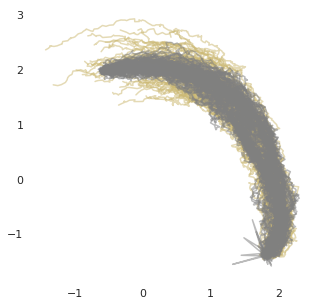

Currently at brindge: 1
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


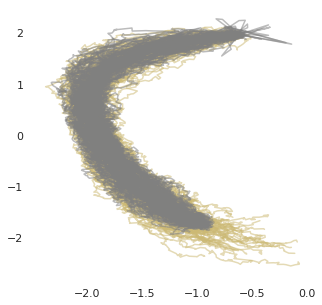

Currently at brindge: 2
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


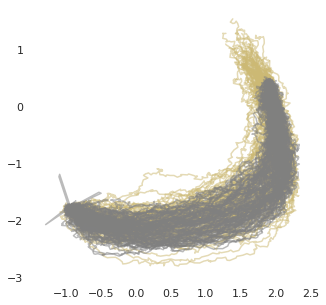

Currently at brindge: 3
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


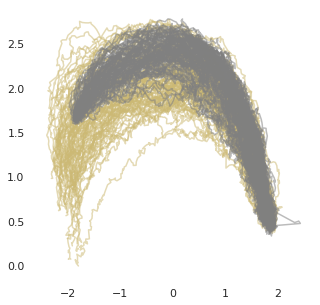

Currently at brindge: 4
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


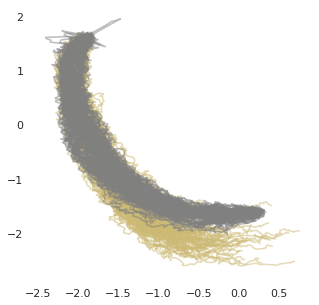

Currently at brindge: 5
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


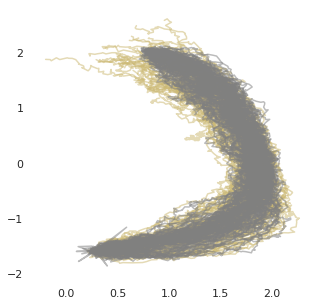

Currently at brindge: 6
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


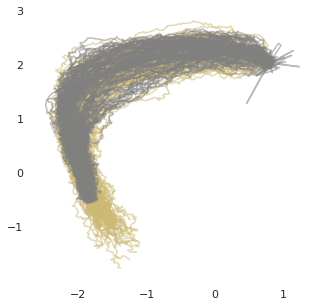

Currently at brindge: 7
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 10 invalid bridge trajectories 
The bridge is valid: True


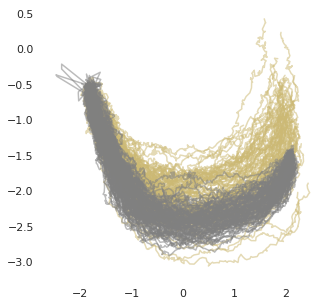

Currently at brindge: 8
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


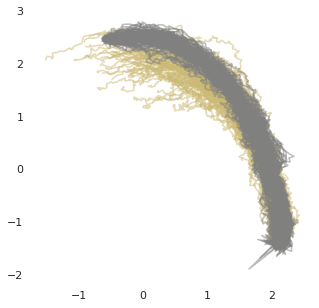

Currently at brindge: 9
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


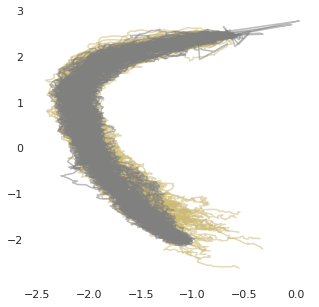

Currently at brindge: 10
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


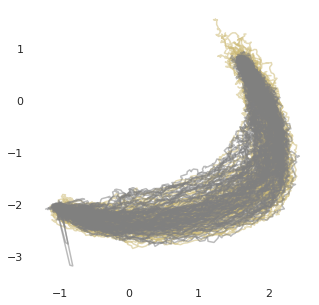

Currently at brindge: 11
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


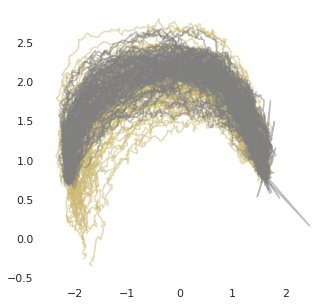

Currently at brindge: 12
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


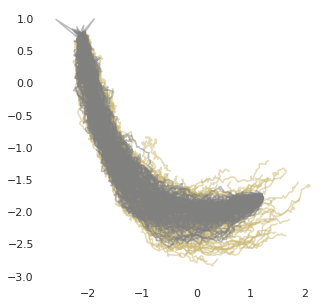

Currently at brindge: 13
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


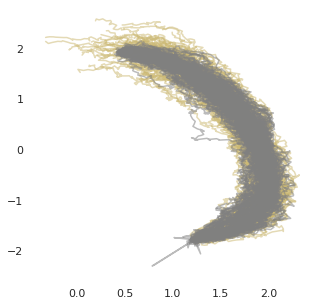

Currently at brindge: 14
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


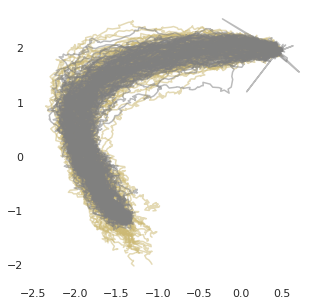

Currently at brindge: 15
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


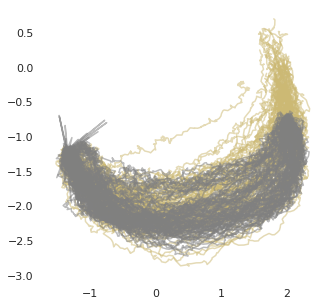

Currently at brindge: 16
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


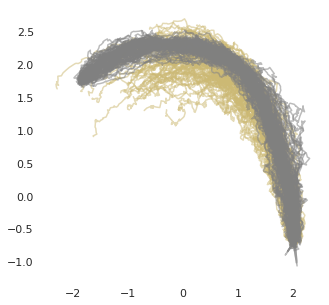

Currently at brindge: 17
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


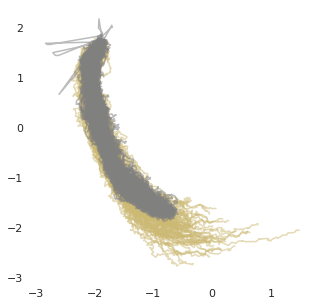

Currently at brindge: 18
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


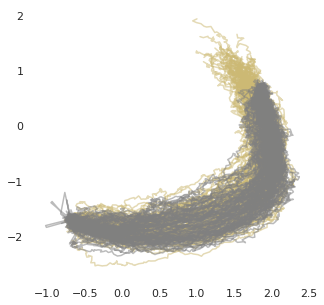

Currently at brindge: 19
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


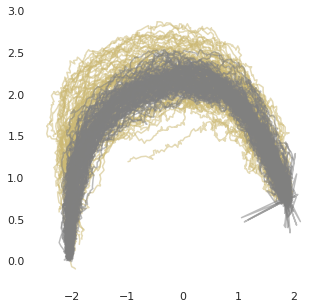

Currently at brindge: 20
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 8 invalid bridge trajectories 
The bridge is valid: True


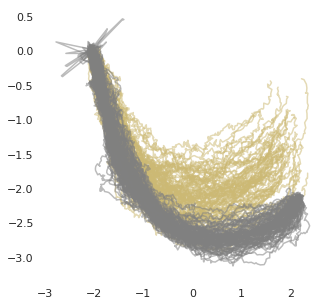

Currently at brindge: 21
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


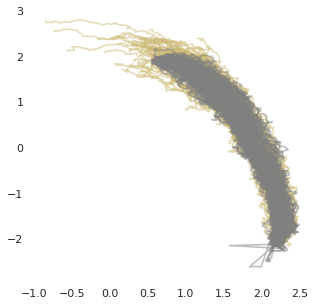

Currently at brindge: 22
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


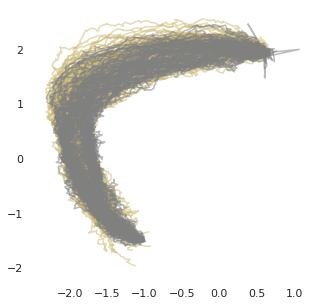

Currently at brindge: 23
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


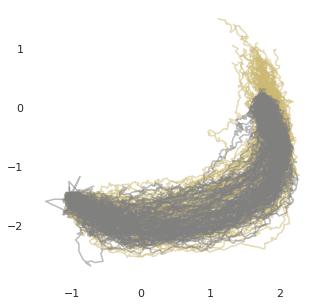

Currently at brindge: 24
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


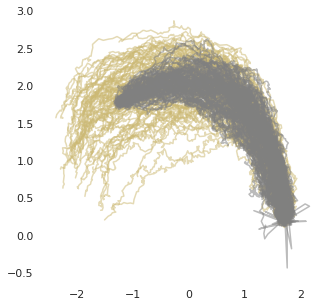

Currently at brindge: 25
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


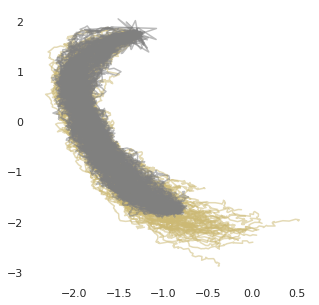

Currently at brindge: 26
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


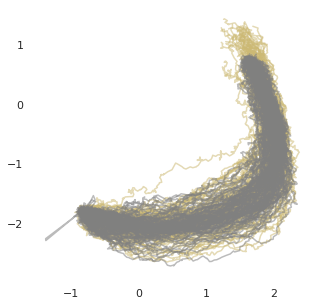

Currently at brindge: 27
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


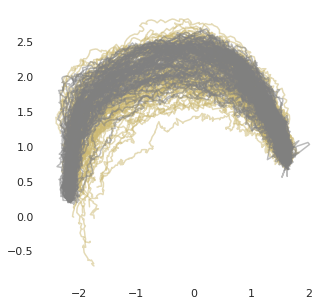

Currently at brindge: 28
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


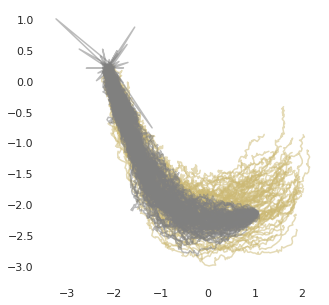

Currently at brindge: 29
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


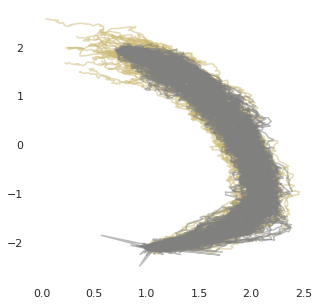

Currently at brindge: 30
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 29 invalid bridge trajectories 
The bridge is valid: True


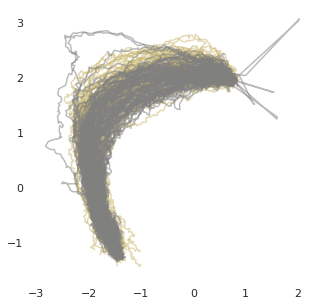

Currently at brindge: 31
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


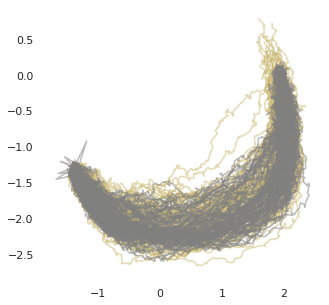

Currently at brindge: 32
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


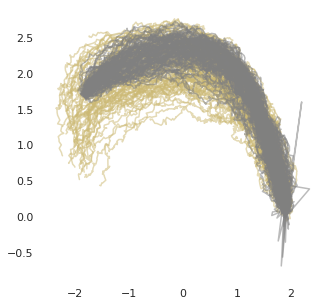

Currently at brindge: 33
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


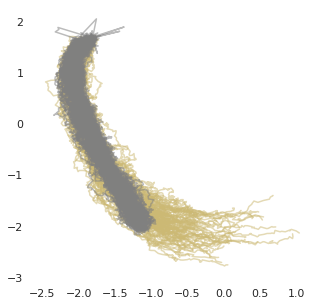

Currently at brindge: 34
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


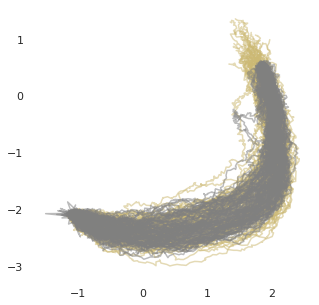

Currently at brindge: 35
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


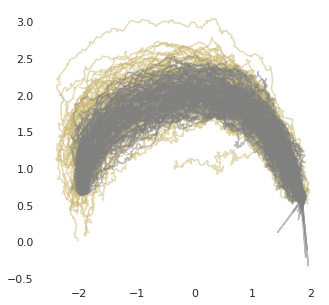

Currently at brindge: 36
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


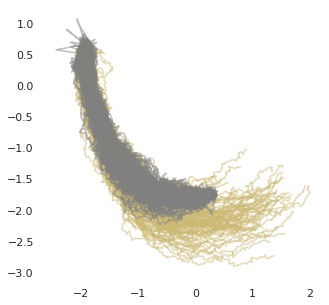

Currently at brindge: 37
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


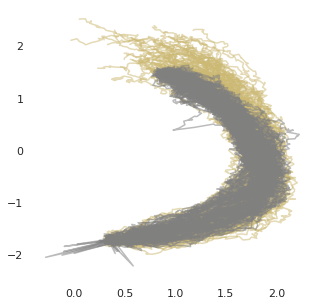

Currently at brindge: 38
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


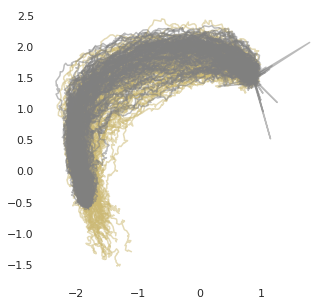

Currently at brindge: 39
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


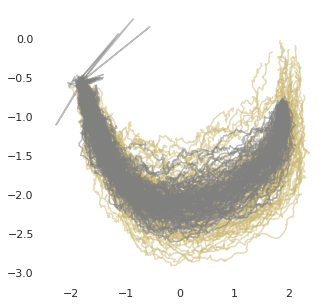

Currently at brindge: 40
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


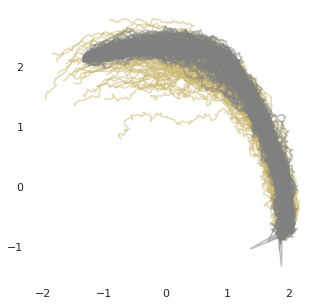

Currently at brindge: 41
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


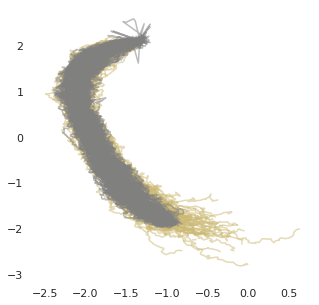

Currently at brindge: 42
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


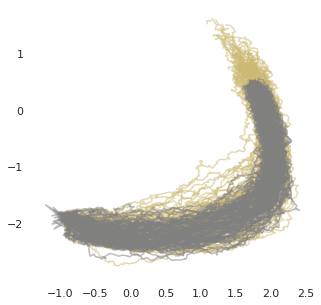

Currently at brindge: 43
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


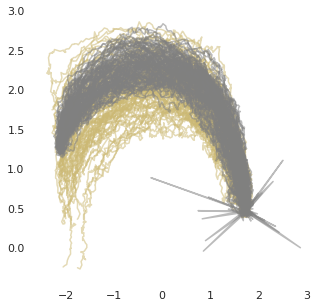

Currently at brindge: 44
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


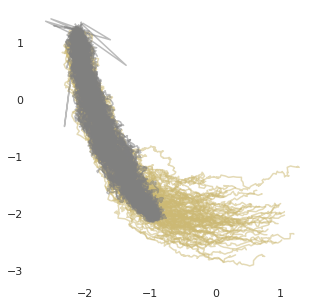

Currently at brindge: 45
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


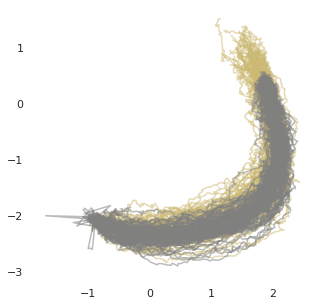

Currently at brindge: 46
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


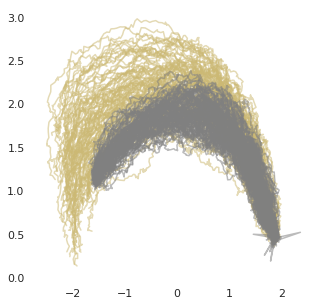

Currently at brindge: 47
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


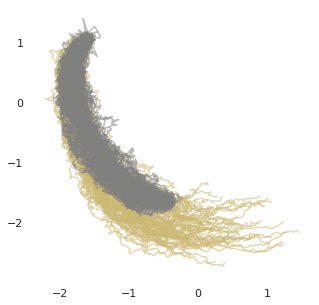

Currently at brindge: 48
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 17 invalid bridge trajectories 
The bridge is valid: True


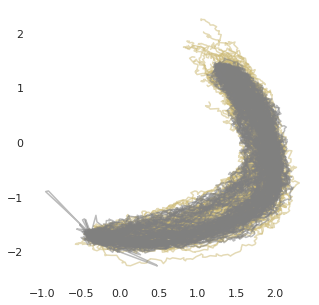

Currently at brindge: 49
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


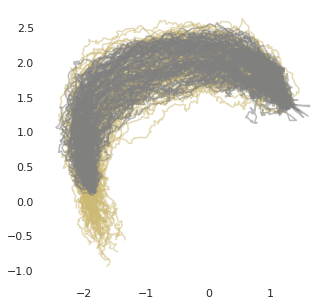

Currently at brindge: 50
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


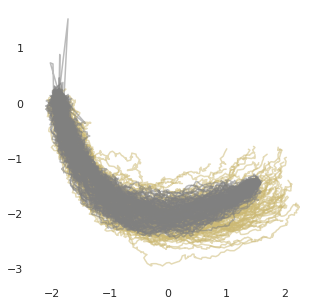

Currently at brindge: 51
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


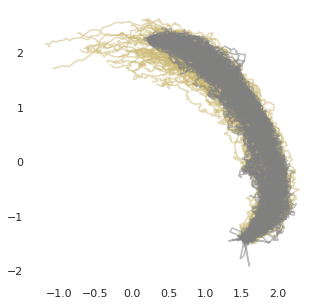

Currently at brindge: 52
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


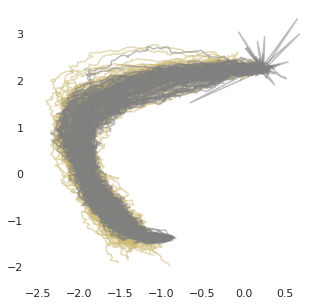

Currently at brindge: 53
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


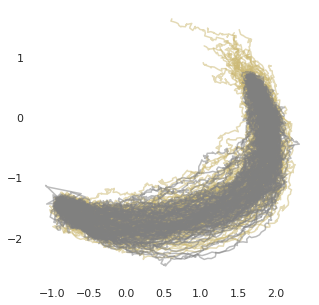

Currently at brindge: 54
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


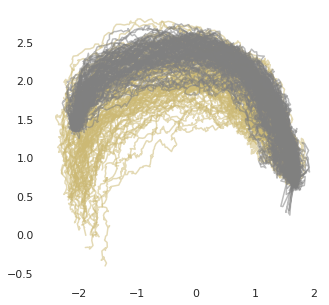

Currently at brindge: 55
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 8 invalid bridge trajectories 
The bridge is valid: True


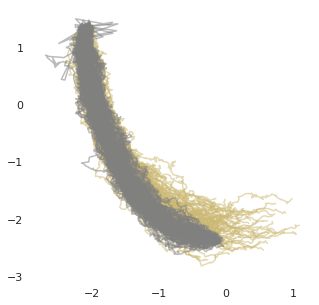

Currently at brindge: 56
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


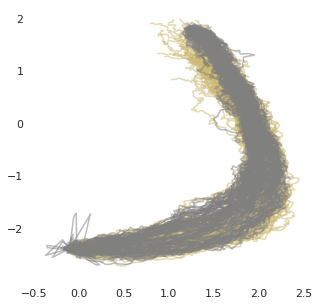

Currently at brindge: 57
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 24 invalid bridge trajectories 
The bridge is valid: True


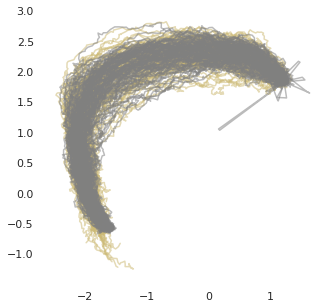

Currently at brindge: 58
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


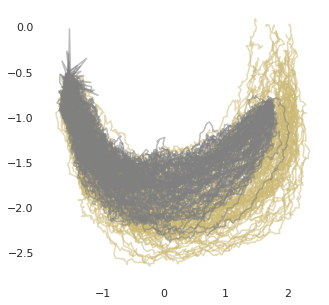

Currently at brindge: 59
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


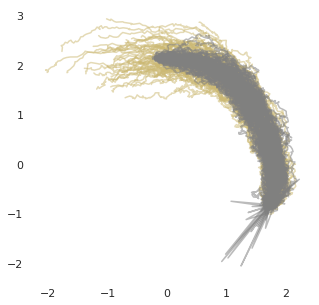

Currently at brindge: 60
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


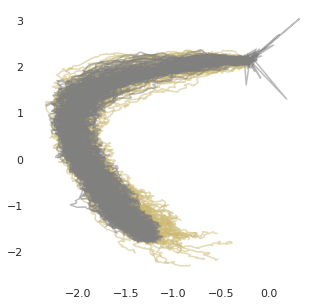

Currently at brindge: 61
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


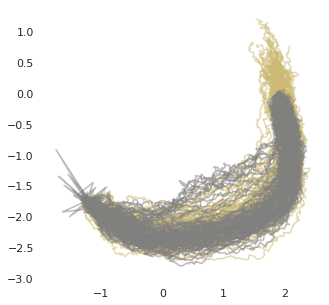

Currently at brindge: 62
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


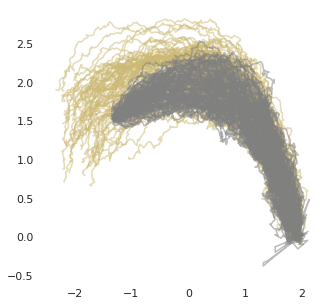

Currently at brindge: 63
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


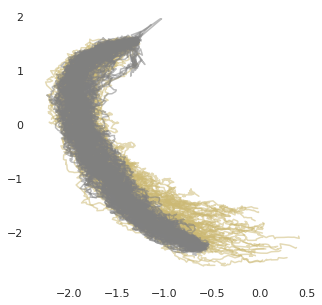

Currently at brindge: 64
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


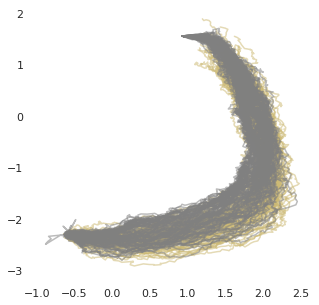

Currently at brindge: 65
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 8 invalid bridge trajectories 
The bridge is valid: True


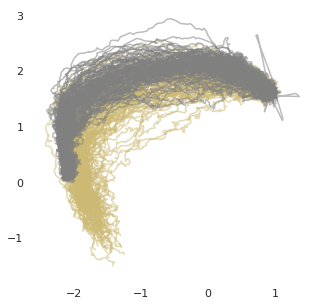

Currently at brindge: 66
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


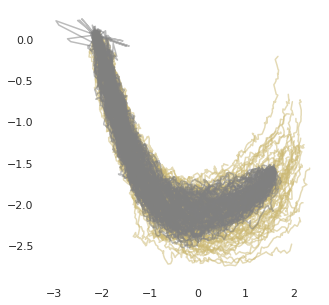

Currently at brindge: 67
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


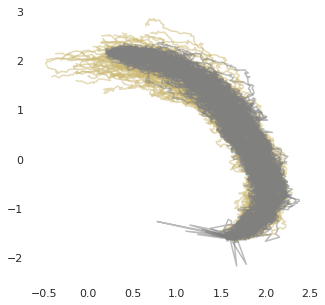

Currently at brindge: 68
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


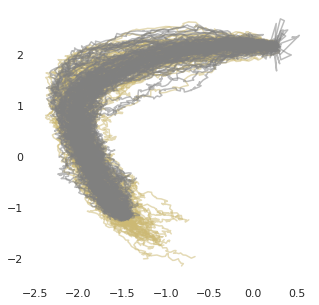

Currently at brindge: 69
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


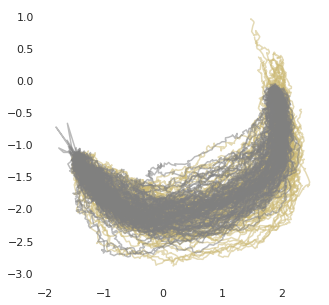

Currently at brindge: 70
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


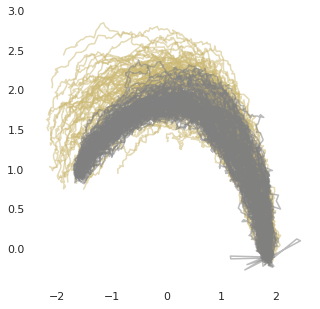

Currently at brindge: 71
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


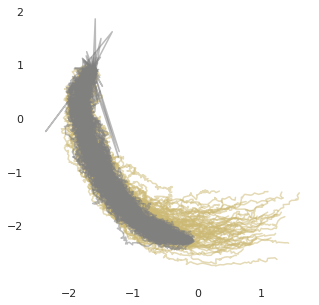

Currently at brindge: 72
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


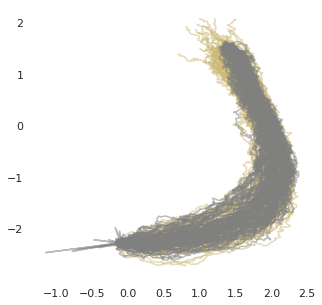

Currently at brindge: 73
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


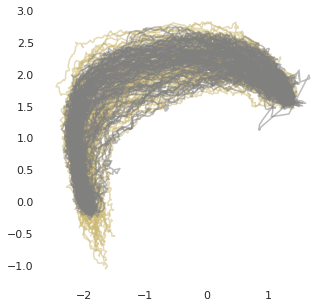

Currently at brindge: 74
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


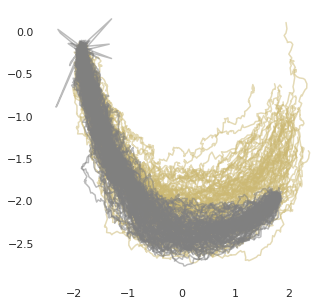

Currently at brindge: 75
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


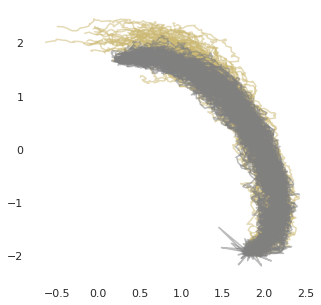

Currently at brindge: 76
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


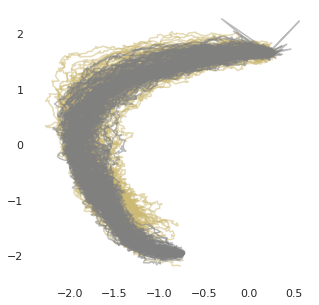

Currently at brindge: 77
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


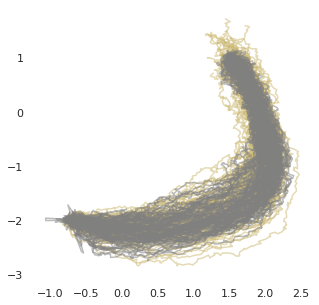

Currently at brindge: 78
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


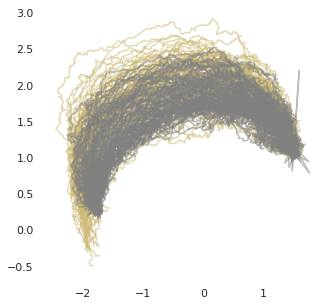

Currently at brindge: 79
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


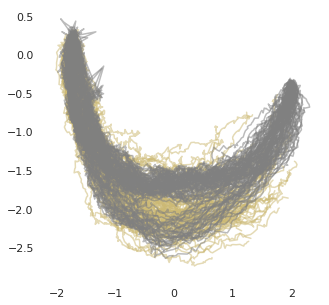

Currently at brindge: 80
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


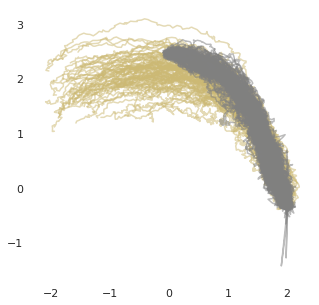

Currently at brindge: 81
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


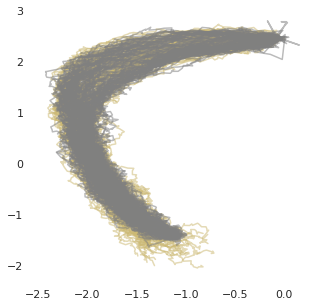

Currently at brindge: 82
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


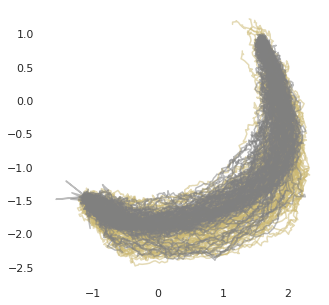

Currently at brindge: 83
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


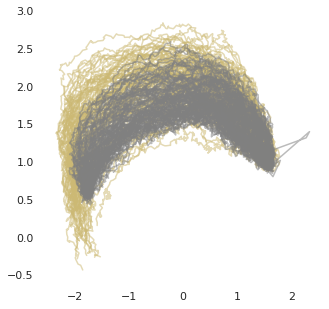

Currently at brindge: 84
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


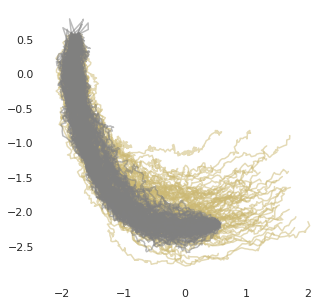

Currently at brindge: 85
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 8 invalid bridge trajectories 
The bridge is valid: True


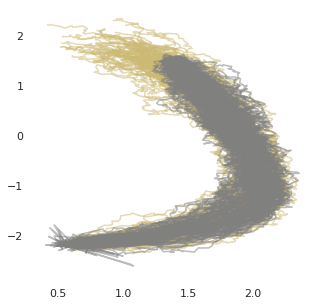

Currently at brindge: 86
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


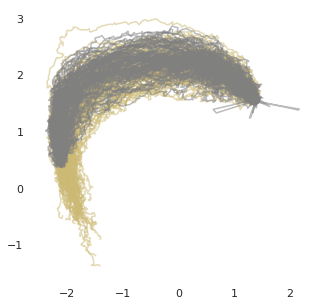

Currently at brindge: 87
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


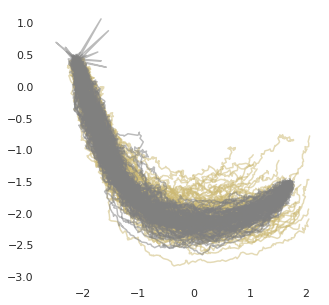

Currently at brindge: 88
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


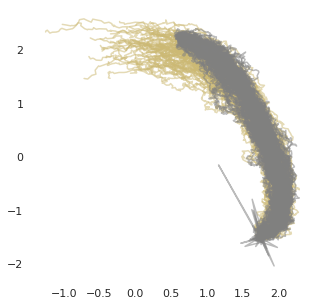

Currently at brindge: 89
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


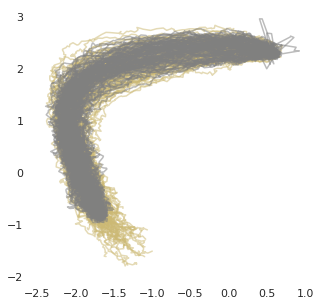

Currently at brindge: 90
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


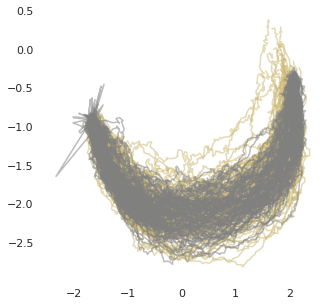

Currently at brindge: 91
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


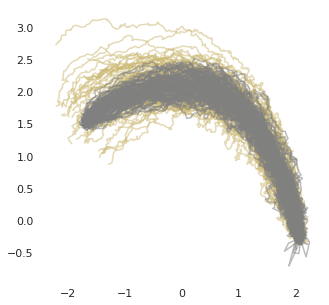

Currently at brindge: 92
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


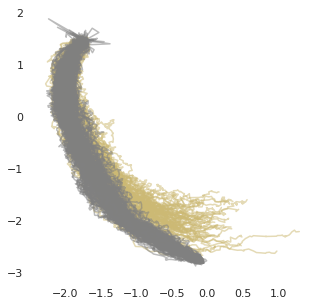

Currently at brindge: 93
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


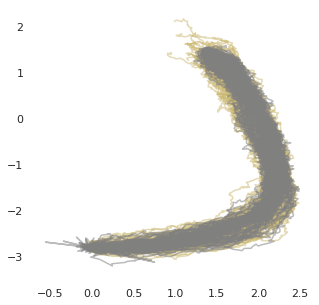

Currently at brindge: 94
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


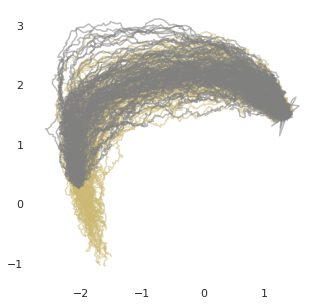

Currently at brindge: 95
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


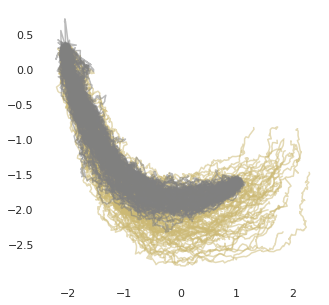

Currently at brindge: 96
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


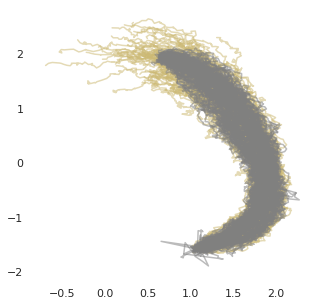

Currently at brindge: 97
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


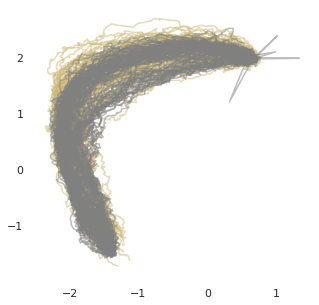

Currently at brindge: 98
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


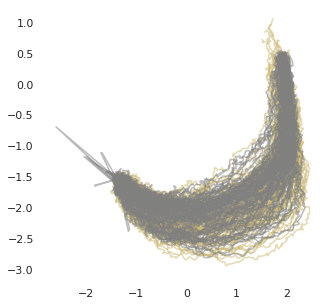

Currently at brindge: 99
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


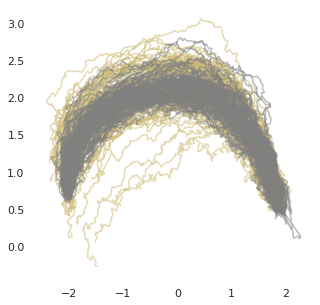

Currently at brindge: 100
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


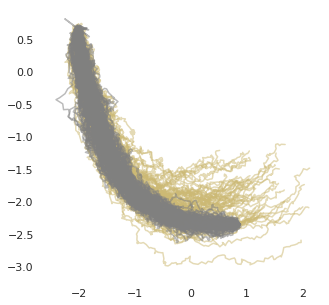

Currently at brindge: 101
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


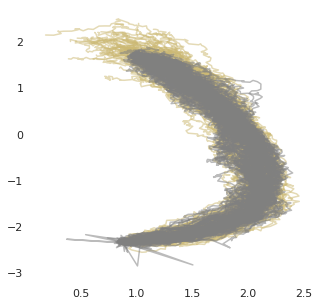

Currently at brindge: 102
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


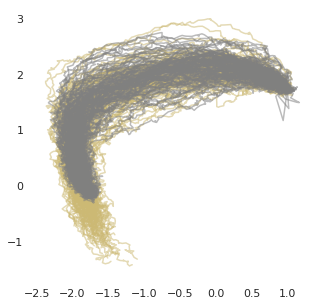

Currently at brindge: 103
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


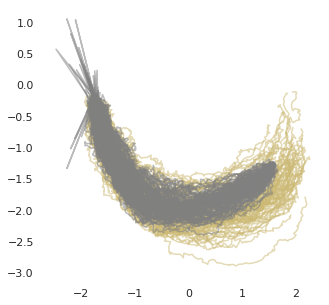

Currently at brindge: 104
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


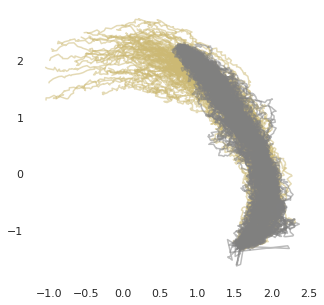

Currently at brindge: 105
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


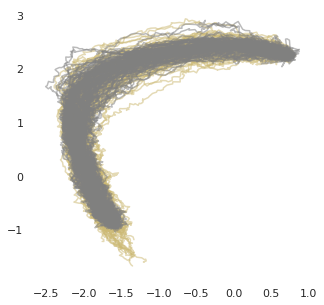

Currently at brindge: 106
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


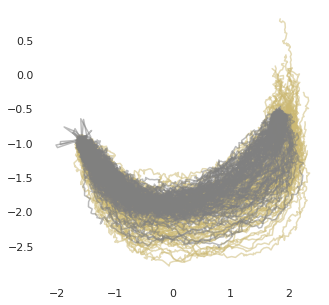

Currently at brindge: 107
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


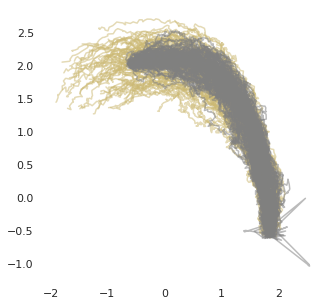

Currently at brindge: 108
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


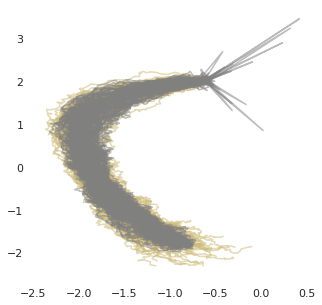

Currently at brindge: 109
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


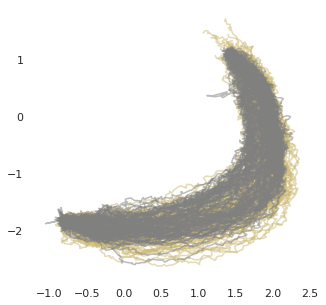

Currently at brindge: 110
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


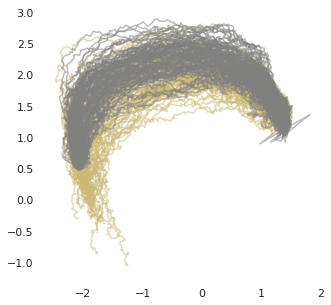

Currently at brindge: 111
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


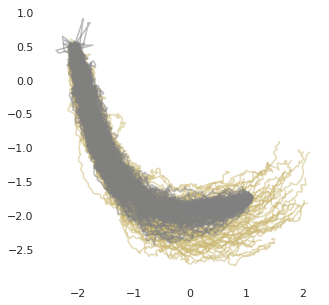

Currently at brindge: 112
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


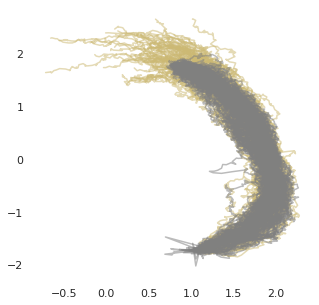

Currently at brindge: 113
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 20 invalid bridge trajectories 
The bridge is valid: True


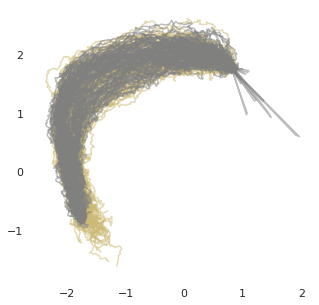

Currently at brindge: 114
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


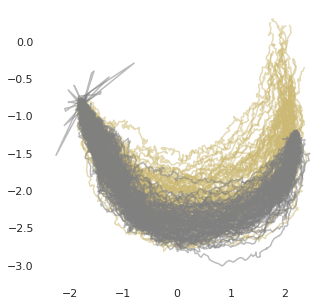

Currently at brindge: 115
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


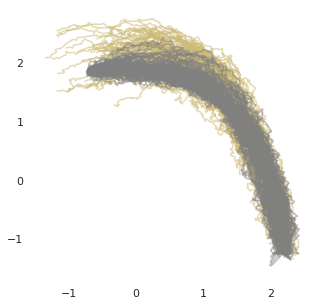

Currently at brindge: 116
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


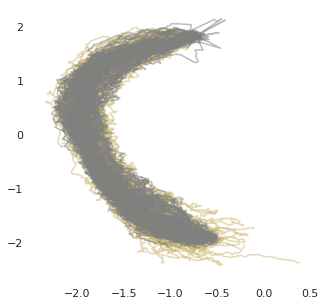

Currently at brindge: 117
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


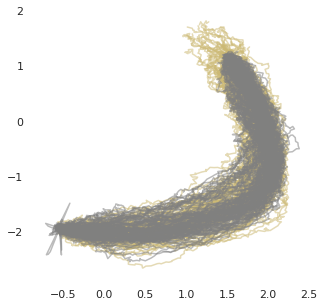

Currently at brindge: 118
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


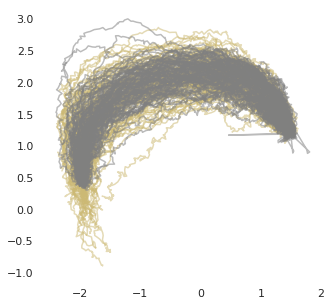

Currently at brindge: 119
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


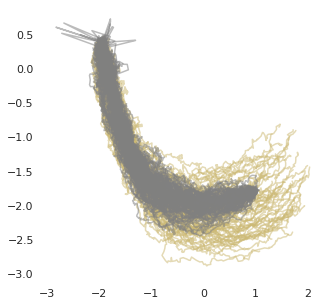

Currently at brindge: 120
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


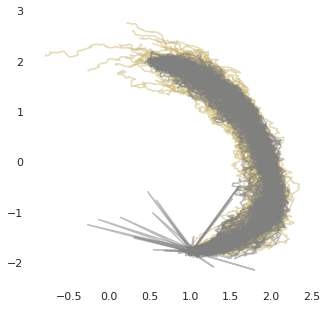

Currently at brindge: 121
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in power


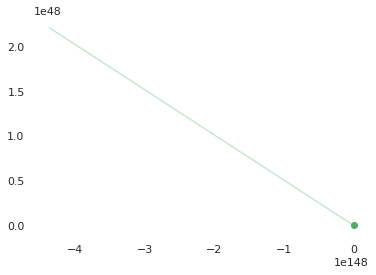

skipping bridge 121
Currently at brindge: 122
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


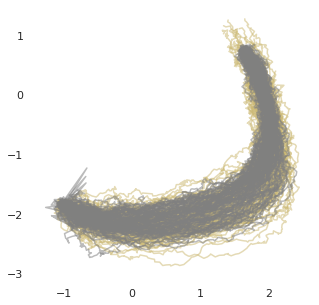

Currently at brindge: 123
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


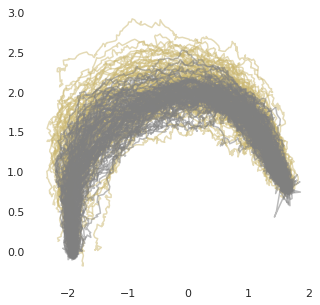

Currently at brindge: 124
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


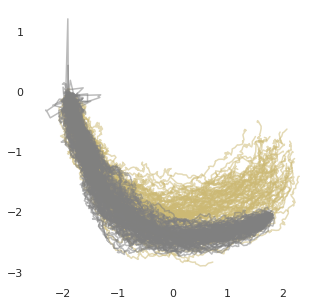

Currently at brindge: 125
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


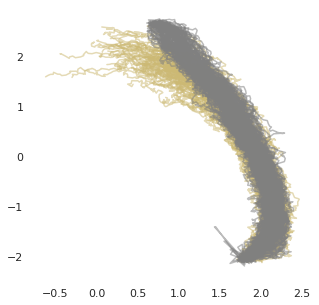

Currently at brindge: 126
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


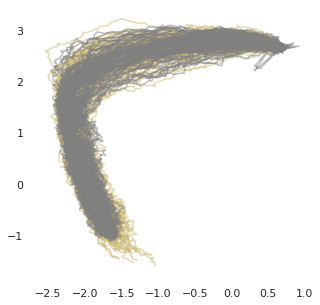

Currently at brindge: 127
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


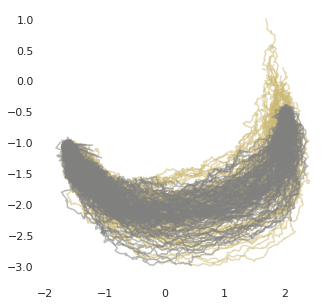

Currently at brindge: 128
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


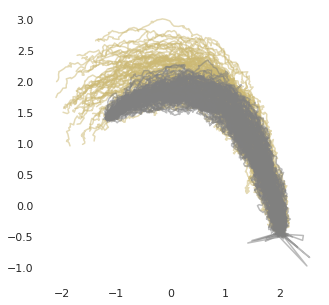

Currently at brindge: 129
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


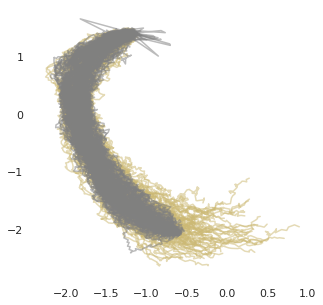

Currently at brindge: 130
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


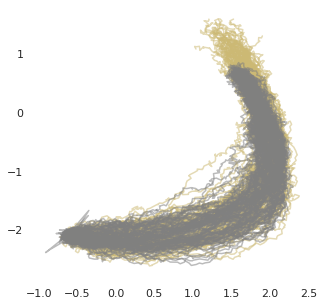

Currently at brindge: 131
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


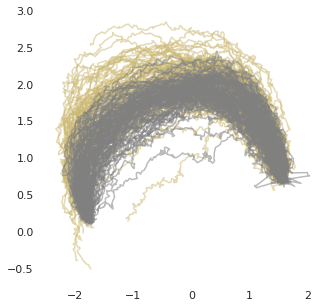

Currently at brindge: 132
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


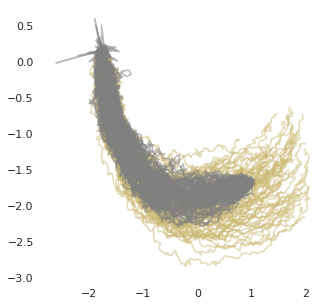

Currently at brindge: 133
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


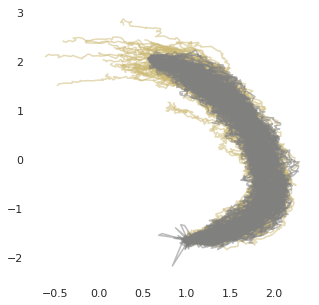

Currently at brindge: 134
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 12 invalid bridge trajectories 
The bridge is valid: True


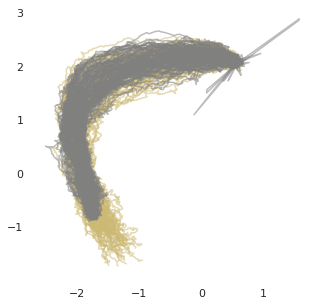

Currently at brindge: 135
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


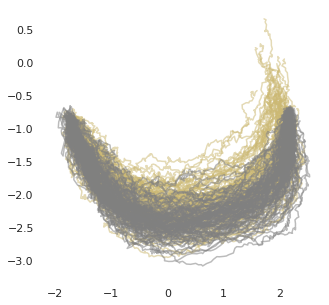

Currently at brindge: 136
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


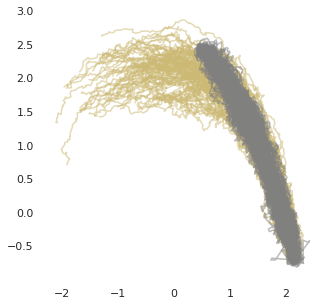

Currently at brindge: 137
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


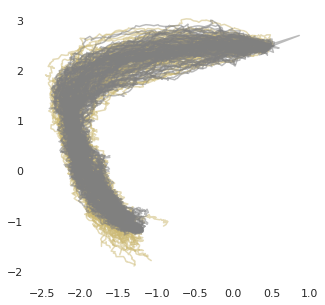

Currently at brindge: 138
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


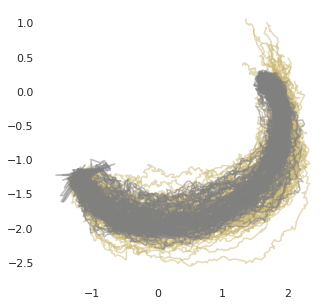

Currently at brindge: 139
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


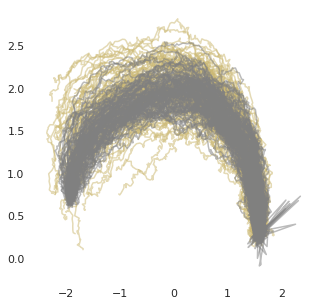

Currently at brindge: 140
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


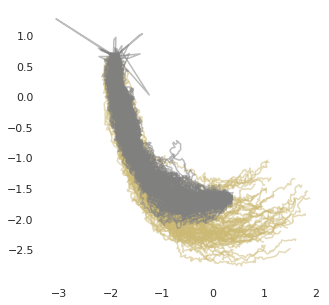

Currently at brindge: 141
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


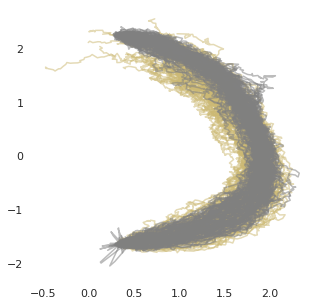

Currently at brindge: 142
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


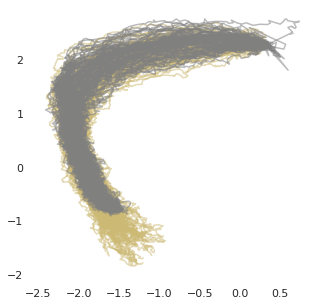

Currently at brindge: 143
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


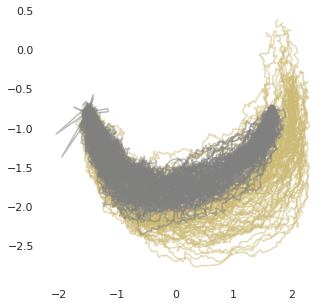

Currently at brindge: 144
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


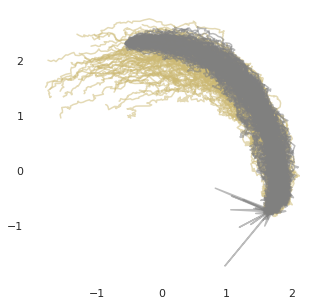

Currently at brindge: 145
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


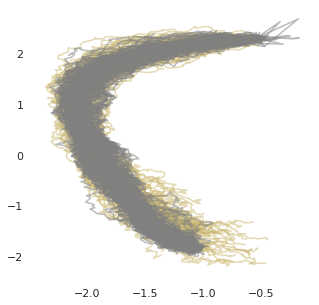

Currently at brindge: 146
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


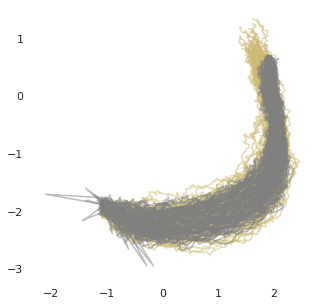

Currently at brindge: 147
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


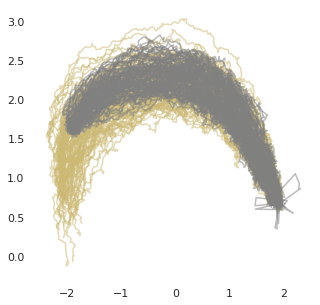

Currently at brindge: 148
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


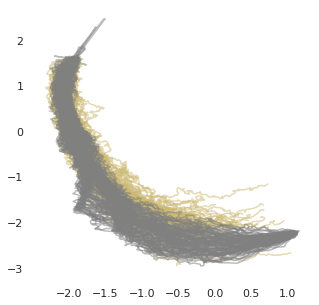

Currently at brindge: 149
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


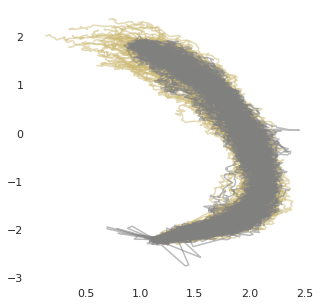

Currently at brindge: 150
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


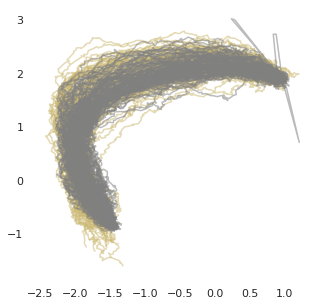

Currently at brindge: 151
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


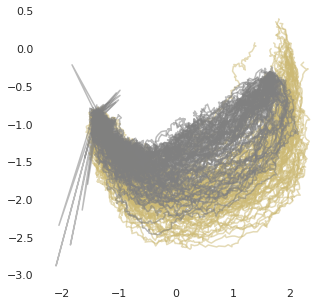

Currently at brindge: 152
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


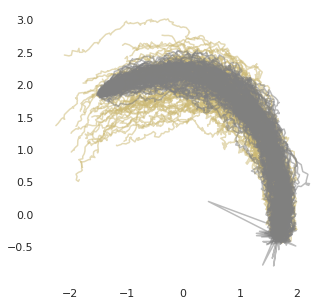

Currently at brindge: 153
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 8 invalid bridge trajectories 
The bridge is valid: True


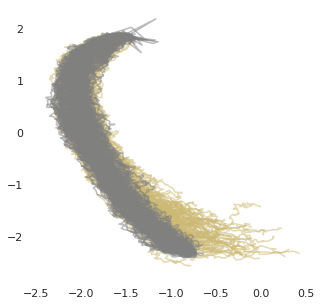

Currently at brindge: 154
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


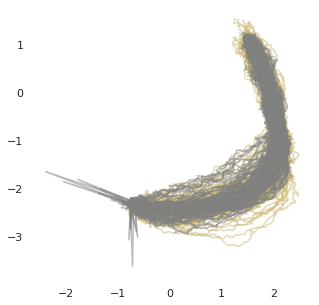

Currently at brindge: 155
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


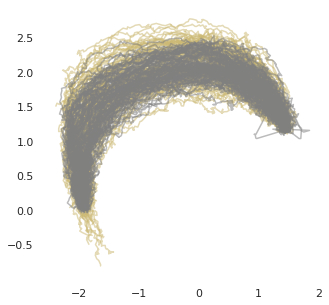

Currently at brindge: 156
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


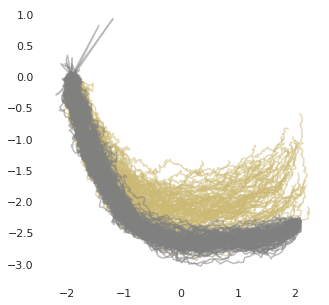

Currently at brindge: 157
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 12 invalid bridge trajectories 
The bridge is valid: True


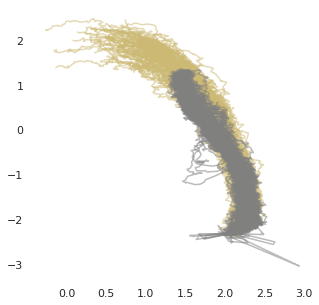

Currently at brindge: 158
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


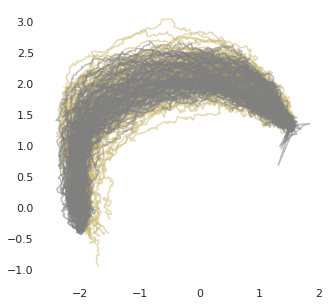

Currently at brindge: 159
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


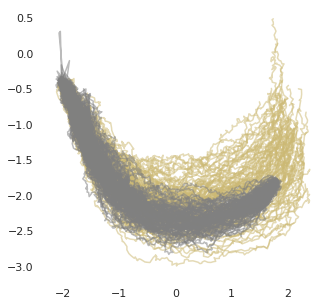

Currently at brindge: 160
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


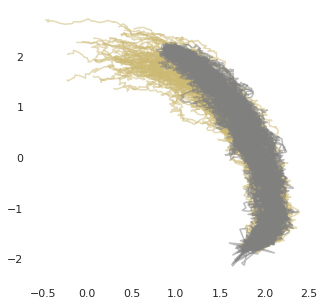

Currently at brindge: 161
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


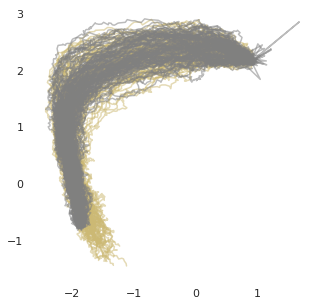

Currently at brindge: 162
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


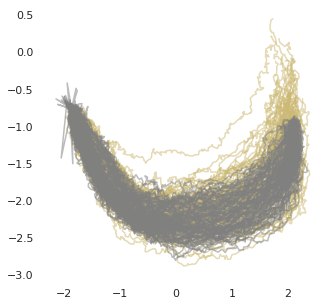

Currently at brindge: 163
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


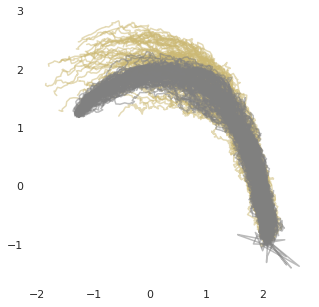

Currently at brindge: 164
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 10 invalid bridge trajectories 
The bridge is valid: True


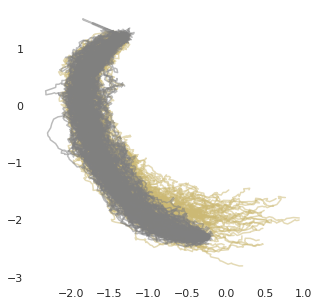

Currently at brindge: 165
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


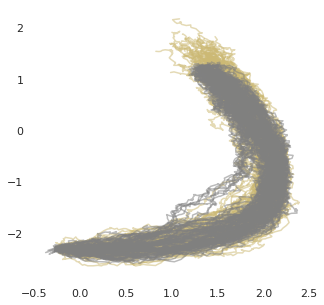

Currently at brindge: 166
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


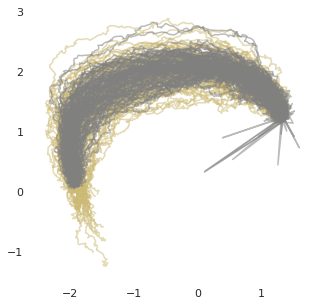

Currently at brindge: 167
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


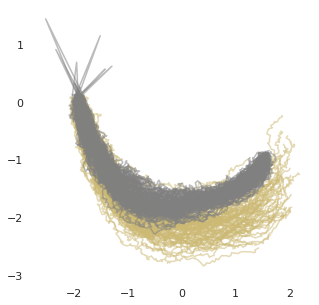

Currently at brindge: 168
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


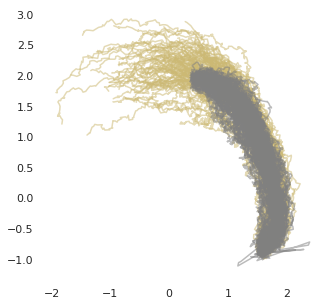

Currently at brindge: 169
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 1 invalid bridge trajectories 
The bridge is valid: True


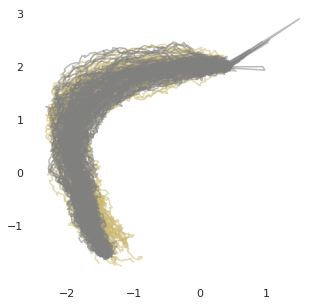

Currently at brindge: 170
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


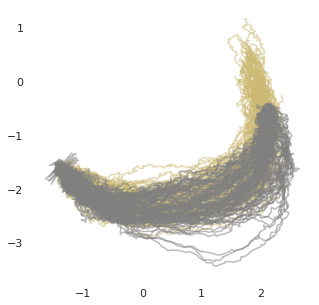

Currently at brindge: 171
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


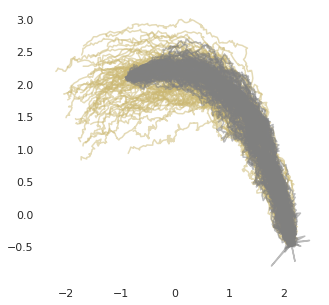

Currently at brindge: 172
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


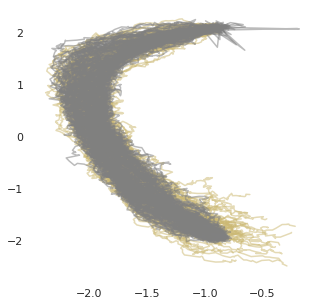

Currently at brindge: 173
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


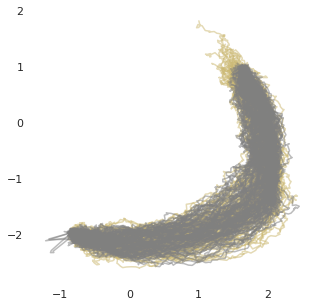

Currently at brindge: 174
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


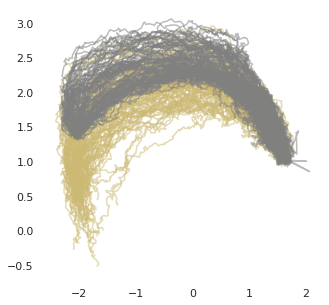

Currently at brindge: 175
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 7 invalid bridge trajectories 
The bridge is valid: True


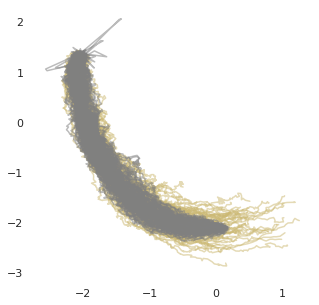

Currently at brindge: 176
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


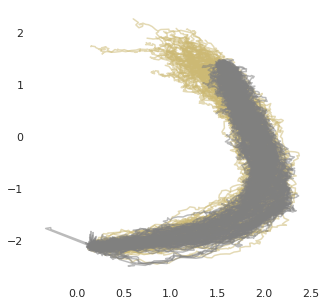

Currently at brindge: 177
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


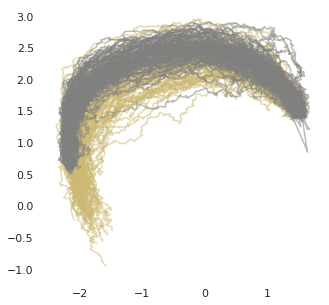

Currently at brindge: 178
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


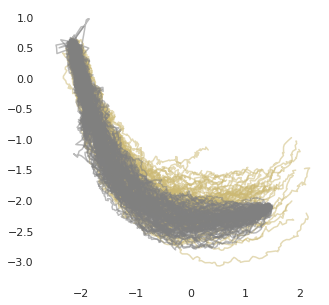

Currently at brindge: 179
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


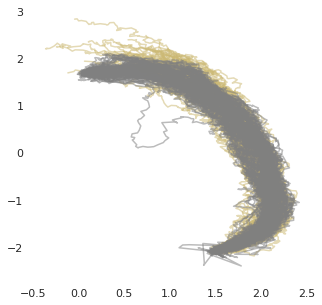

Currently at brindge: 180
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


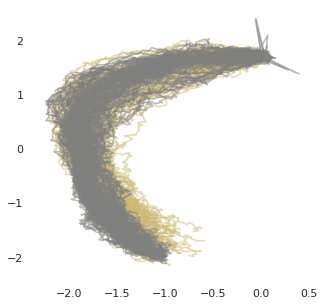

Currently at brindge: 181
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


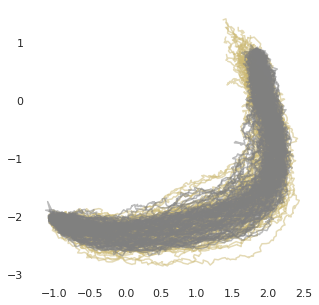

Currently at brindge: 182
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


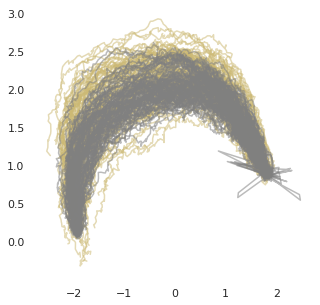

Currently at brindge: 183
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


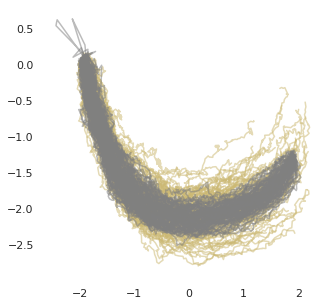

Currently at brindge: 184
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


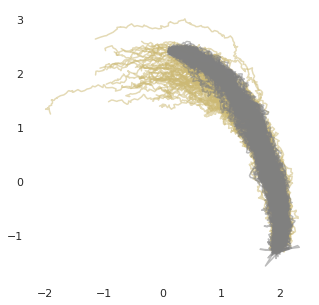

Currently at brindge: 185
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


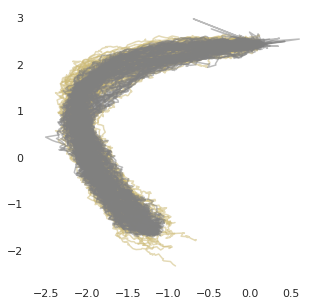

Currently at brindge: 186
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 2 invalid bridge trajectories 
The bridge is valid: True


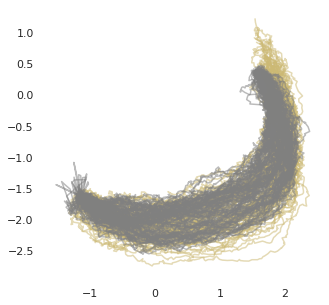

Currently at brindge: 187
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 10 invalid bridge trajectories 
The bridge is valid: True


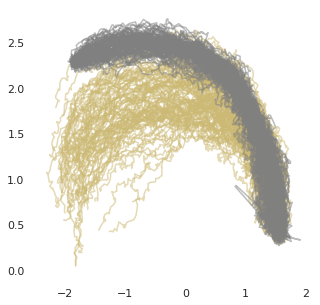

Currently at brindge: 188
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


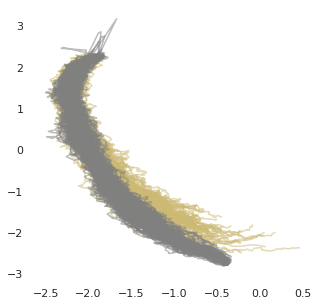

Currently at brindge: 189
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 21 invalid bridge trajectories 
The bridge is valid: True


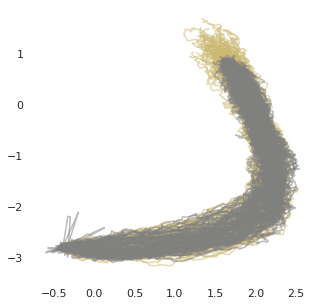

Currently at brindge: 190
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


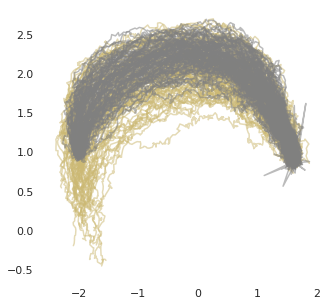

Currently at brindge: 191
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


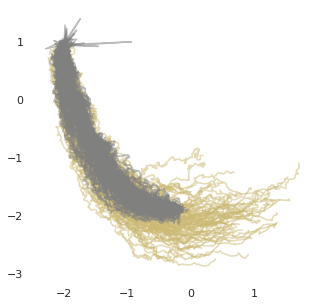

Currently at brindge: 192
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


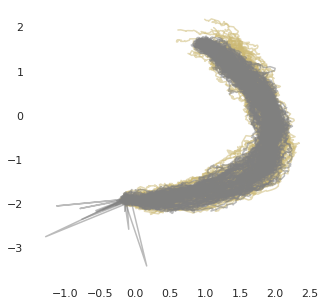

Currently at brindge: 193
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


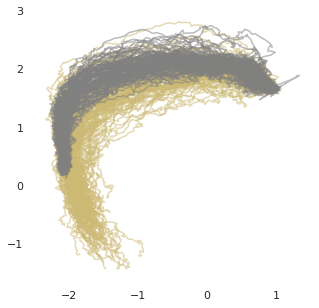

Currently at brindge: 194
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


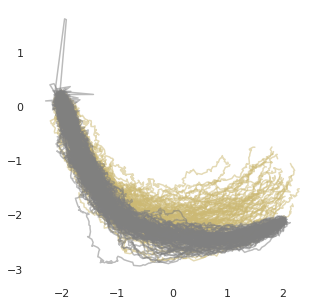

Currently at brindge: 195
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 5 invalid bridge trajectories 
The bridge is valid: True


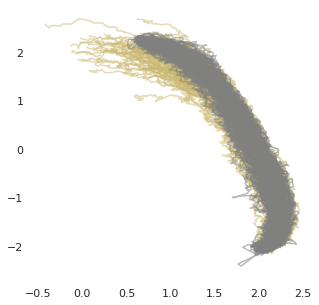

Currently at brindge: 196
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 6 invalid bridge trajectories 
The bridge is valid: True


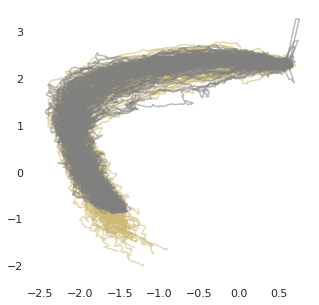

Currently at brindge: 197
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 4 invalid bridge trajectories 
The bridge is valid: True


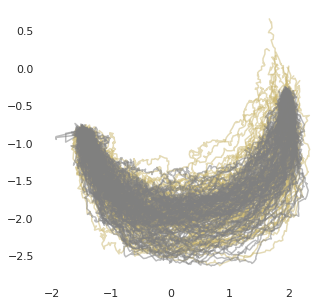

Currently at brindge: 198
Sampling forward with deterministic particles...
Forward sampling with Otto is ready!
Sampling backward with deterministic particles...
Identified 3 invalid bridge trajectories 
The bridge is valid: True


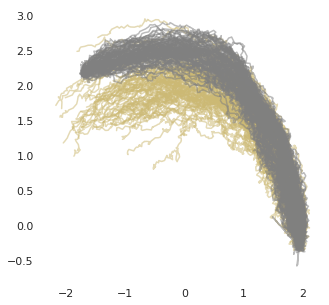

In [ ]:
def new_f(xo, t=0):
    ### to be calle dwith np.atleast_2d(xo).T if 1d, when xo is (dim,1)
    #dim, lo = xo.shape
    #if lo==1:
        #return mf.predict_f_samples(xo.T, lo).numpy().T.squeeze()
    #else:
    return mf.predict_f_samples(xo.T).numpy().T

import time
ksteps = obs_dens
N = 100
dim = 2
reps = 10
M = 40
dt = h


def fest(x,t=0,mu=1.05):#Van der Pol oscillator
    x0 = mu*(x[0] - (1/3)*x[0]**3-x[1])
    x1 = (1/mu)*x[0]
    return np.array([x0,x1])
festx = lambda x: fest(x, 0,1.05)
#gradfest = egrad(fest)


gbALL = np.zeros((dim, N, timegrid.size))
BALL = np.zeros((dim, N, timegrid.size))
for tindx, tim in enumerate(timegrid_obs[0:-1]): ##loop over the observation coarse timegrid
  if tindx>=0:
      print('Currently at brindge:',tindx)
      t1 = timegrid_obs[tindx]
      t2 = timegrid_obs[tindx+1]
      y1 = Ob[:,tindx]
      y2 = Ob[:,tindx+1]
      tindx_outer1 = tindx*ksteps
      tindx_outer2 = (tindx+1)*ksteps

      double_bridge = False
      brown_bridge = False


      #### Initial try #################################################################
      try:
          bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, fest, g, N, M, dens_est='nonparametric',
                                      reject=False, plotting=True)
      except OverflowError:
          print('skipping bridge %d'%tindx)
      else:
          print('The bridge is valid:', bridg2d.valid)
          if tindx%1==0:
              plt.figure(figsize=(5,5)),
              #plt.plot(Ob[0],Ob[1],'.')
              plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
              plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')

              plt.show()
          #
          #######compute I_1 and I_2###############################################################

          BALL[:,:,tindx_outer1:tindx_outer2] = bridg2d.B[:,:,:-1]
          gbALL[:,:,tindx_outer1:tindx_outer2] = bridg2d.gbB[:,:,:-1]




In [ ]:
import copy
to_keep = np.where(BALL[0,0,:]!=0)[0]
#print(to_keep)
BALL2 = torch.from_numpy(copy.deepcopy(BALL[:,:,to_keep]))
gbALL2 = torch.from_numpy(copy.deepcopy(gbALL[:,:,to_keep]))

In [ ]:
#@title lengthscale optimisation maximisenegative log likelihood

import torch
from torch import autograd
from torch.autograd import grad
import torch.functional
from scipy.optimize import minimize
from torch.autograd import Variable
from functools import partial
torch.autograd.set_detect_anomaly(True)
######################## for montecarlo evalutation of the gp integrals
seed= 10
np.random.seed(seed)
##inducing points #subset of observations
n_sparsegp = 200
#dim x nsparse
Sp = torch.from_numpy(np.random.uniform(low=[np.min(Ob[0]),np.min(Ob[1])], high=[np.max(Ob[0]),np.max(Ob[1])], size=(n_sparsegp,dim) ).T)
##Monte carlo sample of I_1 = \int k_s(x) A(x) k_s(x)^T dx

ks2 = lambda x: K( Sp.T, x, l=lnth)
##I1 is ks A(x)Ks.T integral
I1 = torch.zeros(n_sparsegp, n_sparsegp, dim) ###at the end multiply time dt/N
#I1b = torch.zeros((n_sparsegp, n_sparsegp, dim))
##I2 is ks g(x,t)
I2 = torch.zeros(n_sparsegp, dim)

##########################
#I1b[:,:,di] += ks2(np.atleast_2d(Xtemp).T) @ ks2(np.atleast_2d(Xtemp).T).T
          #if (ti>0) and (ti<bridg2d.timegrid.size-3):
sample_num = 50
lnths = torch.ones(dim)#, requires_grad=True)
lns = Variable(lnths, requires_grad=True)
def loglike(lnth):
    print(lnth)
    Ls = torch.zeros((n_sparsegp, n_sparsegp, dim)) #Lambda_s
    ds = torch.zeros((n_sparsegp, dim))
    #start = time.time()
    Kss = [ K(torch.atleast_2d(Sp[di]).T, torch.atleast_2d(Sp[di]).T, l=lnth[di].clone(), multil=False) for di in range(dim) ]
    Kss_inv = [ torch.linalg.inv( Kss[di] + torch.eye(n_sparsegp)*1e-3 ) for di in range(dim)]
    ks = [ lambda x, di=di: K(torch.atleast_2d(Sp[di]).T, x, l=lnth[di].clone(), multil=False)  for di in range(dim) ]
    for di in range(dim):
      for ti in range(500):#BALL2.shape[-1]):
          Xtemp = BALL2[:,:sample_num,ti] #dim x N
          gbB = gbALL2[:,:sample_num,ti]

          I1[:,:,di] = I1[:,:,di] + ks[di](torch.atleast_2d(Xtemp[di]).T) @ ks[di](torch.atleast_2d(Xtemp[di]).T).T

          I2[:, di] = I2[:, di]+ (ks[di](torch.atleast_2d(Xtemp[di,:]).T) @ torch.atleast_2d( gbALL2[di,:sample_num,ti]).T )[:,0]
    #stop = time.time()

    for di in range(dim):
        I1[:, :, di] = I1[:, :, di] *dt/sample_num
        I2[:, di]  = I2[:, di]* dt/sample_num

    for di in range(dim):
        Ls[:, :, di] = (1/torch.tensor(g**2))* Kss_inv[di] @ I1[:,:,di].double()@Kss_inv[di].T  #sparse x sparse
        ds[:, di] = (1/g**2)* Kss_inv[di]@ I2[:,di].double()
    ###TO DO: find a way to do this properly in one functoin

    f_est1 = lambda x: ks[0]( torch.atleast_2d(x[0,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,0].double()@Kss[0].double()   ).double() @ ds[:,0].double()
    f_est2 = lambda x: ks[1]( torch.atleast_2d(x[1,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,1].double()@Kss[1].double()   ).double() @ ds[:,1].double()
    #    return ([f_est1, f_est2])
    #f_est = [f_est1, f_est2]

    ## f= ks(x).T [ I+Ls Kss]^-1 ds


    fX = torch.zeros(dim)
    gradfX = torch.zeros(dim)
    fgb = torch.zeros((dim, dim))
    print('----------------------------------------')
    for ti in range(500):#BALL2.shape[-1]):
        #print( f_est(BALL2[:,:sample_num,ti]))
        fgb = fgb + (1/g**2)* f_est1(BALL2[:,:sample_num,ti]) @ gbALL2[0, :sample_num, ti].T + (1/g**2)* f_est2(BALL2[:,:sample_num,ti]) @ gbALL2[1, :sample_num, ti].T
        #print(f_est(BALL2[:,:sample_num,ti]).shape )
        fX = fX + f_est1(BALL2[:,:sample_num,ti]) @f_est1(BALL2[:,:sample_num,ti]).T  + f_est2(BALL2[:,:sample_num,ti]) @f_est2(BALL2[:,:sample_num,ti]).T
        gradfest1 = torch.autograd.functional.jacobian(f_est1, inputs=BALL2[:,:sample_num,ti].T , create_graph=True)
        gradfest2 = torch.autograd.functional.jacobian(f_est2, inputs=BALL2[:,:sample_num,ti].T , create_graph=True)

        gradfX = gradfX + gradfest1 +gradfest2
    ll = (dt/sample_num)*(0.5* torch.sum(fX) + torch.sum(gradfX) + torch.sum(fgb)).clone()
    print(ll)
    print('---------')
    print()
    return  ll
#opt = torch.optim.Adam([x], lr=.01, betas=(0.5, 0.999))
# derivates of neg_loglike
#jacobian_  = jacobian(neg_loglike)
#hessian_ = hessian(neg_loglike)
#res1 = minimize(neg_loglike, lnth_start, method = 'BFGS', options={'disp': True}, jac = jacobian_)
#print("Convergence Achieved: ", res1.success)
#print("Number of Function Evaluations: ", res1.nfev)
# estimated parameters
#params = [p_0, p_1...]
"""
opt = torch.optim.SGD([lnths], lr=0.05)

for e in range(100):
  loss = loglike(lnths)
  opt.zero_grad()
  loss.backward(retain_graph=True)
  opt.step()
"""
losses = np.zeros((15, 15))
for l1i,l1 in enumerate(np.arange(0.5, 2,0.1)):
    for l2i,l2 in enumerate(np.arange(0.5, 2,0.1)):
        lnths[0] = l1
        lnths[1] = l2
        print(lnths)
        losses[l1i,l2i] = loglike(lnths)
        print(losses[l1i,l2i])



In [ ]:
plt.imshow(losses)
plt.colorbar()

print(np.unravel_index(np.argmin(losses), losses.shape))

In [ ]:
l1 =1#np.arange(0.5, 2, 0.1)[14]
l2 =1# np.arange(0.5, 2, 0.1)[0]

In [ ]:
import torch
from torch import autograd
from torch.autograd import grad
import torch.functional

######################## for montecarlo evalutation of the gp integrals
seed= 10
np.random.seed(seed)
##inducing points #subset of observations
n_sparsegp = 300
#dim x nsparse
Sp = torch.from_numpy(np.random.uniform(low=[np.min(Ob[0]),np.min(Ob[1])], high=[np.max(Ob[0]),np.max(Ob[1])], size=(n_sparsegp,dim) ).T)
##Monte carlo sample of I_1 = \int k_s(x) A(x) k_s(x)^T dx

#ks2 = lambda x: K( Sp.T, x, l=lnth)
##I1 is ks A(x)Ks.T integral
I1 = torch.zeros(n_sparsegp, n_sparsegp, dim) ###at the end multiply time dt/N
#I1b = torch.zeros((n_sparsegp, n_sparsegp, dim))
##I2 is ks g(x,t)
I2 = torch.zeros(n_sparsegp, dim)

##########################
#I1b[:,:,di] += ks2(np.atleast_2d(Xtemp).T) @ ks2(np.atleast_2d(Xtemp).T).T
          #if (ti>0) and (ti<bridg2d.timegrid.size-3):
sample_num = N
lnth = torch.ones(dim)#, requires_grad=True)
lnth[0] = l1
lnth[1]  = l2
print(lnth)
Ls = torch.zeros((n_sparsegp, n_sparsegp, dim)) #Lambda_s
ds = torch.zeros((n_sparsegp, dim))
#start = time.time()
Kss = [ K(torch.atleast_2d(Sp[di]).T, torch.atleast_2d(Sp[di]).T, l=lnth[di].clone(), multil=False) for di in range(dim) ]
Kss_inv = [ torch.linalg.inv( Kss[di] + torch.eye(n_sparsegp)*1e-3 ) for di in range(dim)]
Kssall = torch.tensor(K(torch.atleast_2d(Sp).T, torch.atleast_2d(Sp).T, l=lnth.clone(), multil=True) )
Kssall_inv = torch.linalg.inv( Kssall + torch.eye(n_sparsegp)*1e-3 )

ks = [ lambda x, di=di: K(torch.atleast_2d(Sp[di]).T, x, l=lnth[di].clone(), multil=False)  for di in range(dim) ]
ksa = [ lambda x, di=di: torch.tensor(K(torch.atleast_2d(Sp).T, x, l=lnth.clone(), multil=True))  for di in range(dim) ] ##all dimensions are the same
for di in range(dim):
  for ti in range(BALL2.shape[-1]):
      Xtemp = BALL2[:,:sample_num,ti] #dim x N
      gbB = gbALL2[:,:sample_num,ti]
      ##component wise kernels
      #I1[:,:,di] = I1[:,:,di] + ks[di](torch.atleast_2d(Xtemp[di]).T) @ ks[di](torch.atleast_2d(Xtemp[di]).T).T
      #I2[:, di] = I2[:, di]+ (ks[di](torch.atleast_2d(Xtemp[di,:]).T) @ torch.atleast_2d( gbALL2[di,:sample_num,ti]).T )[:,0]
      ###signle kernel
      I1[:,:,di] = I1[:,:,di] + ksa[di](torch.atleast_2d(Xtemp[:]).T) @ ksa[di](torch.atleast_2d(Xtemp[:]).T).T   ##consider alldimensions all together
      I2[:, di] = I2[:, di]+ (ksa[di](torch.atleast_2d(Xtemp[:,:]).T) @ torch.atleast_2d( gbALL2[di,:sample_num,ti]).T )[:,0]
#stop = time.time()

for di in range(dim):
    I1[:, :, di] = I1[:, :, di]* dt /(sample_num) #(T/timegrid.size-to_keep.size)
    I2[:, di]  = I2[:, di]* dt/sample_num #(T/timegrid.size-to_keep.size)

for di in range(dim):
    ### component wise kernel
    #Ls[:, :, di] = (1/torch.tensor(g**2))* Kss_inv[di] @ I1[:,:,di].double()@Kss_inv[di].T  #sparse x sparse
    #ds[:, di] = (1/g**2)* Kss_inv[di]@ I2[:,di].double()

    ###when consider all dimensions together
    Ls[:, :, di] = (1/torch.tensor(g**2))* Kssall_inv @ I1[:,:,di].double()@Kssall_inv.T  #sparse x sparse
    ds[:, di] = (1/g**2)* Kssall_inv@ I2[:,di].double()
###TO DO: find a way to do this properly in one functoin
### component wise kernels
#f_est1 = lambda x: ks[0]( torch.atleast_2d(x[0,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,0].double()@Kss[0].double()   ).double() @ ds[:,0].double()
#f_est2 = lambda x: ks[1]( torch.atleast_2d(x[1,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,1].double()@Kss[1].double()   ).double() @ ds[:,1].double()
## single kernel
f_est1 = lambda x: -ksa[0]( torch.atleast_2d(x[:,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,0].double()@Kssall.double()   ).double() @ ds[:,0].double()
f_est2 = lambda x: -ksa[1]( torch.atleast_2d(x[:,:]).T ).T @ torch.linalg.inv(  torch.eye(n_sparsegp)+ Ls[:,:,1].double()@Kssall.double()   ).double() @ ds[:,1].double()
#    return ([f_est1, f_est2])
#f_est = [f_est1, f_est2]

## f= ks(x).T [ I+Ls Kss]^-1 ds

"""
fX = torch.zeros(dim)
gradfX = torch.zeros(dim)
fgb = torch.zeros((dim, dim))
print('----------------------------------------')
for ti in range(100):#BALL2.shape[-1]):
    #print( f_est(BALL2[:,:sample_num,ti]))
    fgb = fgb + (1/g**2)* f_est1(BALL2[:,:sample_num,ti]) @ gbALL2[0, :sample_num, ti].T + (1/g**2)* f_est2(BALL2[:,:sample_num,ti]) @ gbALL2[1, :sample_num, ti].T
    #print(f_est(BALL2[:,:sample_num,ti]).shape )
    fX = fX + f_est1(BALL2[:,:sample_num,ti]) @f_est1(BALL2[:,:sample_num,ti]).T  + f_est2(BALL2[:,:sample_num,ti]) @f_est2(BALL2[:,:sample_num,ti]).T
    gradfest1 = torch.autograd.functional.jacobian(f_est1, inputs=BALL2[:,:sample_num,ti].T , create_graph=True)
    gradfest2 = torch.autograd.functional.jacobian(f_est2, inputs=BALL2[:,:sample_num,ti].T , create_graph=True)

    gradfX = gradfX + gradfest1 +gradfest2
ll = (dt/sample_num)*(0.5* torch.sum(fX) + torch.sum(gradfX) + torch.sum(fgb)).clone()
print(ll)
"""
print('---------')
print()

#


In [ ]:
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
n=20
xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
##xt = (copy.deepcopy(xt0)).reshape(-1,2)

mu2 = np.zeros(xt.shape)

xt = torch.tensor(xt)
## this is supposed to speed up evaluations

for i in range(n):
  for j in range(n):
    #print(f_est(np.atleast_2d(xt[:,i,j]).T))
      #print( torch.atleast_2d(xt[:,i,j]).shape)
      mu2[:,i,j] = f_est1(torch.atleast_2d(xt[:,i,j]).T), f_est2(torch.atleast_2d(xt[:,i,j]).T)




colormap = cm.inferno
#



In [ ]:
plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='blue')
#q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='r', alpha=0.65)
plt.title('esimated initial force field')

plt.subplot(1,3,2)
#q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='blue')
q2 =plt.quiver(xt[0],xt[1], mu2[0],mu2[1], color='r', alpha=0.65)
plt.title('esimated initial force field')

In [ ]:

 #sparse

##for dimension di
## f= ks(x).T [ I+Ls Kss]^-1 ds
f_est = lambda x: np.array([ks[di]( np.atleast_2d(x[di,:]).T ).T@ np.linalg.inv(  np.eye(n_sparsegp) + Ls[:,:,di]@Kss[di] ) @ ds[:,di]  for di in range(dim) ])
## var = K(x,x) - ks(x).T [ I+Ls Kss]^-1 Ls ks(x)
#var_est = lambda x: [K( np.atleast_2d(x[di,:]).T, np.atleast_2d(x[di,:]).T ) - ks( np.atleast_2d(x[di,:]).T ).T@ np.linalg.inv(  np.eye(n_sparsegp) + Ls[:,:,di]@Kss[di] )@Ls[:,:,di]@ ks( np.atleast_2d(x[di,:]).T ) for di in range(dim) ]


#f_est2 =


In [ ]:

from autograd import jacobian,hessian
from scipy.optimize import minimize
######################## for montecarlo evalutation of the gp integrals
seed= 10
np.random.seed(seed)
##inducing points #subset of observations
n_sparsegp = 200
#dim x nsparse
Sp = np.random.uniform(low=[np.min(Ob[0]),np.min(Ob[1])], high=[np.max(Ob[0]),np.max(Ob[1])], size=(n_sparsegp,dim) ).T
##Monte carlo sample of I_1 = \int k_s(x) A(x) k_s(x)^T dx

ks2 = lambda x: K( Sp.T, x, l=lnth)
##I1 is ks A(x)Ks.T integral
I1 = np.zeros((n_sparsegp, n_sparsegp, dim)) ###at the end multiply time dt/N
I1b = np.zeros((n_sparsegp, n_sparsegp, dim))
##I2 is ks g(x,t)
I2 = np.zeros((n_sparsegp, dim))

##########################
#I1b[:,:,di] += ks2(np.atleast_2d(Xtemp).T) @ ks2(np.atleast_2d(Xtemp).T).T
          #if (ti>0) and (ti<bridg2d.timegrid.size-3):
sample_num = 5
lnth_start = np.ones(dim)
def neg_loglike(lnth):

    Ls = np.zeros((n_sparsegp, n_sparsegp, dim)) #Lambda_s
    ds = np.zeros((n_sparsegp, dim))
    #start = time.time()
    Kss = [ K(np.atleast_2d(Sp[di]).T, np.atleast_2d(Sp[di]).T, l=lnth[di], multil=False) for di in range(dim) ]
    Kss_inv = [ np.linalg.inv( Kss[di] + np.eye(n_sparsegp)*1e-3 ) for di in range(dim)]
    ks = [ lambda x: K(np.atleast_2d(Sp[di]).T, x, l=lnth[di], multil=False)  for di in range(dim) ]
    for di in range(dim):
      for ti in range(5):#BALL2.shape[-1]):
          Xtemp = BALL2[:,:sample_num,ti] #dim x N
          gbB = gbALL2[:,:sample_num,ti]
          I1[:,:,di] = I1[:,:,di] + ks[di](np.atleast_2d(Xtemp[di]).T) @ ks[di](np.atleast_2d(Xtemp[di]).T).T

          I2[:, di] = I2[:, di]+ (ks[di](np.atleast_2d(Xtemp[di,:]).T) @ np.atleast_2d( gbALL2[di,:sample_num,ti]).T )[:,0]
    #stop = time.time()

    for di in range(dim):
        I1[:, :, di] = I1[:, :, di] *dt/(sample_num)
        I2[:, di]  = I2[:, di]* dt/sample_num

    for di in range(dim):
        Ls[:, :, di] = (1/g**2)* Kss_inv[di] @ I1A method inspired by informationinspired by information theory [:,:,di]@Kss_inv[di].T  #sparse x sparse
        ds[:, di] = (1/g**2)* Kss_inv[di]@ I2[:,di]

    ## f= ks(x).T [ I+Ls Kss]^-1 ds
    f_est = lambda x: np.array([ks[di]( np.atleast_2d(x[di,:]).T ).T@ np.linalg.inv(  np.eye(n_sparsegp) + Ls[:,:,di]@Kss[di] ) @ ds[:,di]  for di in range(dim) ])
    gradfest = egrad(f_est)
    fX = np.zeros(dim)
    gradfX = np.zeros(dim)
    fgb = np.zeros((dim, dim))
    print('----------------------------------------')
    for ti in range(5):#BALL2.shape[-1]):
        fgb = fgb + (1/g**2)* f_est(BALL2[:,:sample_num,ti]) @ gbALL2[:, :sample_num, ti].T
        #print(f_est(BALL2[:,:sample_num,ti]).shape )
        fX = fX + f_est(BALL2[:,:sample_num,ti]) @f_est(BALL2[:,:sample_num,ti]).T
        gradfX = gradfX + gradfest(BALL2[:,:sample_num,ti])
    ll = (dt/sample_num)*(0.5* np.sum(fX) + np.sum(gradfX) + np.sum(fgb))
    return  l

# derivates of neg_loglike
jacobian_  = jacobian(neg_loglike)
#hessian_ = hessian(neg_loglike)
#res1 = minimize(neg_loglike, lnth_start, method = 'BFGS', options={'disp': True}, jac = jacobian_)
print("Convergence Achieved: ", res1.success)
print("Number of Function Evaluations: ", res1.nfev)
# estimated parameters
lnth_autograd = res1.x

In [ ]:
plt.imshow(I1[:50,:50,0] )
plt.colorbar()
plt.show()
print(5*dt/sample_num)
print()
print()
plt.imshow( I1[:50,:50,1] )
plt.colorbar()
I1b[:, :, di] = I1b[:, :, di] *5*dt/sample_num

In [ ]:
f_est(np.atleast_2d(xt[:,i,1]).T)

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(I1[:,:,0])
plt.colorbar()
plt.figure(figsize=(6,6))
plt.imshow(I1[:,:,1])
plt.colorbar()

In [ ]:
##gradient wrt to x for gpflow
"""
with tf.Session() as sess:
    m.initialize()
    grads = tf.gradients(m._likelihood_tensor, m.X._dataholder_tensor)[0]
    mygrads = grads.eval()

"""

In [ ]:
F_ALL[:,:,:tindx*ksteps]

In [ ]:
#@title kernels

def K(x,y,l,multil=False):
    if multil:
        res = np.ones((x.shape[0],y.shape[0]))
        for ii in range(len(l)):
            #tempi = np.zeros((x[:,ii].size, y[:,ii].size ))
            ##puts into tempi the cdist result
            #my_cdist(x[:,ii:ii+1], y[:,ii:ii+1],tempi,'sqeuclidean')
            tempi = cdist(x[:,ii:ii+1], y[:,ii:ii+1],'sqeuclidean')
            res = np.multiply(res, np.exp(-tempi/(2*l[ii]*l[ii])))
        return res
    else:
        tempi = np.zeros((x.shape[0], y.shape[0] ))
        my_cdist(x, y,tempi,'sqeuclidean') #this sets into the array tempi the cdist result
        return np.exp(-tempi/(2*l*l))

def K1(x,y,l,multil=False):
    if multil:
        res = np.ones((x.shape[0],y.shape[0]))
        for ii in range(len(l)):
            res = np.multiply(res,np.exp(-cdist(x[:,ii].reshape(-1,1), y[:,ii].reshape(-1,1),'sqeuclidean')/(2*l[ii]*l[ii])))
        return res
    else:
        return np.exp(-cdist(x, y,'sqeuclidean')/(2*l*l))


def grdx_K(x,y,l,which_dim=1,multil=False): #gradient with respect to the 1st argument - only which_dim
    _,dim = x.shape
    diffs = x[:,None]-y
    #redifs = np.zeros((1*N,N))
    ii = which_dim -1
    if multil:
        redifs = np.multiply(diffs[:,:,ii],K(x,y,l,True))/(l[ii]*l[ii])
    else:
        redifs = np.multiply(diffs[:,:,ii],K(x,y,l))/(l*l)
    return redifs



# GP regression for the dense dataset

In [ ]:
##first save F
import pickle
filehandler = open("Estimated_Dense_obs_LC_11April_obs_dens_%d.dat"%obs_dens,"wb")
pickle.dump(F_ALL[:,:,:tindx*ksteps],filehandler)

filehandler = open("Details_LC_11April_obs_dens_%d.dat"%obs_dens,"wb")
to_sav = dict()
to_sav['Ob'] = Ob
to_sav['g'] = g
to_sav['N'] = N
to_sav['M'] = M
to_sav['timegrid'] = timegrid
to_sav['timegrid_obs'] = timegrid_obs
to_sav['nsparse'] = nsparse
to_sav['obs_dt'] = obs_dt
to_sav['obs_dens'] = obs_dens
to_sav['f_est'] = f_est

pickle.dump(to_sav,filehandler)




In [ ]:
F_ALL[:,0,:tindx_outer2-1]

In [ ]:
np.diff(F_ALL[:,:2,:tindx_outer2-1], axis=-1).reshape(dim,-1)#.shape

#Estimation with one trajectory per bridge

In [ ]:
### x shape should be N x ndim
multipl = 1#0 ##how many paths per bridge
x2 = F_ALL[:,:multipl,:tindx*ksteps-1].reshape(dim,-1).T

y2 = (np.diff(F_ALL[:,:multipl,:tindx*ksteps])/dt ).reshape(dim,-1).T

noise2 = g**2/dt
print(noise2)
nsparse=200


## i keep the same inducing as before
#Zi = np.random.uniform(low=[np.min(x2[0]),np.min(x2[1])], high=[np.max(x[0]),np.max(x[1])], size=(nsparse,2) )
k2 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf2 = gpf.models.sgpr.SGPR(data=(x2, y2), kernel=k2,noise_variance=noise2, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf2.likelihood.variance.assign(noise2)

gpf.utilities.print_summary(mf2)
gpf.utilities.set_trainable(k2.variance, True)
gpf.utilities.set_trainable(mf2.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf2.training_loss, mf2.trainable_variables, options=dict(maxiter=100))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf2)

In [ ]:
#@title compute the estimated vector field with fest
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
n=20
xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
##xt = (copy.deepcopy(xt0)).reshape(-1,2)

mu = np.zeros(xt.shape)
mu3 = np.zeros(xt.shape)
ztrue = np.zeros(xt.shape)
var = np.zeros(xt.shape)
var3 = np.zeros(xt.shape)
for i in range(n):
  for j in range(n):
    mu[:,i,j], var[:,i,j] = mf.predict_f(np.atleast_2d(xt[:,i,j]))
    mu3[:,i,j], var3[:,i,j] = mf2.predict_f(np.atleast_2d(xt[:,i,j]))

    ztrue[:,i,j] = f(xt[:,i,j])

colormap = cm.inferno
#



In [ ]:
#from BRIDGE_Multi_D import BRIDGE_ND

posterior2 = mf2.posterior()
def f_est_1(xo,t=0):
  return (posterior2.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T


In [ ]:
Fest_1 = np.zeros((2,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        Fest_1[:,0] = x0
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fest_1[:,ti] = Fest_1[:,ti-1]+ h* f_est_1(Fest_1[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))



In [ ]:
##@title compute Wasserstein between estimated and true observed density
import ot

a, b = np.ones((Fest_1[:,::obs_dens].shape[1],)) / Fest_1[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res_1 = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)
    res_1[seed] = ot.sliced_wasserstein_distance(Fest_1[:,::obs_dens].T, Ob.T,
                                                 a, b, n_projections, seed=seed)

res_mean_1 = np.mean(res_1, axis=0)
res_std_1 = np.std(res_1, axis=0)

#Estimation with ten trajectories per bridge

In [ ]:
### x shape should be N x ndim
multipl = 5 ##how many paths per bridge
x2 = F_ALL[:,:multipl,:tindx*ksteps-1].reshape(dim,-1).T

y2 = (np.diff(F_ALL[:,:multipl,:tindx*ksteps])/dt ).reshape(dim,-1).T

noise2 = g**2/dt
print(noise2)
nsparse=200


## i keep the same inducing as before
#Zi = np.random.uniform(low=[np.min(x2[0]),np.min(x2[1])], high=[np.max(x[0]),np.max(x[1])], size=(nsparse,2) )
k21 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf21 = gpf.models.sgpr.SGPR(data=(x2, y2), kernel=k21,noise_variance=noise2, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf2.likelihood.variance.assign(noise2)

gpf.utilities.print_summary(mf21)
gpf.utilities.set_trainable(k21.variance, True)
gpf.utilities.set_trainable(mf21.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf21.training_loss, mf21.trainable_variables, options=dict(maxiter=100))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf21)

In [ ]:
#@title compute the estimated vector field with fest


mu31 = np.zeros(xt.shape)
posterior21 = mf21.posterior()
var31 = np.zeros(xt.shape)
for i in range(n):
  for j in range(n):

    mu31[:,i,j], var31[:,i,j] = posterior21.predict_f(np.atleast_2d(xt[:,i,j]))



colormap = cm.inferno
#



In [ ]:
#from BRIDGE_Multi_D import BRIDGE_ND

posterior21 = mf21.posterior()
def f_est_10(xo,t=0):
  return (posterior21.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T


In [ ]:
Fest_10 = np.zeros((2,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        Fest_10[:,0] = x0
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fest_10[:,ti] = Fest_10[:,ti-1]+ h* f_est_10(Fest_10[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))



In [ ]:
##@title compute Wasserstein between estimated and true observed density
import ot

a, b = np.ones((Fest_10[:,::obs_dens].shape[1],)) / Fest_10[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res_10 = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)

    res_10[seed] = ot.sliced_wasserstein_distance(Fest_10[:,::obs_dens].T, Ob.T, a, b, n_projections, seed=seed)

res_mean_10 = np.mean(res_10, axis=0)
res_std_10 = np.std(res_10, axis=0)

In [ ]:
error_init, rel_error_init = compute_error(ztrue[0],ztrue[1],  mu[0],mu[1])
error_1st1, rel_error_1st1 = compute_error(ztrue[0],ztrue[1],  mu3[0],mu3[1])
error_1st10, rel_error_1st10 = compute_error(ztrue[0],ztrue[1],  mu31[0],mu31[1])
#print('The error from initial estimation is:', error_full)
print('The error from 1st estimation (1 traj.) is:', error_1st1)
print('The error from 1st estimation (10 traj.) is:', error_1st10)
print()
#print('The relative error from initial estimation is:', rel_error_full)
print('The relative error from 1st estimation (1 traj.) is:', rel_error_1st1)
print('The relative error from 1st estimation (10 traj.) is:', rel_error_1st10)

In [ ]:
#zt0 = f(xt0)
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='grey')
plt.title('esimated initial force field')



plt.subplot(1,3,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu3[0],mu3[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 1st run with 1 trajectory')
plt.subplot(1,3,3)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu31[0],mu31[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 1st run with 10 trajectories')
#print(mu)
#print(ztrue)
plt.savefig('fields_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))

plt.figure(2)
plt.plot([0,1], [res_mean2,res_mean2], label="0th")
#plt.plot([0,1], [res_mean2 - 2 * res_std2,res_mean2 - 2 * res_std2], 'k--')
#plt.plot([0,1], [res_mean2 + 2 * res_std2,res_mean2 + 2 * res_std2], 'k--')
plt.plot([1,2], [res_mean_1,res_mean_1], label="1st-1")
plt.plot([2,3], [res_mean_10,res_mean_10], label="1st-10")
#plt.plot([1,2], [res_mean_1 - 2 * res_std_1,res_mean_1 - 2 * res_std_1], 'k--')
#plt.plot([1,2], [res_mean_1 + 2 * res_std_1,res_mean_1 + 2 * res_std_1], 'k--')
#plt.fill_between([0,1], [res_mean - 2 * res_std, res_mean + 2 * res_std], alpha=0.5)

plt.legend()
plt.yscale('log')

plt.xlabel("")
plt.ylabel("Distance")
plt.title('Sliced Wasserstein Distance')

plt.show()
print('Initial Wasserstein:', res_mean2)
print('Wasserstein after 1st augmentation with 1 trajectory:', res_mean_1)
print('Wasserstein after 1st augmentation with 10 trajectories:', res_mean_10)

plt.figure(figsize=(24,16))
plt.subplot(2,3,1)



plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
plt.title('True invariant density')

plt.subplot(2,3,2)
plt.plot(Fest[0],Fest[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'r.')
plt.title('Initially estimated invariant density')
plt.subplot(2,3,3)
plt.plot(Fest_1[0],Fest_1[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_1[0,::obs_dens],Fest_1[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_1[0,::obs_dens],Fest_1[1,::obs_dens],'r.')
plt.title('Estimated invariant density after first augmentation (1 traj)')
plt.subplot(2,3,4)
plt.plot(Fest_10[0],Fest_10[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_10[0,::obs_dens],Fest_10[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_10[0,::obs_dens],Fest_10[1,::obs_dens],'r.')
plt.title('Estimated invariant density after first augmentation (10 traj)')
plt.savefig('Invariant_densities_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))

In [ ]:
def new_f(xo, t=0):
    ### to be calle dwith np.atleast_2d(xo).T if 1d, when xo is (dim,1)
    #dim, lo = xo.shape
    #if lo==1:
        #return mf.predict_f_samples(xo.T, lo).numpy().T.squeeze()
    #else:
    return mf.predict_f_samples(xo.T).numpy().T


ksteps = obs_dens
N = 300
dim = 2
reps = 10
M = 20
dt = h
F_ALL = np.zeros((dim, reps, timegrid.size))
F_ALL2 = np.zeros((dim, reps, timegrid.size))
for tindx, tim in enumerate(timegrid_obs[0:]): ##loop over the observation coarse timegrid
  if tindx>=0:
      print('Currently at brindge:',tindx)
      t1 = timegrid_obs[tindx]
      t2 = timegrid_obs[tindx+1]
      y1 = Ob[:,tindx]
      y2 = Ob[:,tindx+1]
      tindx_outer1 = tindx*ksteps
      tindx_outer2 = (tindx+1)*ksteps

      double_bridge = False
      brown_bridge = False

      #### Initial try #################################################################
      bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, f_est_1, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)
      print('The bridge is valid:', bridg2d.valid)
      if tindx%1==0:
          plt.figure(figsize=(5,5)),
          plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
          plt.plot(Ob[0],Ob[1],'.')
          plt.show()
      """
      #### Try with fluctuating f try #################################################################
      if bridg2d.valid==False:
          print()
          print('Resampling with random f...')
          bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, new_f, g, N, M, dens_est='nonparametric',
                                      reject=True, plotting=True)
          print('The bridge is valid:', bridg2d.valid)
          if tindx%1==0:
              plt.figure(figsize=(5,5)),
              plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
              plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
              plt.plot(Ob[0],Ob[1],'.')
              plt.show()
      """

      ##### If initial invalid try with double number of particles ######################
      if bridg2d.valid==False:
          print()
          print('Resampling with double number of partcles...')
          bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, f_est_1, g, 2*N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)
          count = 2
          print('The bridge is valid:', bridg2d.valid)
          if tindx%1==0:
              plt.figure(figsize=(5,5)),

              plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
              plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
              plt.plot(Ob[0],Ob[1],'.')
              plt.show()



      ###### If second try invalid split the bridge ################################
      if bridg2d.valid==False:
          ###if invalid for a second time the go until the middle
          starti = tindx
          stopi = tindx+1
          r = 0.1
          intersection = []
          already_checked = []
          FOUND_covered = False
          FOUND_uncovered = False
          while (not FOUND_covered) and (not FOUND_uncovered):
              ni = np.where(emb_distances[starti] <=r)[0]

              nj = np.where(emb_distances[stopi] <=r)[0]
              intersection = set(ni).intersection(nj)
              if intersection:
                  intersection = list(intersection)
                  timepoint_when_covered = np.zeros(len(intersection))
                  ###check if points covered by forward and find times
                  for j, obindx in enumerate(intersection):
                      if obindx not in already_checked:
                          timepoint_when_covered[j] = bridg2d.check_ifwhen_fw_covered(Ob[:,obindx])
                          if timepoint_when_covered[j]>0:
                              ##if I find a point covered by forward density
                              FOUND_covered = True
                          else:
                              ## if I find at least 1 point not covered from forward density
                              FOUND_uncovered = True


                  print(timepoint_when_covered)

              if FOUND_covered:
                  ## intersections is list of indices for the observation array with candidate midpoints
                  ## I check which ones are covered by the forward density and when
                  ## timepoint_when_covered has size of intersection list, and contains ti when the point was covered
                  ## I select the bigger timepoint with argmax -- this gives the index in intersection list
                  ## this was inter_indx
                  ## get timepoint
                  ## get observation from observation array
                  ##returns the index in the intersection list wiht th latest coverage
                  inter_indx = int(np.argmax(timepoint_when_covered))
                  mid_ti = int(timepoint_when_covered[inter_indx])
                  mid_ob_indx = intersection[inter_indx]
                  mid_ob = Ob[:, mid_ob_indx]
              elif FOUND_uncovered:
                  ## if the point is not covered from the forward density,
                  ## select first point and put the time
                  ## to the half time of the duration of the bridge
                  inter_indx = 0
                  mid_ti = int(bridg2d.timegrid.size/2)
                  mid_ob_indx = intersection[inter_indx]
                  mid_ob = Ob[:, mid_ob_indx]
              else:
                r += 0.1
                already_checked.extend(intersection)

              if intersection:
                  print('FOUND!')
                  plt.figure()
                  plt.plot(Ob[0,stopi], Ob[1,stopi], 'bo')
                  plt.plot(Ob[0,ni], Ob[1,ni], 'ro')
                  plt.plot(Ob[0,starti], Ob[1,starti], 'go')
                  plt.plot(Ob[0,nj], Ob[1,nj], 'y.')
                  if FOUND_uncovered or FOUND_covered:
                      plt.plot(Ob[0,mid_ob_indx], Ob[1,mid_ob_indx], 'ko')

                  plt.title('r:%.2f'%r)
                  plt.show()



          ###subbridges
          th =  bridg2d.timegrid[mid_ti]
          yh = mid_ob
          double_bridge = True
          brown_bridge = [False, False]
          print('t1:',t1, 'th:', th, 't2:', t2)
          bri1 = BRIDGE_ND_reweight(t1, th, y1, yh, f_est_1, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)

          if not bri1.valid:
              print('bri1 not valid')
              print('I use Brownian bridge for this segment')
              brown_bridge[0] = True
              f_br1 = lambda x,t:  f1(x,t,  yh, th-t1)
              ###if the second part of the bridge is strange
              ###use brownian bridge
              #bri1 = BRIDGE_ND_reweight(t1, th, y1, yh, f_br, g, N, M, dens_est='nonparametric',
                                  #reject=False, plotting=True)

          print('bri1 ready')
          bri2 = BRIDGE_ND_reweight(th, t2, yh, y2, f_est_1, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)

          if not bri2.valid:
              print('bri2 not valid')
              print('I use Brownian bridge for this segment')
              brown_bridge[1] = True
              f_br2 = lambda x,t:  f1(x,t,  y2, t2-th)
              ###if the second part of the bridge is strange
              ###use brownian bridge
              #bri2 = BRIDGE_ND_reweight(th, t2, yh, y2, f_br, g, N, M, dens_est='nonparametric',
                                  #reject=False, plotting=True)


          plt.figure(figsize=(5,5)),
          plt.plot(bri1.Z[0,:,:].T,bri1.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bri1.B[0,:,:].T,bri1.B[1,:,:].T,alpha=0.53, c='grey')

          plt.plot(bri2.Z[0,:,:].T,bri2.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bri2.B[0,:,:].T,bri2.B[1,:,:].T,alpha=0.53, c='grey')
          plt.plot(Ob[0],Ob[1],'.')




      #########################################################
      Fcont = np.zeros((dim, reps,bridg2d.timegrid.size))

      for ti,tt in enumerate(bridg2d.timegrid):

        if ti==0:
            for di in range(dim):
                Fcont[di,:,ti] = y1[di]


        elif double_bridge and ti==mid_ti:
              for di in range(dim):
                  Fcont[di,:,ti] = yh[di]



        else:
          if not double_bridge:
              uu2 = bridg2d.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti)
          else:
              if ti< mid_ti and (not brown_bridge[0]):
                  uu2 = bri1.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti)
              elif ti==mid_ti:
                  uu2 = uu2*0
              elif ti> mid_ti and (not brown_bridge[1]):
                  uu2 = bri2.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti-mid_ti)







          if (not double_bridge) or (not brown_bridge[0] and ti< mid_ti) or (not brown_bridge[1] and ti>= mid_ti):
              #print('here')
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_est_1(Fcont[:,:,ti-1])+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )
          elif double_bridge and brown_bridge[0] and ti< mid_ti:
              ## this is for the brownian bridge segment if needed
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_br1(Fcont[:,:,ti-1], tt-t1)+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )
          elif double_bridge and brown_bridge[1] and ti>= mid_ti:
              ## this is for the brownian bridge segment if needed
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_br2(Fcont[:,:,ti-1], tt-th)+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )


      plt.plot(Fcont[0,:,:-1].T, Fcont[1,:,:-1].T, c='orange', alpha=0.5 )

      plt.plot(y1[0],y1[1],'o')
      plt.plot(y2[0],y2[1],'x')
      plt.plot(yh[0],yh[1],'v')
      plt.show()

      plt.figure()
      plt.plot(Fcont[0,:,:-1].T, Fcont[1,:,:-1].T, c='orange', alpha=0.5 )
      plt.plot(y1[0],y1[1],'.')
      plt.plot(y2[0],y2[1],'.')
      plt.show()
      F_ALL[:,:,tindx_outer1:tindx_outer2] = Fcont[:,:,:-1]



In [ ]:
plt.plot(F_ALL[0,0,:tindx_outer1].T, F_ALL[1,0,:tindx_outer1].T,'-', color='grey' );

In [ ]:
### x shape should be N x ndim
multipl = 1#0 ##how many paths per bridge
x2 = F_ALL[:,:multipl,:tindx*ksteps-1].reshape(dim,-1).T

y2 = (np.diff(F_ALL[:,:multipl,:tindx*ksteps])/dt ).reshape(dim,-1).T

noise2 = g**2/dt
print(noise2)
nsparse=200


## i keep the same inducing as before
#Zi = np.random.uniform(low=[np.min(x2[0]),np.min(x2[1])], high=[np.max(x[0]),np.max(x[1])], size=(nsparse,2) )
k4 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf4 = gpf.models.sgpr.SGPR(data=(x2, y2), kernel=k4,noise_variance=noise2, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf2.likelihood.variance.assign(noise2)

gpf.utilities.print_summary(mf4)
gpf.utilities.set_trainable(k4.variance, True)
gpf.utilities.set_trainable(mf4.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf4.training_loss, mf4.trainable_variables, options=dict(maxiter=100))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf4)

In [ ]:
#@title compute the estimated vector field with fest
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
n=20
xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
##xt = (copy.deepcopy(xt0)).reshape(-1,2)


mu4 = np.zeros(xt.shape)

var4 = np.zeros(xt.shape)
for i in range(n):
  for j in range(n):

    mu3[:,i,j], var3[:,i,j] = mf4.predict_f(np.atleast_2d(xt[:,i,j]))



colormap = cm.inferno
#



In [ ]:
#from BRIDGE_Multi_D import BRIDGE_ND

posterior4 = mf4.posterior()
def f_est_4(xo,t=0):
  return (posterior4.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T


In [ ]:
Fest_4 = np.zeros((2,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        Fest_4[:,0] = x0
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fest_4[:,ti] = Fest_4[:,ti-1]+ h* f_est_4(Fest_4[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))



In [ ]:
##@title compute Wasserstein between estimated and true observed density
import ot

a, b = np.ones((Fest_4[:,::obs_dens].shape[1],)) / Fest_4[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res_4 = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)

    res_4[seed] = ot.sliced_wasserstein_distance(Fest_4[:,::obs_dens].T, Ob.T, a, b, n_projections, seed=seed)

res_mean_4 = np.mean(res_4, axis=0)
res_std_4 = np.std(res_4, axis=0)

In [ ]:
error_init, rel_error_init = compute_error(ztrue[0],ztrue[1],  mu[0],mu[1])
error_1st1, rel_error_1st1 = compute_error(ztrue[0],ztrue[1],  mu3[0],mu3[1])
error_1st10, rel_error_1st10 = compute_error(ztrue[0],ztrue[1],  mu31[0],mu31[1])
error_2nd1, rel_error_2nd1 = compute_error(ztrue[0],ztrue[1],  mu4[0],mu4[1])
print('The error from initial estimation is:', error_init)
print('The error from 1st estimation (1 traj.) is:', error_1st1)
print('The error from 1st estimation (10 traj.) is:', error_1st10)
print('The error from 2nd estimation (1 traj.) is:', error_2nd1)
print()
print('The relative error from initial estimation is:', rel_error_init)
print('The relative error from 1st estimation (1 traj.) is:', rel_error_1st1)
print('The relative error from 1st estimation (10 traj.) is:', rel_error_1st10)
print('The relative error from 2nd estimation (1 traj.) is:', rel_error_2nd1)

In [ ]:
#zt0 = f(xt0)
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='grey')
plt.title('esimated initial force field')



plt.subplot(1,3,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu3[0],mu3[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 1st run with 1 trajectory')
plt.subplot(1,3,3)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu4[0],mu4[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 2nd run with 1 trajectory')
#print(mu)
#print(ztrue)
plt.savefig('fields_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))

plt.figure(2)
plt.plot([0,1], [res_mean2,res_mean2], label="0th")
#plt.plot([0,1], [res_mean2 - 2 * res_std2,res_mean2 - 2 * res_std2], 'k--')
#plt.plot([0,1], [res_mean2 + 2 * res_std2,res_mean2 + 2 * res_std2], 'k--')
plt.plot([1,2], [res_mean_1,res_mean_1], label="1st-1")
plt.plot([2,3], [res_mean_10,res_mean_10], label="1st-10")
plt.plot([3,4], [res_mean_4,res_mean_4], label="2nd-1")
#plt.plot([1,2], [res_mean_1 - 2 * res_std_1,res_mean_1 - 2 * res_std_1], 'k--')
#plt.plot([1,2], [res_mean_1 + 2 * res_std_1,res_mean_1 + 2 * res_std_1], 'k--')
#plt.fill_between([0,1], [res_mean - 2 * res_std, res_mean + 2 * res_std], alpha=0.5)

plt.legend()
plt.yscale('log')

plt.xlabel("")
plt.ylabel("Distance")
plt.title('Sliced Wasserstein Distance')

plt.show()
print('Initial Wasserstein:', res_mean2)
print('Wasserstein after 1st augmentation with 1 trajectory:', res_mean_1)
print('Wasserstein after 1st augmentation with 10 trajectories:', res_mean_10)
print('Wasserstein after 2nd augmentation with 1 trajectory:', res_mean_4)
plt.figure(figsize=(24,16))
plt.subplot(2,3,1)



plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
plt.title('True invariant density')

plt.subplot(2,3,2)
plt.plot(Fest[0],Fest[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'r.')
plt.title('Initially estimated invariant density')
plt.subplot(2,3,3)
plt.plot(Fest_1[0],Fest_1[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_1[0,::obs_dens],Fest_1[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_1[0,::obs_dens],Fest_1[1,::obs_dens],'r.')
plt.title('Estimated invariant density after first augmentation (1 traj)')
plt.subplot(2,3,4)
plt.plot(Fest_4[0],Fest_4[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_4[0,::obs_dens],Fest_4[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_4[0,::obs_dens],Fest_4[1,::obs_dens],'r.')
plt.title('Estimated invariant density after second augmentation (1 traj)')
plt.savefig('Invariant_densities_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))

3rd iteration

In [ ]:
def new_f(xo, t=0):
    ### to be calle dwith np.atleast_2d(xo).T if 1d, when xo is (dim,1)
    #dim, lo = xo.shape
    #if lo==1:
        #return mf.predict_f_samples(xo.T, lo).numpy().T.squeeze()
    #else:
    return mf.predict_f_samples(xo.T).numpy().T


ksteps = obs_dens
N = 300
dim = 2
reps = 10
M = 20
dt = h
F_ALL = np.zeros((dim, reps, timegrid.size))
F_ALL2 = np.zeros((dim, reps, timegrid.size))
for tindx, tim in enumerate(timegrid_obs[0:]): ##loop over the observation coarse timegrid
  if tindx>=0:
      print('Currently at brindge:',tindx)
      t1 = timegrid_obs[tindx]
      t2 = timegrid_obs[tindx+1]
      y1 = Ob[:,tindx]
      y2 = Ob[:,tindx+1]
      tindx_outer1 = tindx*ksteps
      tindx_outer2 = (tindx+1)*ksteps

      double_bridge = False
      brown_bridge = False

      #### Initial try #################################################################
      bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, f_est_4, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)
      print('The bridge is valid:', bridg2d.valid)
      if tindx%1==0:
          plt.figure(figsize=(5,5)),
          plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
          plt.plot(Ob[0],Ob[1],'.')
          plt.show()
      """
      #### Try with fluctuating f try #################################################################
      if bridg2d.valid==False:
          print()
          print('Resampling with random f...')
          bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, new_f, g, N, M, dens_est='nonparametric',
                                      reject=True, plotting=True)
          print('The bridge is valid:', bridg2d.valid)
          if tindx%1==0:
              plt.figure(figsize=(5,5)),
              plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
              plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
              plt.plot(Ob[0],Ob[1],'.')
              plt.show()
      """

      ##### If initial invalid try with double number of particles ######################
      if bridg2d.valid==False:
          print()
          print('Resampling with double number of partcles...')
          bridg2d = BRIDGE_ND_reweight(t1, t2, y1, y2, f_est_4, g, 2*N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)
          count = 2
          print('The bridge is valid:', bridg2d.valid)
          if tindx%1==0:
              plt.figure(figsize=(5,5)),

              plt.plot(bridg2d.Z[0,:,:].T,bridg2d.Z[1,:,:].T,alpha=0.53, c='y')
              plt.plot(bridg2d.B[0,:,:].T,bridg2d.B[1,:,:].T,alpha=0.53, c='grey')
              plt.plot(Ob[0],Ob[1],'.')
              plt.show()



      ###### If second try invalid split the bridge ################################
      if bridg2d.valid==False:
          ###if invalid for a second time the go until the middle
          starti = tindx
          stopi = tindx+1
          r = 0.1
          intersection = []
          already_checked = []
          FOUND_covered = False
          FOUND_uncovered = False
          while (not FOUND_covered) and (not FOUND_uncovered):
              ni = np.where(emb_distances[starti] <=r)[0]

              nj = np.where(emb_distances[stopi] <=r)[0]
              intersection = set(ni).intersection(nj)
              if intersection:
                  intersection = list(intersection)
                  timepoint_when_covered = np.zeros(len(intersection))
                  ###check if points covered by forward and find times
                  for j, obindx in enumerate(intersection):
                      if obindx not in already_checked:
                          timepoint_when_covered[j] = bridg2d.check_ifwhen_fw_covered(Ob[:,obindx])
                          if timepoint_when_covered[j]>0:
                              ##if I find a point covered by forward density
                              FOUND_covered = True
                          else:
                              ## if I find at least 1 point not covered from forward density
                              FOUND_uncovered = True


                  print(timepoint_when_covered)

              if FOUND_covered:
                  ## intersections is list of indices for the observation array with candidate midpoints
                  ## I check which ones are covered by the forward density and when
                  ## timepoint_when_covered has size of intersection list, and contains ti when the point was covered
                  ## I select the bigger timepoint with argmax -- this gives the index in intersection list
                  ## this was inter_indx
                  ## get timepoint
                  ## get observation from observation array
                  ##returns the index in the intersection list wiht th latest coverage
                  inter_indx = int(np.argmax(timepoint_when_covered))
                  mid_ti = int(timepoint_when_covered[inter_indx])
                  mid_ob_indx = intersection[inter_indx]
                  mid_ob = Ob[:, mid_ob_indx]
              elif FOUND_uncovered:
                  ## if the point is not covered from the forward density,
                  ## select first point and put the time
                  ## to the half time of the duration of the bridge
                  inter_indx = 0
                  mid_ti = int(bridg2d.timegrid.size/2)
                  mid_ob_indx = intersection[inter_indx]
                  mid_ob = Ob[:, mid_ob_indx]
              else:
                r += 0.1
                already_checked.extend(intersection)

              if intersection:
                  print('FOUND!')
                  plt.figure()
                  plt.plot(Ob[0,stopi], Ob[1,stopi], 'bo')
                  plt.plot(Ob[0,ni], Ob[1,ni], 'ro')
                  plt.plot(Ob[0,starti], Ob[1,starti], 'go')
                  plt.plot(Ob[0,nj], Ob[1,nj], 'y.')
                  if FOUND_uncovered or FOUND_covered:
                      plt.plot(Ob[0,mid_ob_indx], Ob[1,mid_ob_indx], 'ko')

                  plt.title('r:%.2f'%r)
                  plt.show()



          ###subbridges
          th =  bridg2d.timegrid[mid_ti]
          yh = mid_ob
          double_bridge = True
          brown_bridge = [False, False]
          print('t1:',t1, 'th:', th, 't2:', t2)
          bri1 = BRIDGE_ND_reweight(t1, th, y1, yh, f_est_4, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)

          if not bri1.valid:
              print('bri1 not valid')
              print('I use Brownian bridge for this segment')
              brown_bridge[0] = True
              f_br1 = lambda x,t:  f1(x,t,  yh, th-t1)
              ###if the second part of the bridge is strange
              ###use brownian bridge
              #bri1 = BRIDGE_ND_reweight(t1, th, y1, yh, f_br, g, N, M, dens_est='nonparametric',
                                  #reject=False, plotting=True)

          print('bri1 ready')
          bri2 = BRIDGE_ND_reweight(th, t2, yh, y2, f_est_4, g, N, M, dens_est='nonparametric',
                                  reject=True, plotting=True)

          if not bri2.valid:
              print('bri2 not valid')
              print('I use Brownian bridge for this segment')
              brown_bridge[1] = True
              f_br2 = lambda x,t:  f1(x,t,  y2, t2-th)
              ###if the second part of the bridge is strange
              ###use brownian bridge
              #bri2 = BRIDGE_ND_reweight(th, t2, yh, y2, f_br, g, N, M, dens_est='nonparametric',
                                  #reject=False, plotting=True)


          plt.figure(figsize=(5,5)),
          plt.plot(bri1.Z[0,:,:].T,bri1.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bri1.B[0,:,:].T,bri1.B[1,:,:].T,alpha=0.53, c='grey')

          plt.plot(bri2.Z[0,:,:].T,bri2.Z[1,:,:].T,alpha=0.53, c='y')
          plt.plot(bri2.B[0,:,:].T,bri2.B[1,:,:].T,alpha=0.53, c='grey')
          plt.plot(Ob[0],Ob[1],'.')




      #########################################################
      Fcont = np.zeros((dim, reps,bridg2d.timegrid.size))

      for ti,tt in enumerate(bridg2d.timegrid):

        if ti==0:
            for di in range(dim):
                Fcont[di,:,ti] = y1[di]


        elif double_bridge and ti==mid_ti:
              for di in range(dim):
                  Fcont[di,:,ti] = yh[di]



        else:
          if not double_bridge:
              uu2 = bridg2d.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti)
          else:
              if ti< mid_ti and (not brown_bridge[0]):
                  uu2 = bri1.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti)
              elif ti==mid_ti:
                  uu2 = uu2*0
              elif ti> mid_ti and (not brown_bridge[1]):
                  uu2 = bri2.calculate_u(np.atleast_2d(Fcont[:,:,ti-1]).T,ti-mid_ti)







          if (not double_bridge) or (not brown_bridge[0] and ti< mid_ti) or (not brown_bridge[1] and ti>= mid_ti):
              #print('here')
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_est_4(Fcont[:,:,ti-1])+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )
          elif double_bridge and brown_bridge[0] and ti< mid_ti:
              ## this is for the brownian bridge segment if needed
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_br1(Fcont[:,:,ti-1], tt-t1)+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )
          elif double_bridge and brown_bridge[1] and ti>= mid_ti:
              ## this is for the brownian bridge segment if needed
              Fcont[:,:,ti] =  ( Fcont[:,:,ti-1]+ h* f_br2(Fcont[:,:,ti-1], tt-th)+h*g**2 *uu2+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(dim,reps)) )


      plt.plot(Fcont[0,:,:-1].T, Fcont[1,:,:-1].T, c='orange', alpha=0.5 )

      plt.plot(y1[0],y1[1],'o')
      plt.plot(y2[0],y2[1],'x')
      plt.plot(yh[0],yh[1],'v')
      plt.show()

      plt.figure()
      plt.plot(Fcont[0,:,:-1].T, Fcont[1,:,:-1].T, c='orange', alpha=0.5 )
      plt.plot(y1[0],y1[1],'.')
      plt.plot(y2[0],y2[1],'.')
      plt.show()
      F_ALL[:,:,tindx_outer1:tindx_outer2] = Fcont[:,:,:-1]



In [ ]:
plt.plot(F_ALL[0,0,:tindx_outer1].T, F_ALL[1,0,:tindx_outer1].T,'-', color='grey' );

In [ ]:
### x shape should be N x ndim
multipl = 1#0 ##how many paths per bridge
x2 = F_ALL[:,:multipl,:tindx*ksteps-1].reshape(dim,-1).T

y2 = (np.diff(F_ALL[:,:multipl,:tindx*ksteps])/dt ).reshape(dim,-1).T

noise2 = g**2/dt
print(noise2)
nsparse=200


## i keep the same inducing as before
#Zi = np.random.uniform(low=[np.min(x2[0]),np.min(x2[1])], high=[np.max(x[0]),np.max(x[1])], size=(nsparse,2) )
k5 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf5 = gpf.models.sgpr.SGPR(data=(x2, y2), kernel=k5,noise_variance=noise2, inducing_variable=Zi)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf2.likelihood.variance.assign(noise2)

gpf.utilities.print_summary(mf5)
gpf.utilities.set_trainable(k5.variance, True)
gpf.utilities.set_trainable(mf5.likelihood.variance, False)
#gpf.utilities.print_summary(mf)

opt =gpf.optimizers.Scipy()
opt_logs = opt.minimize(mf5.training_loss, mf5.trainable_variables, options=dict(maxiter=100))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf5)

In [ ]:
#@title compute the estimated vector field with fest
import copy
from matplotlib.colors import Normalize
#colors = arctan2(u, v)
#norm = Normalize()
#norm.autoscale(colors)
import matplotlib.cm as cm
n=20
xt = np.mgrid[-2.5:2.5:complex(0,n),-2.5:2.5:complex(0,n)]
##xt = (copy.deepcopy(xt0)).reshape(-1,2)


mu5 = np.zeros(xt.shape)

var5 = np.zeros(xt.shape)
for i in range(n):
  for j in range(n):

    mu5[:,i,j], var5[:,i,j] = mf5.predict_f(np.atleast_2d(xt[:,i,j]))



colormap = cm.inferno
#



In [ ]:
#from BRIDGE_Multi_D import BRIDGE_ND

posterior5 = mf5.posterior()
def f_est_5(xo,t=0):
  return (posterior5.predict_f(np.atleast_2d(xo.T))[0] ).numpy().T


In [ ]:
Fest_5 = np.zeros((2,timegrid.size))

for ti,t in enumerate(timegrid):
    #print(ti)
    if ti==0:
        Fest_5[:,0] = x0
    else:
        #print(f_est(Fest[:,ti-1]).shape)
        #print(Fest[:,ti-1].shape)
        Fest_5[:,ti] = Fest_5[:,ti-1]+ h* f_est_5(Fest_5[:,ti-1])[:,0]+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))



In [ ]:
##@title compute Wasserstein between estimated and true observed density
import ot

a, b = np.ones((Fest_5[:,::obs_dens].shape[1],)) / Fest_5[:,::obs_dens].shape[1], np.ones((Ob.shape[1],)) / Ob.shape[1]  # uniform distribution on samples

n_seed = 20
n_projections = 10**3
res_5 = np.empty((n_seed))

for seed in range(n_seed):
    #print(seed)

    res_5[seed] = ot.sliced_wasserstein_distance(Fest_5[:,::obs_dens].T, Ob.T, a, b, n_projections, seed=seed)

res_mean_5 = np.mean(res_5, axis=0)
res_std_5 = np.std(res_5, axis=0)

In [ ]:
error_init, rel_error_init = compute_error(ztrue[0],ztrue[1],  mu[0],mu[1])
error_1st1, rel_error_1st1 = compute_error(ztrue[0],ztrue[1],  mu3[0],mu3[1])
error_1st10, rel_error_1st10 = compute_error(ztrue[0],ztrue[1],  mu31[0],mu31[1])
error_2nd1, rel_error_2nd1 = compute_error(ztrue[0],ztrue[1],  mu4[0],mu4[1])
error_3nd1, rel_error_3nd1 = compute_error(ztrue[0],ztrue[1],  mu5[0],mu5[1])
print('The error from initial estimation is:', error_init)
print('The error from 1st estimation (1 traj.) is:', error_1st1)
print('The error from 1st estimation (10 traj.) is:', error_1st10)
print('The error from 2nd estimation (1 traj.) is:', error_2nd1)
print('The error from 3rd estimation (1 traj.) is:', error_3nd1)
print()
print()
print('The relative error from initial estimation is:', rel_error_init)
print('The relative error from 1st estimation (1 traj.) is:', rel_error_1st1)
print('The relative error from 1st estimation (10 traj.) is:', rel_error_1st10)
print('The relative error from 2nd estimation (1 traj.) is:', rel_error_2nd1)
print('The relative error from 3nd estimation (1 traj.) is:', rel_error_3nd1)

In [ ]:
#zt0 = f(xt0)
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='grey')
plt.title('esimated initial force field')



plt.subplot(1,3,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu4[0],mu4[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 2nd run with 1 trajectory')
plt.subplot(1,3,3)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='r')
plt.quiver(xt[0],xt[1], mu5[0],mu5[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field 3rd run with 1 trajectory')
#print(mu)
#print(ztrue)
plt.savefig('fields_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))

plt.figure(2)
plt.plot([0,1], [res_mean2,res_mean2], label="0th")
#plt.plot([0,1], [res_mean2 - 2 * res_std2,res_mean2 - 2 * res_std2], 'k--')
#plt.plot([0,1], [res_mean2 + 2 * res_std2,res_mean2 + 2 * res_std2], 'k--')
plt.plot([1,2], [res_mean_1,res_mean_1], label="1st-1")
plt.plot([2,3], [res_mean_10,res_mean_10], label="1st-10")
plt.plot([3,4], [res_mean_4,res_mean_4], label="2nd-1")
plt.plot([4,5], [res_mean_5,res_mean_5], label="3nd-1")
#plt.plot([1,2], [res_mean_1 - 2 * res_std_1,res_mean_1 - 2 * res_std_1], 'k--')
#plt.plot([1,2], [res_mean_1 + 2 * res_std_1,res_mean_1 + 2 * res_std_1], 'k--')
#plt.fill_between([0,1], [res_mean - 2 * res_std, res_mean + 2 * res_std], alpha=0.5)

plt.legend()
plt.yscale('log')

plt.xlabel("")
plt.ylabel("Distance")
plt.title('Sliced Wasserstein Distance')

plt.show()
print('Initial Wasserstein:', res_mean2)
print('Wasserstein after 1st augmentation with 1 trajectory:', res_mean_1)
print('Wasserstein after 1st augmentation with 10 trajectories:', res_mean_10)
print('Wasserstein after 2nd augmentation with 1 trajectory:', res_mean_4)
print('Wasserstein after 3nd augmentation with 1 trajectory:', res_mean_5)
plt.figure(figsize=(24,16))
plt.subplot(2,3,1)



plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
plt.title('True invariant density')

plt.subplot(2,3,2)
plt.plot(Fest[0],Fest[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest[0,::obs_dens],Fest[1,::obs_dens],'r.')
plt.title('Initially estimated invariant density')

plt.subplot(2,3,3)
plt.plot(Fest_4[0],Fest_4[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_4[0,::obs_dens],Fest_4[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_4[0,::obs_dens],Fest_4[1,::obs_dens],'r.')
plt.title('Estimated invariant density after second augmentation (1 traj)')
plt.savefig('Invariant_densities_g_%.2f_dtobs_%d_Ob_50000.png'%(g,obs_dens))
plt.subplot(2,3,4)
plt.plot(Fest_5[0],Fest_5[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', color='grey')
plt.plot(Fest_5[0,::obs_dens],Fest_5[1,::obs_dens],'-',alpha=0.25)
plt.plot(Fest_5[0,::obs_dens],Fest_5[1,::obs_dens],'r.')
plt.title('Estimated invariant density after first augmentation (1 traj)')

In [ ]:
plt.plot(F_ALL[0,0,:-1], F_ALL[1,0,:-1])

In [ ]:
### variational training gives absurd result in my case

import tensorflow as tf
minibatch_size = 500
### x shape should be N x ndim
x2 = F_ALL[:,0,:tindx_outer1-1].T

y2 = (np.diff(F_ALL[:,0,:tindx_outer1])/dt ).T

noise2 = g**2/dt
print(noise2)
nsparse=200
data = (x2, y2)
train_dataset = tf.data.Dataset.from_tensor_slices((x2, y2)).repeat().shuffle(x2.shape[1])

train_iter = iter(train_dataset.batch(minibatch_size))
# TensorFlow re-traces & compiles a `tf.function`-wrapped method at *every* call if the arguments are numpy arrays instead of tf.Tensors. Hence:
tensor_data = tuple(map(tf.convert_to_tensor, data))

k3 = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
Z = Ob[:, :200].T.copy()  # Initialize inducing locations to the first M inputs in the dataset

#m = gpf.models.sgpr.SGPR(data=data, kernel=k2,noise_variance=noise2, inducing_variable=Zi)
m =gpf.models.SVGP(k3, gpf.likelihoods.Gaussian(), Zi, num_data=x2.shape[1], num_latent_gps=dim )#,noise_variance=noise2)
m.likelihood.variance.assign(noise2)
# We turn off training for inducing point locations
gpf.set_trainable(m.inducing_variable, False)
gpf.set_trainable(m.likelihood.variance, False)
gpf.utilities.set_trainable(k3.variance, True)
gpf.utilities.set_trainable(k3.lengthscales, True)

def run_adam(model, iterations):
    """
    Utility function running the Adam optimizer

    :param model: GPflow model
    :param interations: number of iterations
    """
    # Create an Adam Optimizer action
    logf = []
    train_iter = iter(train_dataset.batch(minibatch_size))

    training_loss = model.training_loss_closure(train_iter, compile=True)
    optimizer = tf.optimizers.Adam()

    @tf.function
    def optimization_step():
        optimizer.minimize(training_loss, model.trainable_variables)

    for step in range(iterations):
        optimization_step()
        if step % 10 == 0:
            elbo = -training_loss().numpy()
            logf.append(elbo)
    return logf


from gpflow.ci_utils import ci_niter

maxiter =  ci_niter(20000)

logf = run_adam(m, maxiter)
plt.plot(np.arange(maxiter)[::10], logf)
plt.xlabel("iteration")
_ = plt.ylabel("ELBO")
plt.ylim(-500,10)

In [ ]:
gpf.utilities.print_summary(m)

#The EM Loop

In [ ]:
dim = 2
MULTIPLICATIVE = False
D_MATRIX = False ## diffusion matrix or scalar
dt = h
tau = obs_dens *dt ###Interobservation interval
N = 300 ### number of bridge particles
N_sparse_b = 50 ## number of inducing points for bridge logarithmic gradient
N_sparse_GP = 100 ## number of sparse points for the sparse gP


##start
sta = 0
##stop - this is the total number of intervals i.e. bridges
stp = Ob.size-1

##small timegrid for each individual bridge
timegrid_br = np.arange(0, tau+dt, dt)
k = timegrid_br.size

In [ ]:
##############################################################################
################ Start the iteration #########################################
##############################################################################
start_bridge = 10
final_bridge = 11
## wrapper for calling the kernel with 2d shape arrays
Ko = lambda x,y,l : K(x.reshape(-1,1), y.reshape(-1,1), l)
for iteration in range(1):
    print('Current iteration:', iteration)
    #########################################################################
    #################### simulate bridges ###################################
    ##########################################################################
    br = dict()
    GPs = dict()
    for bindx in range(start_bridge,final_bridge):#(stp): ##iterate through inter-observation intervals
        t1 = 0
        t2 = timegrid_br[-1]
        y1 = Ob[:,bindx]
        y2 = Ob[:,bindx+1]
        ##simulate bridge bindx
        br[bindx]= BRIDGE_ND_reweight(t1,t2,y1,y2,f,g,N,N_sparse_b,dens_est='nonparametric',
                                               reject=True,plotting=True)
        ###compute_controlled_trajectory







    #########################################################################
    ####################### optimise f ######################################
    #######################################################################
    ##evaluate f_hat on samples of the bridge, i.e br.B
    #f_hat_xi = dict()


    sumT_Lambdas = np.zeros((dim, N_sparse_GP, N_sparse_GP, stp))
    sumT_alphas = np.zeros((dim, N_sparse_GP, stp))
    ##iterte over interobservation intervals
    for bindx in range(start_bridge,final_bridge):#range(stp):
        Lambdas = np.zeros((dim, N_sparse_GP, N_sparse_GP, k))
        alphas = np.zeros((dim, N_sparse_GP, k))
        ## B has structue (dim, N, ti)
        #br[bindx].B
        #######
        print(np.min(br[bindx].B[0]))
        print(np.max(br[bindx].B[0]))

        bnds = np.zeros((dim, 2))
        for ii in range(dim):
            bnds[ii] = [np.min(br[bindx].B[ii,:,3:]),
                        np.max(br[bindx].B[ii,:,3:])]
        Sxx = np.array([np.random.uniform(low=bnd[0],
                                          high=bnd[1],
                                          size=(N_sparse_GP)) for bnd in bnds])

        for di in range(dim):
            print('for dim:', di)
            lnth = 1#2*np.std(br[bindx].B[di])

            Kzz = Ko(Sxx[di], Sxx[di], l= lnth)
            Kzzinv = np.linalg.inv(Kzz + 1e-3 * np.eye(N_sparse_GP))

            for ti in range(k):

                X_t = br[bindx].B[:,:,ti]

                if MULTIPLICATIVE and D_MATRIX:
                    ##diffusion function when called for all X_N should
                    pass
                elif MULTIPLICATIVE and not D_MATRIX:
                    ### multiplicative and scalar

                    pass

                elif not MULTIPLICATIVE and not D_MATRIX:
                    ### just a scalar

                    ## inv needs the two last dimensions to be square
                    ## D(X) for particle Ni can be accessed in Dinv[Ni]
                    Dall = D  ##this should return 1
                    Dinv = 1/Dall
                    ##
                    Kzx = Ko(Sxx[di], X_t[di], l= lnth) ## k x N
                    ###Lambda
                    Lambdas[di,:, :,  ti] = (1/N) *Dinv *Kzx @ Kzx.T ###the sum happes with the matrix multiplication


                    gradK_term =  (1/N) *np.sum(Dinv *grdx_K(X_t[di].reshape(-1,1),
                                                             Sxx[di].reshape(-1,1), l= lnth).T, axis=-1)

                    gback_X  = br[bindx].gbB[di,:,ti]
                    Kgback_term = (1/N) * Dinv * Kzx @  gback_X
                    ##alpha
                    alphas[di,:,  ti] = - Kzzinv @ ( gradK_term + Kgback_term)

                elif not MULTIPLICATIVE and D_MATRIX:
                    ##diffusion matrix
                    pass

            ####add over time
            sumT_Lambdas[di,:,:, bindx] = dt* np.sum(Lambdas[di,:,:,: ], axis=-1)
            sumT_alphas[di,:, bindx] = dt* np.sum(alphas[di,:, : ], axis=-1)


            ##############################################################################
            ##################### Estimation of GP posterior mean and variance ###########
            #################################################################################
            IlambdKinv = np.linalg.inv( np.eye(N_sparse_GP) + sumT_Lambdas[di,:,:, bindx]@Kzz)
            GPs[bindx][di]['m'] = lambda x: Ko(x, Sxx[di], l= lnth)@ IlambdKinv@  sumT_alphas[di, :,bindx]


            #GPs[bindx][di]['var'] = lambda x: Ko(x, x, l= lnth)-Ko(x,Sxx[di], l= lnth)@ IlambdKinv@ \
            #    sumT_Lambdas[di,:,:, bindx]@ Ko(x,Sxx[di], l= lnth).T
            print('GP for dim %d and bridge %d ready!'%(di, bindx))





In [ ]:
import copy
from matplotlib.colors import Normalize

import matplotlib.cm as cm
n=10
xt = np.mgrid[bnds[0][0]:bnds[0][1]:complex(0,n),bnds[1][0]:bnds[1][1]:complex(0,n)]


mu = np.zeros(xt.shape)
ztrue = np.zeros(xt.shape)
var = np.zeros((xt.shape[0],xt.shape[1],xt.shape[2],xt.shape[2] ))
for i in range(n):
  for j in range(n):
      for di in range(dim):
          #mu[di,i,j] =   GPs[bindx][di]['m'](xt[di,i,j])
          #var[di,i,j, j] = GPs[bindx][di]['var'](xt[di,i,j])
  for j in range(n):
      ztrue[:,i,j] = f(xt[:,i,j])

colormap = cm.inferno

In [ ]:
#zt0 = f(xt0)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0]-mu[0],ztrue[1]-mu[1], color='r')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
#q2 =plt.quiver(xt[0],xt[1], mu[0],mu[1], color='grey')
plt.title('esimated initial force field')



plt.subplot(1,2,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0]-mu3[0],ztrue[1]-mu3[1], color='r')
#plt.quiver(xt[0],xt[1], mu3[0],mu3[1], color='grey')
#plt.plot(br[bindx].B[0], br[bindx].B[1],'.', color='grey' )
plt.title('estimated force field')
#print(mu)
#print(ztrue)
#plt.savefig('fields_g_1_dtobs_%d_Ob_50000.png'%obs_dens)

In [ ]:
plt.subplot(2,2,1)
plt.imshow(ztrue[0]-mu[0])
plt.colorbar()
plt.subplot(2,2,2)
plt.imshow(ztrue[1]-mu[1])
plt.colorbar()

plt.subplot(2,2,3)
plt.imshow(ztrue[0]-mu3[0])
plt.colorbar()
plt.subplot(2,2,4)
plt.imshow(ztrue[1]-mu3[1])
plt.colorbar()

In [ ]:
plt.plot(br[bindx].B[0,:,:].T, br[bindx].B[1,:,:].T,'-', color='grey' );

In [ ]:
mu

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[0])
plt.colorbar()

plt.subplot(1,2,2)
plt.imshow(np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[1])
plt.colorbar()

In [ ]:
print(x_end.shape)
print(yend.shape)
del mf_end
del opt2
del opt_logs2

In [ ]:
y.shape

In [ ]:
### x shape should be N x ndim
x_end = np.concatenate(( F_ALL[:,:,:tindx_outer2-1].reshape(dim, -1).T,     x[200:]), axis=0)
yend = np.concatenate((  (np.diff(F_ALL[:,:,:tindx_outer2])/dt ).reshape(dim, -1).T   , y[200:]   ), axis=0)

noise_end = g**2/dt
print(noise)
nsparse=200
Zi_end = np.random.uniform(low=[np.min(x_end[0]),np.min(x_end[1])],
                       high=[np.max(x_end[0]),np.max(x_end[1])], size=(nsparse,2) )
k_end = gpf.kernels.RBF( variance=0.1, lengthscales=[0.1,0.1])
mf_end = gpf.models.sgpr.SGPR(data=(x_end, yend), kernel=k_end,noise_variance=noise_end,
                          inducing_variable=Zi_end)
#mf = gpf.models.gpr.GPR(data=(x, y), kernel=k,noise_variance=noise)
#mf.likelihood.variance.assign(noise)

gpf.utilities.print_summary(mf_end)
gpf.utilities.set_trainable(k_end.variance, False)
#gpf.utilities.print_summary(mf)

opt2 =gpf.optimizers.Scipy()
opt_logs2 = opt2.minimize(mf_end.training_loss, mf_end.trainable_variables, options=dict(maxiter=100))

#models = [mf]
#_= [o.minimize(mi, maxiter=100) for mi in models]
gpf.utilities.print_summary(mf_end)


In [ ]:
def f_est2(xo,t=0):
  return (mf_end.predict_y(np.atleast_2d(xo.T))[0] ).numpy().T


mu2 = np.zeros(xt.shape)

var2 = np.zeros(xt.shape)
for i in range(n):
  for j in range(n):
    mu2[:,i,j], var2[:,i,j] = mf_end.predict_y(np.atleast_2d(xt[:,i,j]))



In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='grey')

#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu2[0],mu2[1], color='r')
plt.title('true force field and 1st estimation (red)')



plt.subplot(1,2,2)
q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='grey')
plt.quiver(xt[0],xt[1], mu2[0],mu2[1], color='r')
plt.title('estimated force field with bridges (red) and true (grey)')
#print(mu)
#print(ztrue)
#plt.savefig('fields_g_1_dtobs_%d_Ob_50000.png'%obs_dens)

In [ ]:
#q1=plt.quiver(xt[0],xt[1], ztrue[0],ztrue[1], color='grey')
plt.figure(figsize=(10,10))
#q3 =plt.quiver(xt[0],xt[1], mu[0]+np.sqrt(var[0]),mu[1]+np.sqrt(var[1]), color='b',alpha=0.92)
#q4 =plt.quiver(xt[0],xt[1], mu[0]-np.sqrt(var[0]),mu[1]-np.sqrt(var[1]), color='b',alpha=0.92)
q2 =plt.quiver(xt[0],xt[1], mu2[0]-mu[0],mu2[1]-mu[1], color='r')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'.', c='grey',alpha=0.3)
plt.title('true force field and 1st estimation (red)')

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(np.abs([ mu2[0]-mu[0],mu2[1]-mu[1]])[0])
plt.colorbar()

plt.subplot(1,2,2)
plt.imshow(np.abs([ mu2[0]-mu[0],mu2[1]-mu[1]])[1])
plt.colorbar()

In [ ]:
mutrue = np.zeros(xt.shape)


for i in range(n):
  for j in range(n):
    mutrue[:,i,j] = f( xt[:,i,j] )

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(3,2,1)
plt.imshow(np.abs([ mu2[0]-mutrue[0],mu2[1]-mutrue[1]])[0])
plt.colorbar()

plt.subplot(3,2,2)
plt.imshow(np.abs([ mu2[0]-mutrue[0],mu2[1]-mutrue[1]])[1])
plt.colorbar()



plt.subplot(3,2,3)
plt.imshow(np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[0])
plt.colorbar()

plt.subplot(3,2,4)
plt.imshow(np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[1])
plt.colorbar()



plt.subplot(3,2,5)
plt.imshow(np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[0] -np.abs([ mu2[0]-mutrue[0],mu2[1]-mutrue[1]])[0])
plt.colorbar()

plt.subplot(3,2,6)
plt.imshow( np.abs([ mu[0]-mutrue[0],mu[1]-mutrue[1]])[1] -  np.abs([ mu2[0]-mutrue[0],mu2[1]-mutrue[1]])[1]        )
plt.colorbar()

In [ ]:
plt.figure(figsize=(20,20)),
##plt.plot(F[0],F[1],'.')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.',markersize=12)
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-')
plt.plot(Ob[0,:100],Ob[1,:100],'o')
#plt.plot(bridg2d.Z[0,:].T,bridg2d.Z[1,:].T,alpha=0.3, c='grey')
#plt.plot(bridgtrue.B[0,:,1:-1].T,bridgtrue.B[1,:,1:-1].T,'maroon',alpha=0.3)
plt.plot(F_ALL[0,:,:].T,F_ALL[1,:,:].T,alpha=0.3, c='magenta')

plt.plot(y1[0],y1[1],'g.',markersize=16)
plt.plot(y2[0],y2[1],'gX',markersize=16)
print(Ob.shape)

#plt.savefig('bridge_with_estimated_driftg_1_dtobs%d.png'%obs_dens)

In [ ]:
F2 = np.zeros((2,timegrid_all.size))


for ti,t in enumerate(timegrid_all):
    if ti==0:
        F2[:,0] = x0
    else:
        F2[:,ti] = F2[:,ti-1]+ h* f(F2[:,ti-1])+(g)*np.random.normal(loc = 0.0, scale = np.sqrt(h),size=(2,))


obs_dens = 200
timegrid_obs = timegrid_all[::obs_dens]
plt.figure(figsize=(10,5)),
plt.subplot(1,2,1)
plt.plot(F[0],F[1],'.')
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')
#print(F[:,-1])

plt.subplot(1,2,2)
#plt.plot(F[0],F[1],'.')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-',alpha=0.25)
plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.')

Ob = F[:,::obs_dens]
obs_dt=obs_dens*h

In [ ]:
import numpy as np
import torch
from random import choices
from imageio import imread
from matplotlib import pyplot as plt


def load_image(fname):
    img = imread(fname, as_gray=True)  # Grayscale
    img = (img[::-1, :]) / 255.0
    return 1 - img


def draw_samples(fname, n, dtype=torch.FloatTensor):
    A = load_image(fname)
    xg, yg = np.meshgrid(np.linspace(0, 1, A.shape[0]), np.linspace(0, 1, A.shape[1]))

    grid = list(zip(xg.ravel(), yg.ravel()))
    dens = A.ravel() / A.sum()
    dots = np.array(choices(grid, dens, k=n))
    dots += (0.5 / A.shape[0]) * np.random.standard_normal(dots.shape)

    return torch.from_numpy(dots).type(dtype)


def display_samples(ax, x, color):
    x_ = x.detach().cpu().numpy()
    ax.scatter(x_[:, 0], x_[:, 1], 25 * 500 / len(x_), color, edgecolors="none")

In [ ]:
def plot_statistics(x):
    """
    x has dimensions dim x N x time_units
    """

In [ ]:
X_i = torch.FloatTensor(bridg2d.B[:,:,1:-1].reshape(2,-1).T)
Y_j = torch.FloatTensor(bridgtrue.B[:,::5,1:-1:10].reshape(2,-1).T)

In [ ]:
X_i.shape

In [ ]:
def gradient_flow(loss, lr=0.05):
    """Flows along the gradient of the cost function, using a simple Euler scheme.

    Parameters:
        loss ((x_i,y_j) -> torch float number):
            Real-valued loss function.
        lr (float, default = .05):
            Learning rate, i.e. time step.
    """

    # Parameters for the gradient descent
    Nsteps = int(5 / lr) + 1
    display_its = [int(t / lr) for t in [0, 0.25, 0.50, 1.0, 2.0, 5.0]]

    # Use colors to identify the particles
    colors = (10 * X_i[:, 0]).cos() * (10 * X_i[:, 1]).cos()
    colors = colors.detach().cpu().numpy()

    # Make sure that we won't modify the reference samples
    x_i, y_j = X_i.clone(), Y_j.clone()

    # We're going to perform gradient descent on Loss(α, β)
    # wrt. the positions x_i of the diracs masses that make up α:
    x_i.requires_grad = True

    t_0 = time.time()
    plt.figure(figsize=(12, 8))
    k = 1
    for i in range(Nsteps):  # Euler scheme ===============
        # Compute cost and gradient
        L_αβ = loss(x_i, y_j)
        [g] = torch.autograd.grad(L_αβ, [x_i])

        if i in display_its:  # display
            ax = plt.subplot(2, 3, k)
            k = k + 1
            plt.set_cmap("hsv")
            plt.scatter(
                [10], [10]
            )  # shameless hack to prevent a slight change of axis...

            display_samples(ax, y_j, [(0.55, 0.55, 0.95)])
            display_samples(ax, x_i, colors)

            ax.set_title("t = {:1.2f}".format(lr * i))

            plt.axis([0, 1, 0, 1])
            plt.gca().set_aspect("equal", adjustable="box")
            plt.xticks([], [])
            plt.yticks([], [])
            plt.tight_layout()

        # in-place modification of the tensor's values
        x_i.data -= lr * len(x_i) * g
        if i==Nsteps-1:
          new_bridge = x_i.data
    plt.title(  "t = {:1.2f}, elapsed time: {:.2f}s/it".format(  lr * i, (time.time() - t_0) / Nsteps    )
    )
    return new_bridge

In [ ]:
new_bridge = gradient_flow(SamplesLoss("sinkhorn", p=2, blur=0.01),lr=1)

In [ ]:
OT_bri_unshaped = new_bridge.cpu().detach().numpy().T

In [ ]:
OT_bridge = OT_bri_unshaped.reshape(bridg2d.B[:,:,1:-1].shape)

In [ ]:
"""
import ot
new_bridge = np.zeros(bridg2d.B.shape)
W = np.ones((N,1))
W = W/np.sum(W)

###REWEIGHT
new_bridge[:,:,0]   =  bridg2d.B[:,:,0]
new_bridge[:,:,-1]   =  bridg2d.B[:,:,-1]
for ti,tt in enumerate(bridg2d.timegrid[1:-1]):
  M = ot.dist(bridg2d.B[:,:,ti].T,bridgtrue.B[:,:,ti].T )
  M /= M.max()
  a = W[:,0]
  b =  np.ones_like(W[:,0])/N
  T2 = ot.emd(a, b, M)

  new_bridge[:,:,ti] = (N*bridg2d.Z[:,:,ti]@T2.T)
"""

In [ ]:
plt.figure(figsize=(20,20)),
##plt.plot(F[0],F[1],'.')
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'r.',markersize=12)
#plt.plot(F[0,::obs_dens],F[1,::obs_dens],'-')
plt.plot(Ob[0],Ob[1],'.')
#plt.plot(bridg2d.Z[0,:],bridg2d.Z[1,:],alpha=0.3)

plt.plot(bridgtrue.B[0,:,1:].T,bridgtrue.B[1,:,1:].T,'maroon',alpha=0.3)
plt.plot(bridg2d.B[0,:,1:].T,bridg2d.B[1,:,1:].T,alpha=0.53, c='grey')
#plt.plot(new_bri[0],new_bri[1],'y',alpha=0.93)
plt.plot(OT_bridge[0].T,OT_bridge[1].T,'y',alpha=0.53)
#
#plt.plot(new_bridge[0,:,1:-1].T,new_bridge[1,:,1:-1].T,alpha=0.3, c='yellow')

plt.plot(y1[0],y1[1],'g.',markersize=16)
plt.plot(y2[0],y2[1],'gd',markersize=16)

In [ ]:
error = ztrue-mu

plt.figure(figsize=(18,6)),
plt.subplot(1,3,1)
plt.imshow(error[0]),plt.colorbar()
plt.title('error_x')


plt.subplot(1,3,2)
plt.imshow(error[1]),plt.colorbar()
plt.title('error_y')
plt.subplot(1,3,3)
plt.imshow(np.sum(np.abs(error),axis=0))
plt.title('absolute total error')
plt.colorbar()
print(np.linalg.norm(error))

plt.savefig('error_g_1_dtobs_%d_Ob_50000.png'%obs_dens)

In [ ]:
def dotproduct(v1, v2):
  return sum((a*b) for a, b in zip(v1, v2))

def length(v):
  return np.sqrt(dotproduct(v, v))

def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0))

angles = np.zeros((n,n))
length_dif = np.zeros((n,n))
dots = np.zeros((n,n))
for i in range(n):
  for j in range(n):
    angles[i,j] = np.degrees(angle_between(ztrue[:,i,j],mu[:,i,j]))
    length_dif[i,j] = length(ztrue[:,i,j]) - length(mu[:,i,j])
    dots[i,j] = dotproduct(ztrue[:,i,j],mu[:,i,j])





In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(angles)
plt.colorbar()
plt.title('angles')

plt.subplot(1,3,2)
plt.imshow(length_dif)
plt.colorbar()
plt.title('length differences')

plt.subplot(1,3,3)
plt.imshow(dots)
plt.colorbar()
plt.title('dot product')
plt.savefig('angles_g_1_dtobs_%d_Ob_50000.png'%obs_dens)